## Analysis of Healthy Brain Controls for GBM Retrotransposon Experiment

- Reference Genes: hg38 (GRCh38)
- Retrotransposons Source File: 
- Original Files came from the same study as the GBM dataset [bhaduriOuterRadialGliaLike2020] which references controls for an ASD study [Single-nucleus RNA sequencing of post-mortem brain tissue from Autism Spectrum Disorder patients](https://www.ncbi.nlm.nih.gov//bioproject/PRJNA434002)

| #   | Run        | Sample Name  | Instrument | Age | Sex    | Tissue                   |
| --- | ---------- | ------------ | ---------- | --- | ------ | ------------------------ |
| 1   | SRR9264382 | 5981_BA9_10x | Novaseq    | 44  | Female | Brain, prefrontal cortex |
| 2   | SRR9264389 | 5787_BA9_10x | Novaseq    | 39  | Male   | Brain, prefrontal cortex |
| 3   | SRR9264388 | 5609_BA9_10x | Novaseq    | 54  | Female | Brain, prefrontal cortex |
| 4   | SRR9264383 | 5546_BA9_10x | Novaseq    | 34  | Female | Brain, prefrontal cortex |

In [1]:
.libPaths(c("/scratch/samkyy/gete-gbm/renv/library/R-4.0/x86_64-pc-linux-gnu","/tmp/RtmpJsRC8Z/renv-system-library", .libPaths()))
.libPaths()

[1] "/scratch/samkyy/gete-gbm/renv/library/R-4.0/x86_64-pc-linux-gnu"                       
[2] "/home/samkyy/R/x86_64-pc-linux-gnu-library/4.0"                                        
[3] "/cvmfs/soft.computecanada.ca/easybuild/software/2020/avx2/Core/r/4.0.2/lib64/R/library"

In [2]:
resultsPath <- "~/scratch/gete-gbm/results"
getwd()

[1] "/scratch/samkyy/gete-gbm/results"

In [3]:
library(Seurat)
library(Matrix)
library(ggplot2)
library(cowplot)
library(genefilter)
library(tidyverse)
library(RCurl)
library(scales)
# library(SingleCellExperiment)
library(AnnotationHub)
library(ensembldb)
# Packages for figure layout formatting
library(grid)
library(gridExtra)

Attaching SeuratObject

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
Registered S3 method overwritten by 'cli':
  method     from         
  print.boxx spatstat.geom

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ tibble  3.1.3     ✔ dplyr   1.0.7
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1
✔ purrr   0.3.4     

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ tidyr::expand() masks Matrix::expand()
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
✖ tidyr::pack()   masks Matrix::pack()
✖ readr::spec()   masks genefilter::spec()
✖ tidyr::unpack() masks Matrix::unpack()


Attaching package: ‘RCurl’


The following object is masked from ‘package:tidyr’:

    complete



Attaching package: ‘scales’


The following object is masked from ‘package:purrr’:

    discard


The following object is masked from ‘packag

In [4]:
# Packages for Gene Ontology
library(GOstats)
library(org.Hs.eg.db)

Loading required package: Category

Loading required package: graph


Attaching package: 'graph'


The following object is masked from 'package:stringr':

    boundary





Attaching package: 'GOstats'


The following object is masked from 'package:AnnotationDbi':

    makeGOGraph






In [5]:
source("~/scratch/gete-gbm/bin/util.R")
source("~/scratch/gete-gbm/bin/util_go.R")
source("~/scratch/gete-gbm/bin/util_seurat.R")
source("~/scratch/gete-gbm/bin/util_viz.R")

In [12]:
intObjects <- vector(mode="list", length=2)
intObjects[[1]] <- readRDS("~/scratch/gete-gbm/results/2021-08-05/brain_ge-PC14.rds")
intObjects[[2]] <- readRDS("~/scratch/gete-gbm/results/2021-08-05/brain_ge-PC14.rds")

## Load Healthy Brain Dataset

- 2021-06-15:
- 2021-06-30: When filtering cells, there was an error "no cells found". I decided to remake the Seurat object to see what was wrong. 

In [81]:
brain <- Read10X("/home/samkyy/scratch/gete-gbm/data/2021-06-03_brain/aggr_Brain/outs/count/filtered_feature_bc_matrix")
brainRT <- Read10X("/home/samkyy/scratch/gete-gbm/data/2021-06-03_brain/aggr_BrainRT/outs/count/filtered_feature_bc_matrix")

In [82]:
dim(brain)
dim(brainRT) 
# n.genes by n.cells

[1] 36601  5421

[1] 1180 3229

Create Seurat Objects

In [83]:
### find intersecting cell names between genes and retrotransposon datasets
cellnames <- intersect(colnames(brain),colnames(brainRT))
length(cellnames) # 3224 cells will be present in the combined sparse matrix

### Merge sparse matrices with intersecting cell names
brainInter <- rbind(brain[,cellnames],brainRT[,cellnames])

### Create Seurat Object of Neuroblastoma dataset with genes + retrotransposons genes
gte_brain <- CreateSeuratObject(counts=brainInter,project="healthybrains_GenesRetrotransposons",
                                       names.field = 2,names.delim = "-", min.features = 100, min.cells = 1)
orig_id_gte_brain <- gte_brain@meta.data$orig.ident
names(orig_id_gte_brain) <- rownames(gte_brain@meta.data)

[1] 3224

Warning message:
"Non-unique features (rownames) present in the input matrix, making unique"
Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"


In [84]:
### Create Seurat Object of healthy brain dataset with only reference genes

ge_brain <- CreateSeuratObject(counts=brain,project="healthybrains_Refgenes",
                                       names.field = 2,names.delim = "-", min.features = 100, min.cells = 1)
orig_id_ge_brain <- ge_brain@meta.data$orig.ident
names(orig_id_ge_brain) <- rownames(ge_brain@meta.data)

In [86]:
# save(ge_brain,file="/home/samkyy/scratch/gete-gbm/results/2021-06-15/ge_brain.RData")
# save(gte_brain,file="/home/samkyy/scratch/gete-gbm/results/2021-06-15/gte_brain.RData")

In [85]:
mkdirToday()

[1] "Current working directory: /scratch/samkyy/gete-gbm/results"
[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-06-30"


In [86]:
save(ge_brain,file="/home/samkyy/scratch/gete-gbm/results/2021-06-30/ge_brain.RData")
save(gte_brain,file="/home/samkyy/scratch/gete-gbm/results/2021-06-30/gte_brain.RData")

## Compute Quality Control Metrics

In [6]:
load("/home/samkyy/scratch/gete-gbm/results/2021-06-15/ge_brain.RData")
load("/home/samkyy/scratch/gete-gbm/results/2021-06-15/gte_brain.RData")

In [7]:
dim(ge_brain)
dim(gte_brain)

[1] 26130  5421

[1] 26893  3224

In [5]:
# load("/home/samkyy/scratch/gete-gbm/results/2021-06-30/ge_brainQC.RData")
# load("/home/samkyy/scratch/gete-gbm/results/2021-06-30/gte_brainQC.RData")

In [18]:
# number of genes per UMI in GE+TE dataset
gte_brain[["log10GenesPerUMI"]] <- log10(gte_brain$nFeature_RNA) / log10(gte_brain$nCount_RNA)
head(gte_brain$log10GenesPerUMI)

# do the same for subsetted GE dataset
ge_brain[["log10GenesPerUMI"]]  <- log10(ge_brain$nFeature_RNA) / log10(ge_brain$nCount_RNA)
head(ge_brain$log10GenesPerUMI)

# mitochondrial ratio
gte_brain[["mitoRatio"]] <- PercentageFeatureSet(object = gte_brain, pattern = "^MT-")

#do the same for retrotransposon dataset
ge_brain[["mitoRatio"]] <- PercentageFeatureSet(object = ge_brain, pattern = "^MT-")

head(ge_brain@meta.data)
head(gte_brain@meta.data)

AAACCTGGTCCATGAT-1 AAACGGGAGTAGCCGA-1 AAACGGGCATCGGTTA-1 AAACGGGTCCATGAAC-1 
         0.8962337          0.9104818          0.9133861          0.9154804 
AAAGATGCACGACTCG-1 AAAGCAACACCGGAAA-1 
         0.9043522          0.8969678

AAACCTGGTCCATGAT-1 AAACGGGAGTAGCCGA-1 AAACGGGAGTGCAAGC-1 AAACGGGCATCGGTTA-1 
         0.9375884          0.9576027          0.9634253          0.9383640 
AAACGGGTCCATGAAC-1 AAAGATGCACGACTCG-1 
         0.9335399          0.9296955

,orig.ident,nCount_RNA,nFeature_RNA,log10GenesPerUMI,mitoRatio,cells,sample,age,sex
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<list>
AAACCTGGTCCATGAT-1,1,3505,2106,0.9375884,1.255350,AAACCTGGTCCATGAT-1,SRR9264382,44,F
AAACGGGAGTAGCCGA-1,1,1747,1273,0.9576027,1.316543,AAACGGGAGTAGCCGA-1,SRR9264382,44,F
AAACGGGAGTGCAAGC-1,1,540,429,0.9634253,13.148148,AAACGGGAGTGCAAGC-1,SRR9264382,44,F
AAACGGGCATCGGTTA-1,1,4217,2521,0.9383640,2.798198,AAACGGGCATCGGTTA-1,SRR9264382,44,F
AAACGGGTCCATGAAC-1,1,4203,2414,0.9335399,2.712348,AAACGGGTCCATGAAC-1,SRR9264382,44,F
AAAGATGCACGACTCG-1,1,5060,2778,0.9296955,1.205534,AAAGATGCACGACTCG-1,SRR9264382,44,F


,orig.ident,nCount_RNA,nFeature_RNA,log10GenesPerUMI,mitoRatio,cells,sample,age,sex
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<list>
AAACCTGGTCCATGAT-1,1,6119,2476,0.8962337,0.7190717,AAACCTGGTCCATGAT-1,SRR9264382,44,F
AAACGGGAGTAGCCGA-1,1,3178,1544,0.9104818,0.7237256,AAACGGGAGTAGCCGA-1,SRR9264382,44,F
AAACGGGCATCGGTTA-1,1,5990,2820,0.9133861,1.9699499,AAACGGGCATCGGTTA-1,SRR9264382,44,F
AAACGGGTCCATGAAC-1,1,5586,2694,0.9154804,2.0408163,AAACGGGTCCATGAAC-1,SRR9264382,44,F
AAAGATGCACGACTCG-1,1,7335,3131,0.9043522,0.8316292,AAAGATGCACGACTCG-1,SRR9264382,44,F
AAAGCAACACCGGAAA-1,1,3573,1538,0.8969678,0.3358522,AAAGCAACACCGGAAA-1,SRR9264382,44,F


In [19]:
### Add cell IDs 
gte_brain$cells <- colnames(gte_brain)
ge_brain$cells <- colnames(ge_brain)

sampleNames <- list("SRR9264382", "SRR9264383", "SRR9264388", "SRR9264389")
ageList <- c(44, 34, 54, 39)
ageListUnique <- c("F", "M")
sexList <- c("F", "F", "F", "M")

### Fill metadata columns
gte_brain$sample <- NA
ge_brain$sample <- NA
gte_brain$age <- NA
ge_brain$age <- NA
gte_brain$sex <- NA
ge_brain$sex <- NA

for(i in 1:length(sampleNames)) {
    gte_brain$sample[which(gte_brain$orig.ident == i)] <- sampleNames[[i]]
    ge_brain$sample[which(ge_brain$orig.ident == i)] <- sampleNames[[i]]
    
    gte_brain$age[which(gte_brain$orig.ident == i)] <- ageList[i]
    ge_brain$age[which(ge_brain$orig.ident == i)] <- ageList[i]

    gte_brain$sex[which(gte_brain$orig.ident == i)] <- sexList[i]
    ge_brain$sex[which(ge_brain$orig.ident == i)] <- sexList[i]
}

### Factorize the sample column and sex column

gte_brain$sample <- factor(gte_brain$sample, levels = sampleNames)
ge_brain$sample <- factor(ge_brain$sample, levels = sampleNames)

gte_brain$sex <- factor(gte_brain$sex, levels = ageListUnique)
ge_brain$sex <- factor(ge_brain$sex, levels = ageListUnique)

### Duplicate nUMI and nGene
gte_brain$nUMI <- gte_brain$nCount_RNA
gte_brain$nGene <- gte_brain$nFeature_RNA
ge_brain$nUMI <- ge_brain$nCount_RNA
ge_brain$nGene <- ge_brain$nFeature_RNA

head(ge_brain@meta.data)
head(gte_brain@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,log10GenesPerUMI,mitoRatio,cells,sample,age,sex,nUMI,nGene
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<fct>,<dbl>,<int>
AAACCTGGTCCATGAT-1,1,3505,2106,0.9375884,1.255350,AAACCTGGTCCATGAT-1,SRR9264382,44,F,3505,2106
AAACGGGAGTAGCCGA-1,1,1747,1273,0.9576027,1.316543,AAACGGGAGTAGCCGA-1,SRR9264382,44,F,1747,1273
AAACGGGAGTGCAAGC-1,1,540,429,0.9634253,13.148148,AAACGGGAGTGCAAGC-1,SRR9264382,44,F,540,429
AAACGGGCATCGGTTA-1,1,4217,2521,0.9383640,2.798198,AAACGGGCATCGGTTA-1,SRR9264382,44,F,4217,2521
AAACGGGTCCATGAAC-1,1,4203,2414,0.9335399,2.712348,AAACGGGTCCATGAAC-1,SRR9264382,44,F,4203,2414
AAAGATGCACGACTCG-1,1,5060,2778,0.9296955,1.205534,AAAGATGCACGACTCG-1,SRR9264382,44,F,5060,2778


,orig.ident,nCount_RNA,nFeature_RNA,log10GenesPerUMI,mitoRatio,cells,sample,age,sex,nUMI,nGene
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<fct>,<dbl>,<int>
AAACCTGGTCCATGAT-1,1,6119,2476,0.8962337,0.7190717,AAACCTGGTCCATGAT-1,SRR9264382,44,F,6119,2476
AAACGGGAGTAGCCGA-1,1,3178,1544,0.9104818,0.7237256,AAACGGGAGTAGCCGA-1,SRR9264382,44,F,3178,1544
AAACGGGCATCGGTTA-1,1,5990,2820,0.9133861,1.9699499,AAACGGGCATCGGTTA-1,SRR9264382,44,F,5990,2820
AAACGGGTCCATGAAC-1,1,5586,2694,0.9154804,2.0408163,AAACGGGTCCATGAAC-1,SRR9264382,44,F,5586,2694
AAAGATGCACGACTCG-1,1,7335,3131,0.9043522,0.8316292,AAAGATGCACGACTCG-1,SRR9264382,44,F,7335,3131
AAAGCAACACCGGAAA-1,1,3573,1538,0.8969678,0.3358522,AAAGCAACACCGGAAA-1,SRR9264382,44,F,3573,1538


In [20]:
# save(ge_brain,file="/home/samkyy/scratch/gete-gbm/results/2021-06-15/ge_brain.RData")
# save(gte_brain,file="/home/samkyy/scratch/gete-gbm/results/2021-06-15/gte_brain.RData")
mkdirToday()
save(ge_brain,file="/home/samkyy/scratch/gete-gbm/results/2021-07-22/ge_brainQC.RData")
save(gte_brain,file="/home/samkyy/scratch/gete-gbm/results/2021-07-22/gte_brainQC.RData")

[1] "Current working directory: /scratch/samkyy/gete-gbm/results"
[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-07-22"


## Quality Control

In [5]:
# load("/home/samkyy/scratch/gete-gbm/results/2021-06-23/ge_brain.RData")
# load("/home/samkyy/scratch/gete-gbm/results/2021-06-23/gte_brain.RData")

In [229]:
load("/home/samkyy/scratch/gete-gbm/results/2021-06-30/ge_brainQC.RData")
load("/home/samkyy/scratch/gete-gbm/results/2021-06-30/gte_brainQC.RData")

In [48]:
sampleNames <- list("SRR9264382", "SRR9264383", "SRR9264388", "SRR9264389")

In [ ]:
## Set sample as the active.ident (currently a vector of characters)
ge_brain@active.ident <- ge_brain@meta.data$sample
gte_brain@active.ident <- gte_brain@meta.data$sample

In [49]:
cellcount_GEs <- ge_brain@meta.data %>%
    ggplot(aes(x=orig.ident, fill=orig.ident)) + 
    labs(fill="samples") + labs(x = "samples", y = "cell count") +
    scale_x_discrete(labels = sampleNames) +
    scale_fill_discrete(labels = sampleNames) +
    geom_bar() +
    theme_classic() +
    theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    ggtitle("GRCh38") + theme(plot.title = element_text(hjust=0.5, face="bold"))


cellcount_gte <- gte_brain@meta.data %>%
    ggplot(aes(x=orig.ident, fill=orig.ident)) + 
    labs(fill="samples") + labs(x = "samples", y = "cell count") +
    scale_x_discrete(labels = sampleNames) +
    scale_fill_discrete(labels = sampleNames) +
    geom_bar() +
    theme_classic() +
    theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    ggtitle("GRCh38 + Retrotransposons") + theme(plot.title = element_text(hjust=0.5, face="bold"))

In [28]:
# Save figure of cell count
size = 7
pdf("/home/samkyy/scratch/gete-gbm/results/2021-06-23/r_brain_cellcount.pdf", width = size*2, height = size)
grid.arrange(cellcount_GEs, cellcount_gte, nrow = 1, top="Healthy Controls\nNumber of Cells per Dataset")
dev.off()

png 
  2

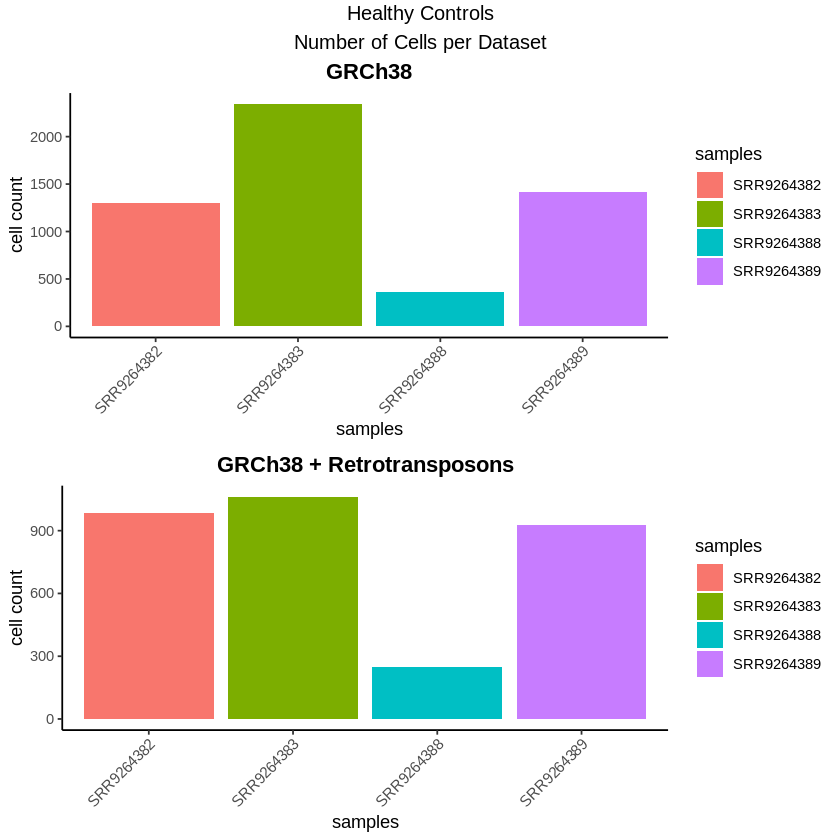

In [50]:
grid.arrange(cellcount_GEs, cellcount_gte, nrow = 2, top="Healthy Controls\nNumber of Cells per Dataset")

- Cell Count - bit concerning that there aren't that [88] has so few cells (<500) compared to the other ones (1250-2250 cells).

UMI per transcript:
- `nCount_RNA = nUMI`
- On the reference genome mapped samples for single cell sequencing, 500-1000 transcripts would be considered too shallow. If majority of cells have > 1000 unique transcripts then that would be acceptable.
- For single nuclei sequencing 

In [27]:
library(RCurl)
library(scales)

In [51]:
# Visualize the number UMIs/transcripts per cell
umi_gte <- gte_brain@meta.data %>% 
    ggplot(aes(color=orig.ident, x=nUMI, fill=orig.ident)) + 
    labs(x = "UMI per Transcript (log10)", y = "log 10 Cell Density") +
    labs(color="samples") + scale_color_discrete(labels = sampleNames) +
    guides(fill=FALSE) + 
    geom_density(alpha = 0.2) + 
    scale_x_log10(labels = comma, limit=c(100, 100000)) + 
    theme_classic() +
    ggtitle("GRCh38 & Retrotransposon") + theme(plot.title = element_text(hjust = 0.5)) +
    geom_vline(xintercept = c(500,1000)) + geom_text(aes(x= 500, label="500\n", y = 1), angle=90, colour="black")

umi_ge <- ge_brain@meta.data %>% 
    ggplot(aes(color=orig.ident, x=nUMI, fill=orig.ident)) + 
    labs(x = "UMI per Transcript (log10)", y = "log 10 Cell Density") +
    labs(color="samples") + scale_color_discrete(labels = sampleNames) +
    guides(fill=FALSE) + 
    geom_density(alpha = 0.2) + 
    scale_x_log10(labels = comma, limit=c(100, 100000)) + 
    theme_classic() +
    ggtitle("GRCh38") + theme(plot.title = element_text(hjust = 0.5)) +
    geom_vline(xintercept = c(500,1000)) + geom_text(aes(x= 500, label="500\n", y = 1), angle=90, colour="black")

In [32]:
# Save figure of UMI per transcript
size = 7
pdf("/home/samkyy/scratch/gete-gbm/results/2021-06-23/r_brain_umipertranscript.pdf", width = size*2, height = size)
grid.arrange(umi_ge, umi_gte, nrow = 1, top="Healthy Controls\nUMI per Transcript")
dev.off()

png 
  2

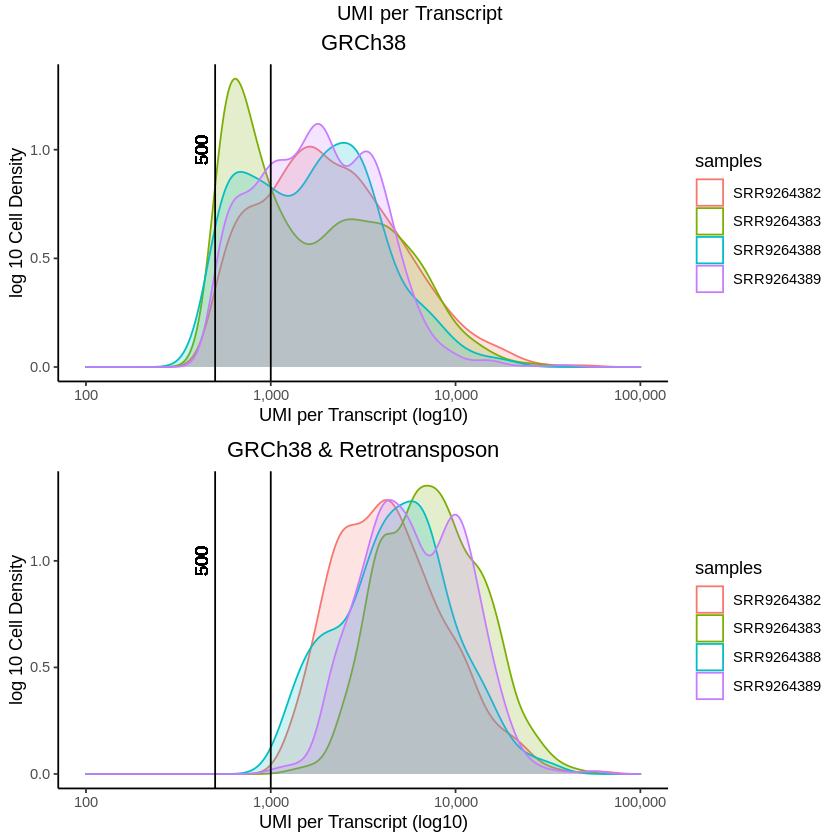

In [52]:
grid.arrange(umi_ge, umi_gte, nrow = 2, top="UMI per Transcript")

- UMI per Transcript - the GRCh8 mapped datasets are all lower than 1000 UMI per Transcript
    - 82 - center is spread to the center
    - 83 - bimodally distributed with one half under 1000 and the minority above 1000.  
    - 88 - also bimodally distributed like 83, but overall higher concentrations than 83
    - 89 - ok, but a third is below the 1000 UMI threshold. 

Genes Detected per cell
- nGene = number of features per cell
- number of genes detected per UMI: More genes detected per UMI, the more complex our data

In [14]:
# Visualize the distribution of genes detected per cell
genesh_ge <- ge_brain@meta.data %>% 
    ggplot(aes(color=orig.ident, x=nGene, fill=orig.ident)) + 
    labs(x = "log 10 Number of Genes Detected per Cell", y = "log 10 Cell Density") +
    labs(color="samples") + scale_color_discrete(labels = sampleNames) +
    guides(fill=FALSE) + 
    geom_density(alpha = 0.2) + 
    theme_classic() +
    scale_x_log10(labels = comma) + 
    geom_vline(xintercept = 300) +
    ggtitle("Subsetted GrCh38")

# Visualize the distribution of genes detected per cell via violin plot
genesv_ge <- ge_brain@meta.data %>% 
    ggplot(aes(x=orig.ident, y=log10(nGene), fill=orig.ident)) + 
    labs(x = "samples", y = "log 10 Number of Genes Detected per Cell") +
    labs(fill="samples") + scale_fill_discrete(labels = sampleNames) +
    geom_violin() + 
    geom_boxplot(width=0.1, fill="white") +
    theme_classic() +
    theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

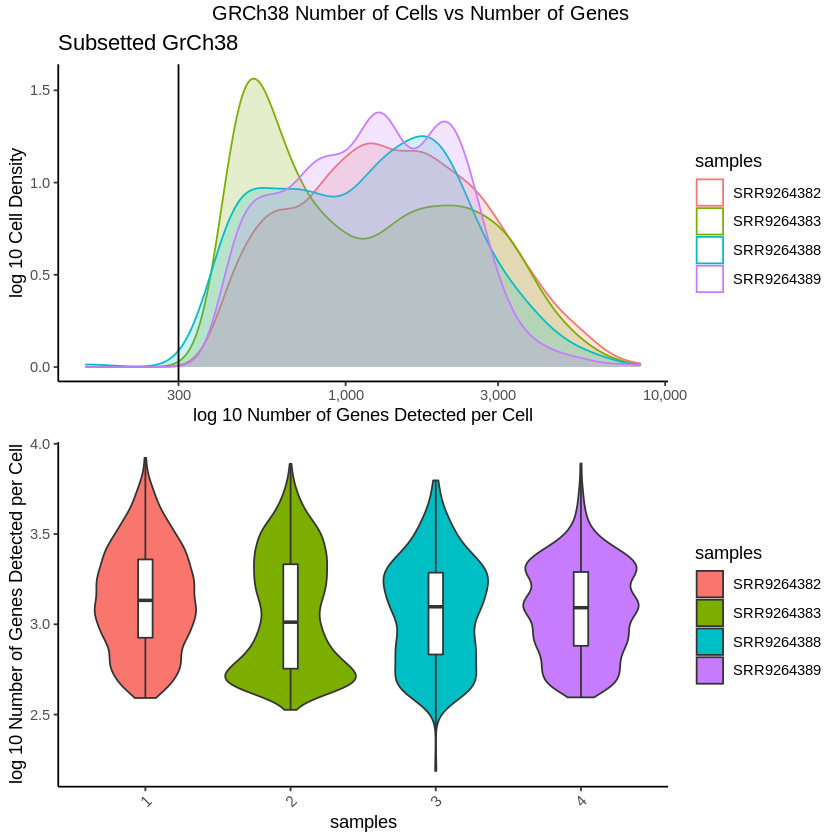

In [15]:
grid.arrange(genesh_ge, genesv_ge, nrow = 2, top = "GRCh38 Number of Cells vs Number of Genes")

In [12]:
# Visualize the distribution of genes detected per cell
genesh_gte <- gte_brain@meta.data %>% 
    ggplot(aes(color=orig.ident, x=nGene, fill=orig.ident)) + 
    labs(x = "log 10 Number of Genes Detected per Cell", y = "log 10 Cell Density") +
    labs(color="samples") + scale_color_discrete(labels = sampleNames) +
    guides(fill=FALSE) + 
    geom_density(alpha = 0.2) + 
    theme_classic() +
    scale_x_log10(labels = comma) + 
    geom_vline(xintercept = 300) +
    ggtitle("Subsetted GrCh38")

# Visualize the distribution of genes detected per cell via violin plot
genesv_gte <- gte_brain@meta.data %>% 
    ggplot(aes(x=orig.ident, y=log10(nGene), fill=orig.ident)) + 
    labs(x = "samples", y = "log 10 Number of Genes Detected per Cell") +
    labs(fill="samples") + scale_fill_discrete(labels = sampleNames) +
    geom_violin() + 
    geom_boxplot(width=0.1, fill="white") +
    theme_classic() +
    theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

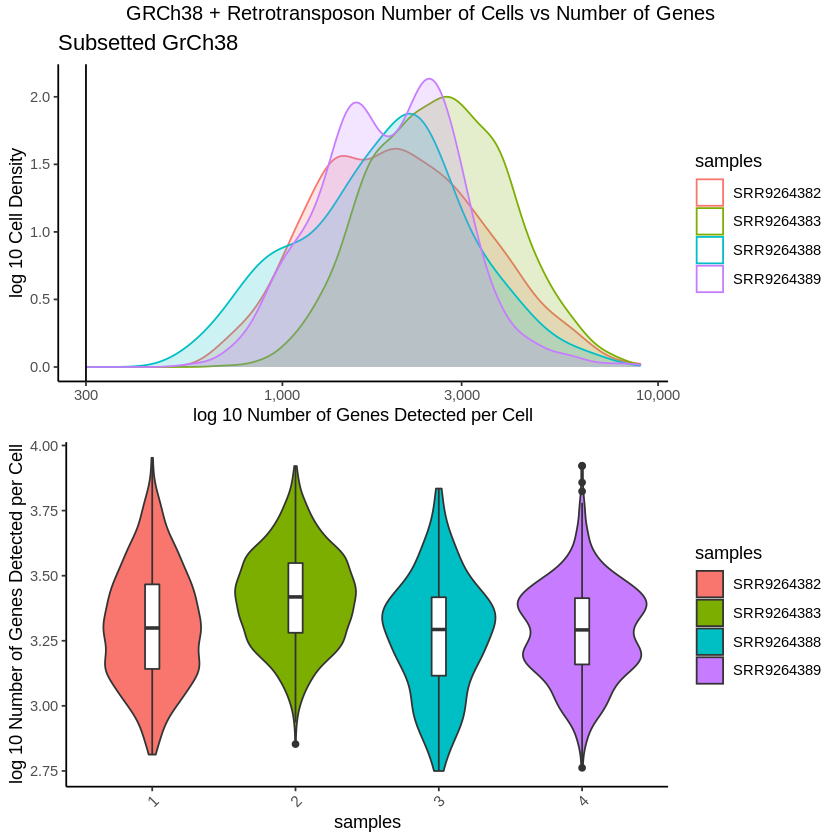

In [13]:
grid.arrange(genesh_gte, genesv_gte, nrow = 2, top = "GRCh38 + Retrotransposon Number of Cells vs Number of Genes")

In [16]:
# Save figure of UMI per transcript
size = 7
pdf("/home/samkyy/scratch/gete-gbm/results/2021-06-23/r_brain_genespercell.pdf", width = size*2, height = size)
grid.arrange(genesh_ge, genesv_ge,
             genesh_gte, genesv_gte, 
             nrow = 2, top="Healthy Controls\nNumber of Cells vs Number of Genes")
dev.off()

png 
  2

They each look quite different from each other, but 82 seems the most out of place due to it lower mean. 

UMI vs Genes detected per cell

In [45]:
# Visualize the correlation between genes detected and number of UMIs 
# and determine whether strong presence of cells with low numbers of genes/UMIs
sampleNames <- list("SRR9264382", "SRR9264383", "SRR9264388", "SRR9264389")
sampleNames_named <- c(`1` = "SRR9264382", `2` = "SRR9264383", `3` = "SRR9264388", `4` = "SRR9264389")

umigenes_ge <- ge_brain@meta.data %>% 
    ggplot(aes(x=nUMI, y=nGene, color=mitoRatio)) + 
    geom_point() + 
    scale_colour_gradient(low = "gray90", high = "black") +
    stat_smooth(method=lm) +
    scale_x_log10(labels = comma) + 
    scale_y_log10() + 
    labs(x = "log 10 UMI per Transcript", y = "log 10 Genes Detected per Cell") +
    theme_classic() +
    geom_vline(xintercept = 500) +
    geom_hline(yintercept = 250) +
    facet_wrap(~orig.ident, labeller = as_labeller(sampleNames_named)) + 
    theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    ggtitle("GRCh38") + theme(plot.title = element_text(hjust=0.5, face="bold"))

umigenes_gte <- gte_brain@meta.data %>% 
    ggplot(aes(x=nUMI, y=nGene, color=mitoRatio)) + 
    geom_point() + 
    scale_colour_gradient(low = "gray90", high = "black") +
    stat_smooth(method=lm) +
    scale_x_log10(labels = comma) + 
    scale_y_log10() + 
    labs(x = "log 10 UMI per Transcript", y = "log 10 Genes Detected per Cell") +
    theme_classic() +
    geom_vline(xintercept = 500) + # Threshold for UMI per transcript. 
    geom_hline(yintercept = 250) + # Threshold for Genes detected per cell
    facet_wrap(~orig.ident, labeller = as_labeller(sampleNames_named)) + 
    theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    ggtitle("GRCh38 & Retrotransposon") + theme(plot.title = element_text(hjust=0.5, face="bold"))

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



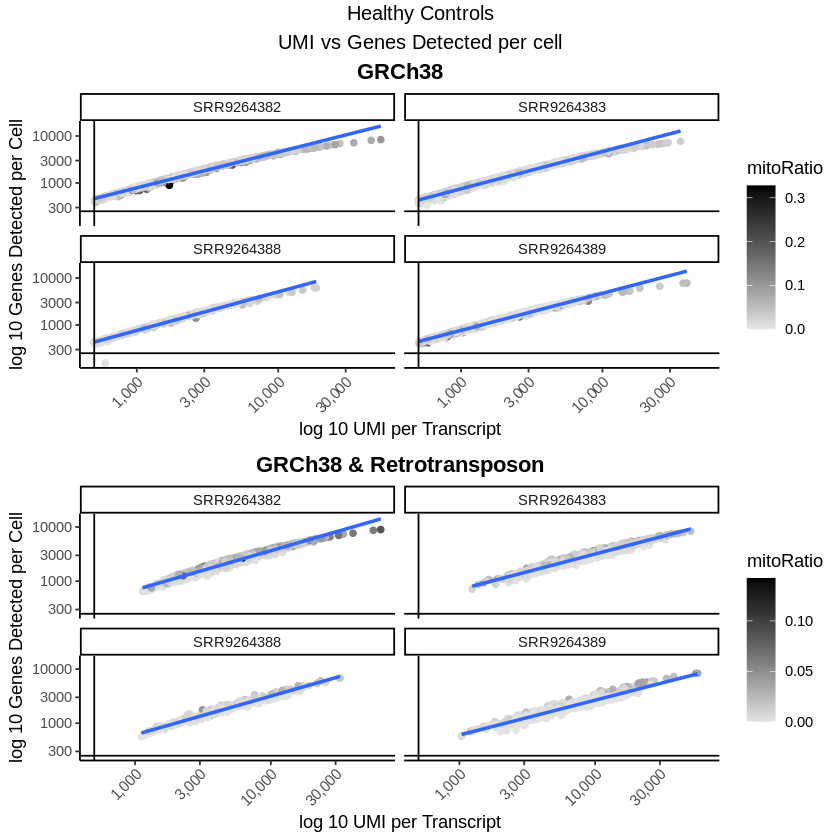

In [46]:
grid.arrange(umigenes_ge, umigenes_gte, nrow = 2, top = "Healthy Controls\nUMI vs Genes Detected per cell")

In [47]:
# Save figure of UMI vs Genes per cell
size = 7
pdf("/home/samkyy/scratch/gete-gbm/results/2021-06-23/r_brain_umigenes.pdf", width = size*2, height = size)
grid.arrange(umigenes_ge, umigenes_gte, nrow = 1, top="Healthy Controls\nUMI vs Genes Detected per cell")
dev.off()

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



png 
  2

- Unfortunately in the combined dataset, the mitochondrial ratio is pretty high in cells with high UMI per transcript and high Genes per Cell
- Cells with high UMI per Transcript have low Genes detected per cell. 

Let's verify if cells with high mitochondrial ratio is due to cell death with Mitochondrial Ratio:

- `mitoRatio = PercentageFeatureSet(object = gte_gbmsc, pattern = "^MT-")`
- `mitochondrial ratio`: Percent of genes originating from the mitochondria
    - The pattern provided (“^MT-“) works for human gene names, so check what the pattern is if working with other organims, depending on the reference genome used, the prefix for mitochondrial genes may be different too: (ie “mt-“, “mt.”, or “MT_”...)

In [52]:
# Visualize the distribution of mitochondrial gene expression detected per cell
mito_ge <- ge_brain@meta.data %>% 
    ggplot(aes(color=orig.ident, x=mitoRatio, fill=orig.ident)) + 
    labs(x = "Mitochondrial Ratio", y = "log 10 Cell Density") +
    labs(color="samples") + scale_color_discrete(labels = sampleNames) +
    guides(fill=FALSE) + 
    geom_density(alpha = 0.2) + 
    scale_x_log10() + 
    theme_classic() +
    geom_vline(xintercept = 0.2) + 
    ggtitle("GRCh38") + theme(plot.title = element_text(hjust = 0.5))

mito_gte <- gte_brain@meta.data %>% 
    ggplot(aes(color=orig.ident, x=mitoRatio, fill=orig.ident)) + 
    labs(x = "Mitochondrial Ratio", y = "log 10 Cell Density") +
    labs(color="samples") + scale_color_discrete(labels = sampleNames) +
    guides(fill=FALSE) + 
    geom_density(alpha = 0.2) + 
    scale_x_log10() + 
    theme_classic() +
    geom_vline(xintercept = 0.2) + 
    ggtitle("GRCh38 & Retrotransposon") + theme(plot.title = element_text(hjust = 0.5))

Warning message:
"Transformation introduced infinite values in continuous x-axis"
Warning message:
"Removed 61 rows containing non-finite values (stat_density)."
Warning message:
"Transformation introduced infinite values in continuous x-axis"
Warning message:
"Removed 23 rows containing non-finite values (stat_density)."


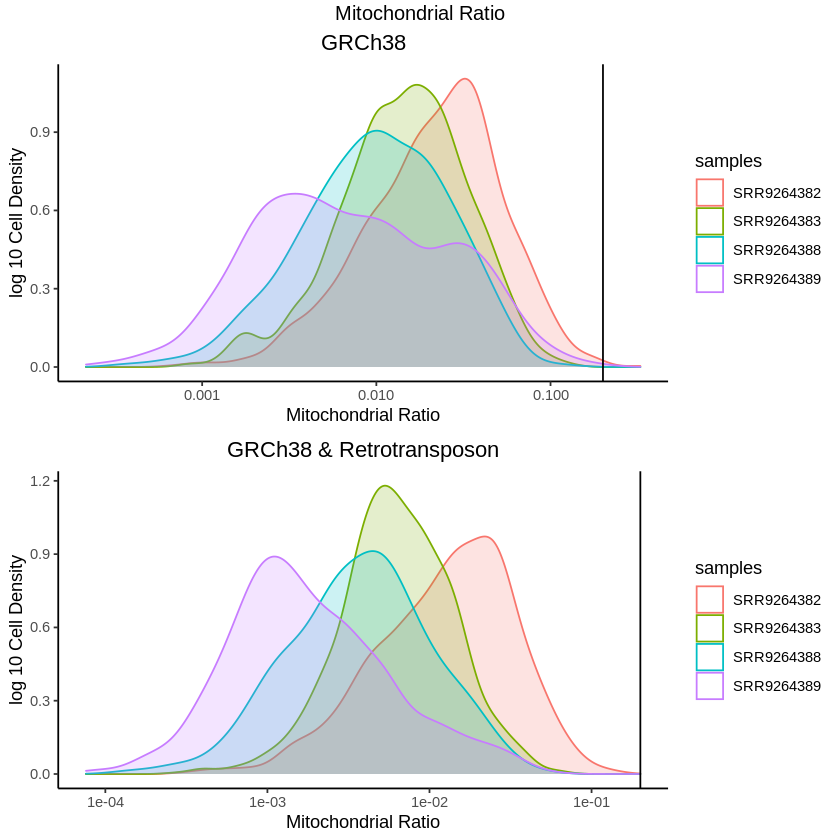

In [53]:
grid.arrange(mito_ge, mito_gte, nrow = 2, top = "Mitochondrial Ratio")

In [54]:
# Save figure of UMI per transcript
size = 7
pdf("/home/samkyy/scratch/gete-gbm/results/2021-06-23/r_brain_mitoratio.pdf", width = size*2, height = size)
grid.arrange(mito_ge, mito_gte, nrow = 1, top="Healthy Controls\nMitochondiral Ratio vs Counts")
dev.off()

Warning message:
"Transformation introduced infinite values in continuous x-axis"
Warning message:
"Removed 61 rows containing non-finite values (stat_density)."
Warning message:
"Transformation introduced infinite values in continuous x-axis"
Warning message:
"Removed 23 rows containing non-finite values (stat_density)."


png 
  2

There shouldn't be that many mitochondrial genes with this dataset since it was a single nuclei experiment. This is refelcted in the figures above. 

Novelty Genes: Complexity
- `log10GenesPerUMI = log10(ge_gbmsc$nFeature_RNA) / log10(ge_gbmsc$nCount_RNA)`
- Low complexity cells can indicate contamination in the sample. This is determined by the `log10GenesPerUMI`

In [10]:
# Visualize the overall complexity of the gene expression by visualizing the genes detected per UMI
newgenes_ge <- ge_brain@meta.data %>%
    ggplot(aes(x=log10GenesPerUMI, color = orig.ident, fill=orig.ident)) +
    labs(x = "log 10 Genes Detected Per UMI per Transcript", y = "Cell Count") +
    labs(color="samples") + scale_color_discrete(labels = sampleNames) +
    guides(fill=FALSE) + 
    geom_density(alpha = 0.2) +
    theme_classic() +
    geom_vline(xintercept = 0.8) + 
    ggtitle("GRCh38") + theme(plot.title = element_text(hjust = 0.5))

newgenes_gte <- gte_brain@meta.data %>%
    ggplot(aes(x=log10GenesPerUMI, color = orig.ident, fill=orig.ident)) +
    labs(x = "log 10 Genes Detected Per UMI per Transcript", y = "Cell Count") +
    labs(color="samples") + scale_color_discrete(labels = sampleNames) +
    guides(fill=FALSE) + 
    geom_density(alpha = 0.2) +
    theme_classic() +
    geom_vline(xintercept = 0.8) + 
    ggtitle("GRCh38 + Retrotransposons") + theme(plot.title = element_text(hjust = 0.5))

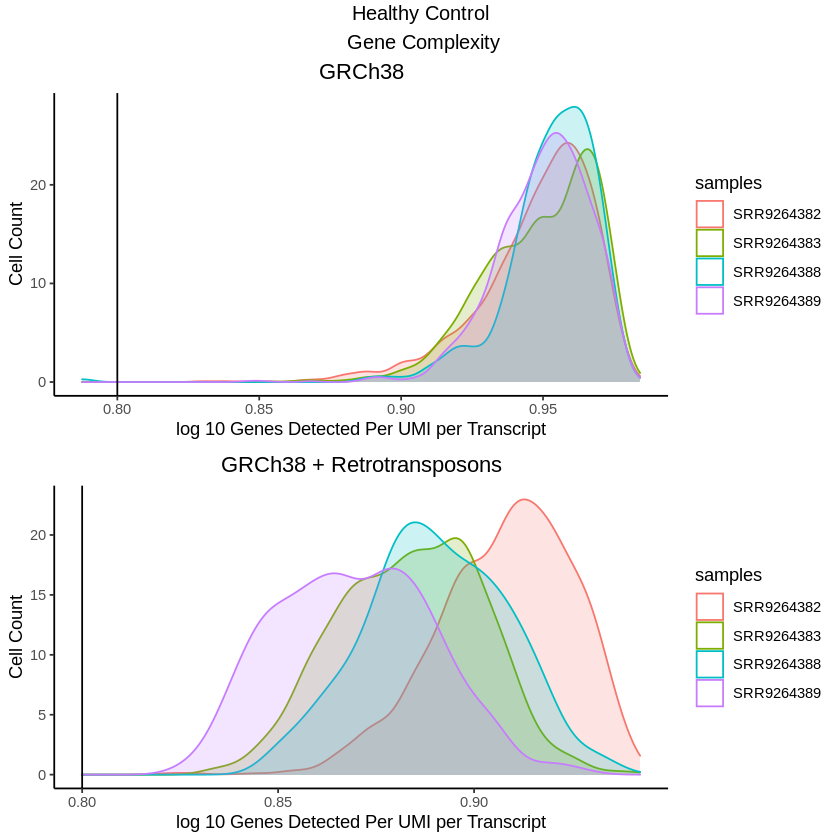

In [11]:
grid.arrange(newgenes_ge, newgenes_gte, nrow = 2, top = "Healthy Control\n Gene Complexity")

In [59]:
# Save figure of UMI vs Genes per cell
size = 7
pdf("/home/samkyy/scratch/gete-gbm/results/2021-06-23/r_GBMSC_newgenes.pdf", width = size*2, height = size)
grid.arrange(newgenes_ge, newgenes_gte, nrow = 1, top="Healthy Control\nGene Complexity")
dev.off()

png 
  2

Interestingly it's much higher compared to the GBMSC and Neuroblastoma combined dataset.

###<div class="cite2c-biblio"></div> Filter Cells

2021-06-23 --> 2021-06-30

In [4]:
load("/home/samkyy/scratch/gete-gbm/results/2021-06-15/ge_brain.RData")
load("/home/samkyy/scratch/gete-gbm/results/2021-06-15/gte_brain.RData")

In [239]:
dim(ge_brain) # 3224 cells
dim(gte_brain)  # 5421 cells

## Filter reference + glioblastoma mapped data
# gte_brain.filt <- subset(x = gte_brain, subset= (nUMI >= 1000) & 
#                                                 (nGene >= 300) & 
#                                                 (log10GenesPerUMI > 0.80) & 
#                                                 (mitoRatio < 0.20))

## Match rows of ge_brain to gte_brain
# barcode <- colnames(gte_brain.filt)
# ge_brain.filt <- subset(ge_brain, cells=barcode)
# dim(gte_brain.filt)# 3224 cells
# dim(ge_brain.filt) # 3224 cells

# dim(ge_gbmsc)[2] - dim(filt_ge_gbmsc)[2] # filtered out 0 cells
# dim(gte_gbmsc)[2] - dim(filt_gte_gbmsc)[2] # filtered out 0 cells

[1] 26130  5421

[1] 26893  3224

[1] 26893  3224

[1] 26130  3224

In [240]:
## Filter reference + glioblastoma mapped data
ge_brain.filt <- subset(x = ge_brain, subset=   (nUMI >= 500) & 
                                                (nGene >= 300) & 
                                                (log10GenesPerUMI > 0.80) & 
                                                (mitoRatio < 0.20))

## Match rows of ge_brain to gte_brain
barcode <- colnames(ge_brain.filt)
gte_brain.filt <- subset(gte_brain, cells=barcode)
dim(gte_brain.filt)# 3224 cells
dim(ge_brain.filt) # 3224 cells

dim(gte_brain)[2] - dim(gte_brain.filt)[2] # filtered out 0 cells
dim(ge_brain)[2] - dim(ge_brain.filt)[2] # filtered out 3 cells

[1] 26893  3224

[1] 26130  5418

[1] 0

[1] 3

In [241]:
save(ge_brain.filt, file="/home/samkyy/scratch/gete-gbm/results/2021-06-30/ge_brain.filtc.RData")
save(gte_brain.filt, file="/home/samkyy/scratch/gete-gbm/results/2021-06-30/gte_brain.filt.RData")
# load("/home/samkyy/scratch/gete-gbm/results/2021-06-30/ge_brainQC.RData")
# load("/home/samkyy/scratch/gete-gbm/results/2021-06-30/gte_brainQC.RData")

## QC: Seurat Vignette
2021-07-22:

In [104]:
load("/home/samkyy/scratch/gete-gbm/results/2021-07-22/ge_brainQC.RData")
load("/home/samkyy/scratch/gete-gbm/results/2021-07-22/gte_brainQC.RData")

In [22]:
head(ge_brain@meta.data)
head(gte_brain@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,log10GenesPerUMI,mitoRatio,cells,sample,age,sex,nUMI,nGene
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<fct>,<dbl>,<int>
AAACCTGGTCCATGAT-1,1,3505,2106,0.9375884,1.255350,AAACCTGGTCCATGAT-1,SRR9264382,44,F,3505,2106
AAACGGGAGTAGCCGA-1,1,1747,1273,0.9576027,1.316543,AAACGGGAGTAGCCGA-1,SRR9264382,44,F,1747,1273
AAACGGGAGTGCAAGC-1,1,540,429,0.9634253,13.148148,AAACGGGAGTGCAAGC-1,SRR9264382,44,F,540,429
AAACGGGCATCGGTTA-1,1,4217,2521,0.9383640,2.798198,AAACGGGCATCGGTTA-1,SRR9264382,44,F,4217,2521
AAACGGGTCCATGAAC-1,1,4203,2414,0.9335399,2.712348,AAACGGGTCCATGAAC-1,SRR9264382,44,F,4203,2414
AAAGATGCACGACTCG-1,1,5060,2778,0.9296955,1.205534,AAAGATGCACGACTCG-1,SRR9264382,44,F,5060,2778


,orig.ident,nCount_RNA,nFeature_RNA,log10GenesPerUMI,mitoRatio,cells,sample,age,sex,nUMI,nGene
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<fct>,<dbl>,<int>
AAACCTGGTCCATGAT-1,1,6119,2476,0.8962337,0.7190717,AAACCTGGTCCATGAT-1,SRR9264382,44,F,6119,2476
AAACGGGAGTAGCCGA-1,1,3178,1544,0.9104818,0.7237256,AAACGGGAGTAGCCGA-1,SRR9264382,44,F,3178,1544
AAACGGGCATCGGTTA-1,1,5990,2820,0.9133861,1.9699499,AAACGGGCATCGGTTA-1,SRR9264382,44,F,5990,2820
AAACGGGTCCATGAAC-1,1,5586,2694,0.9154804,2.0408163,AAACGGGTCCATGAAC-1,SRR9264382,44,F,5586,2694
AAAGATGCACGACTCG-1,1,7335,3131,0.9043522,0.8316292,AAAGATGCACGACTCG-1,SRR9264382,44,F,7335,3131
AAAGCAACACCGGAAA-1,1,3573,1538,0.8969678,0.3358522,AAAGCAACACCGGAAA-1,SRR9264382,44,F,3573,1538


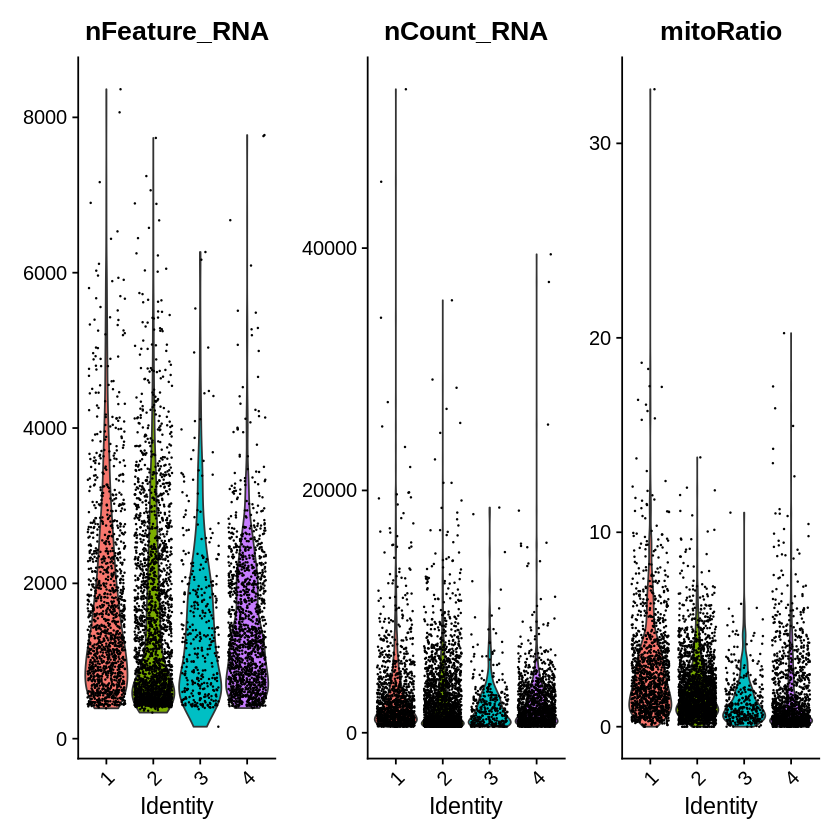

png 
  2

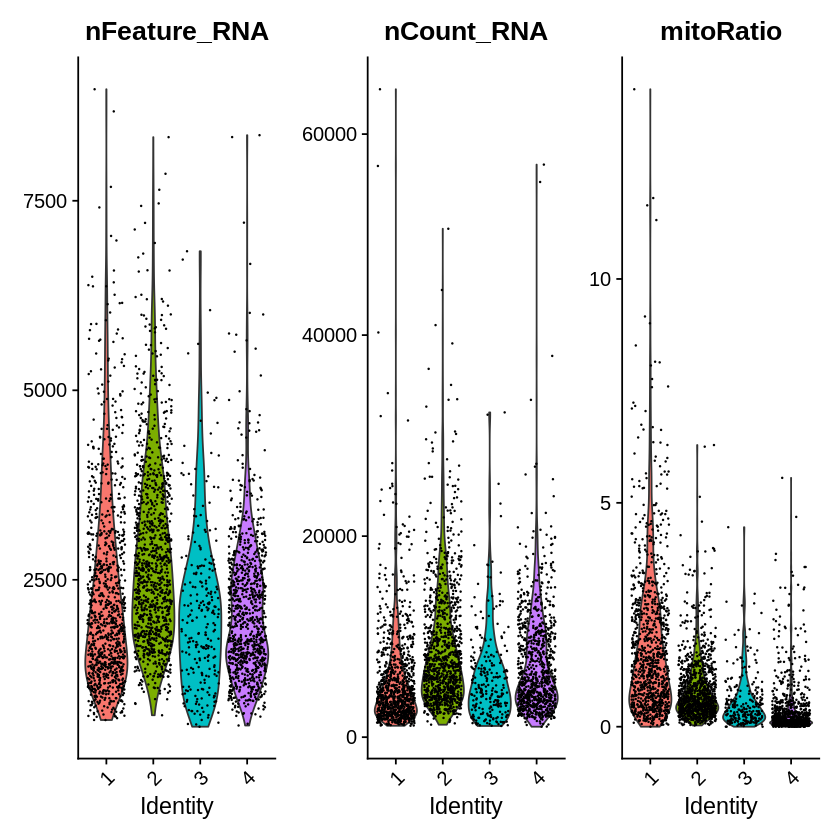

In [30]:
# Visualize QC metrics as a violin plot
p <- VlnPlot(ge_brain, features = c("nFeature_RNA", "nCount_RNA", "mitoRatio"), ncol = 3)
p2 <- VlnPlot(gte_brain, features = c("nFeature_RNA", "nCount_RNA", "mitoRatio"), ncol = 3)
p
p2

# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_Gene_Count_MitoRatio.pdf", 
    width = size*2, height = size*2)
grid.arrange(p[[1]], p[[2]],p[[3]],
             p2[[1]], p2[[2]], p2[[3]], nrow=2, 
             top = "Healthy Brain samples\nhg38", bottom = "Healthy Brain samples\nhg38+Retrotransposons")
dev.off()

In [40]:
summary(ge_brain$nFeature_RNA)
summary(gte_brain$nFeature_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    154     662    1214    1537    2081    8362 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    562    1540    2180    2412    2991    8971 

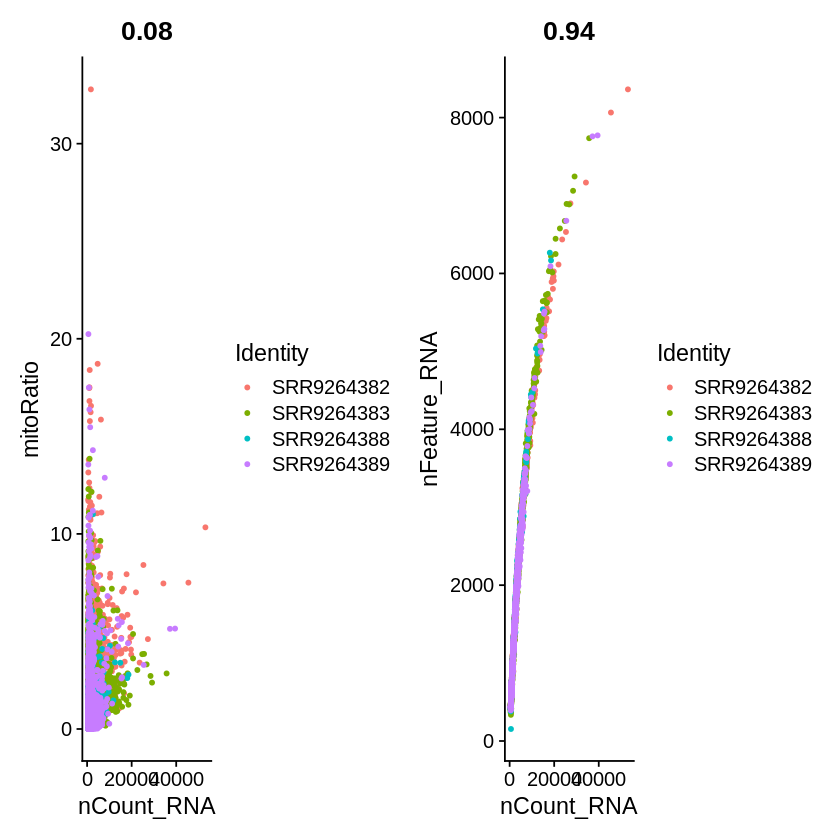

png 
  2

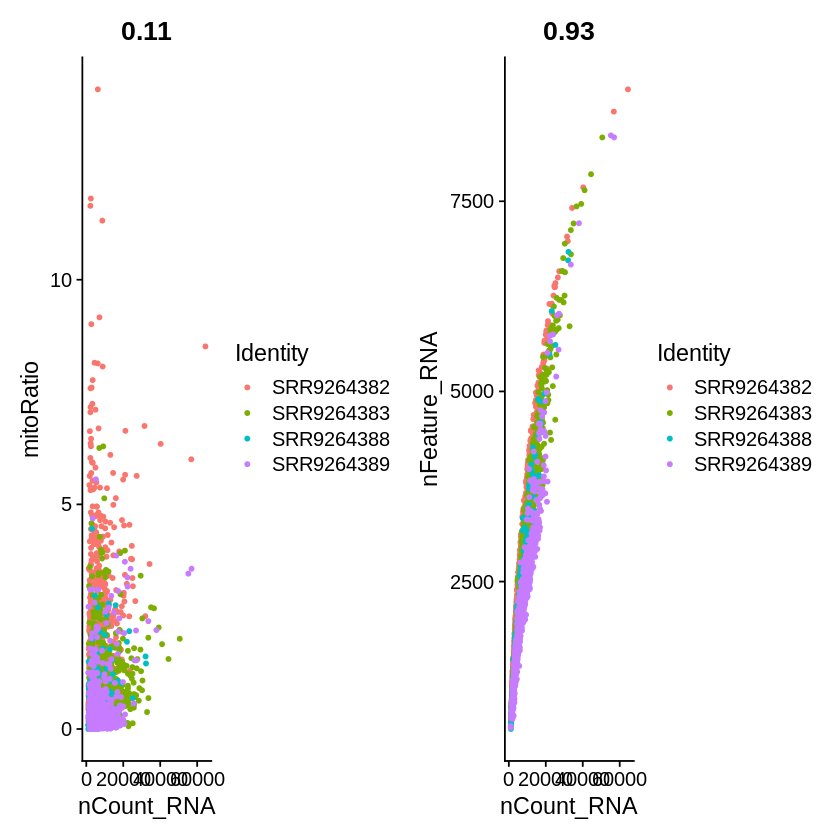

In [37]:
# FeatureScatter is typically used to visualize feature-feature relationships, but can be used
# for anything calculated by the object, i.e. columns in object metadata, PC scores etc.

p <- FeatureScatter(ge_brain, feature1 = "nCount_RNA", feature2 = "mitoRatio", group.by = "sample") 
p2 <- FeatureScatter(ge_brain, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by = "sample")
p + p2
p3 <- FeatureScatter(gte_brain, feature1 = "nCount_RNA", feature2 = "mitoRatio", group.by = "sample") 
p4 <- FeatureScatter(gte_brain, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by = "sample")
p3 + p4

# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_FeatureScatter.pdf", 
    width = size*2, height = size*1)
grid.arrange(p,p2, nrow=1, 
             top = "Healthy Brain samples\nhg38")
grid.arrange(p3,p4, nrow =1,
             top = "Healthy Brain samples\nhg38+Retrotransposons")
dev.off()

### Filter Cells_v1
2021-07-22:

In [48]:
gte_brain.filt <- subset(gte_brain, subset = nFeature_RNA > 500 & 
                                       nFeature_RNA < 6000 & 
                                       mitoRatio < 5)

In [49]:
## Match rows of ge_brain to gte_brain
barcode <- colnames(gte_brain.filt)
ge_brain.filt <- subset(ge_brain, cells=barcode)
dim(gte_brain.filt)# 3132 cells
dim(ge_brain.filt) # 3132 cells

dim(gte_brain)[2] - dim(gte_brain.filt)[2] # filtered out 92 cells
dim(ge_brain)[2] - dim(ge_brain.filt)[2] # filtered out 2289 cells

[1] 26893  3132

[1] 26130  3132

[1] 92

[1] 2289

In [50]:
mkdirToday()
save(ge_brain.filt, file="~/scratch/gete-gbm/results/2021-07-22/ge_brain.filt.RData")
save(gte_brain.filt, file="~/scratch/gete-gbm/results/2021-07-22/gte_brain.filt.RData")

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-07-22"


Warning message in dir.create(file.path(maindir, subdir)):
“'/home/samkyy/scratch/gete-gbm/results/2021-07-22' already exists”


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-07-22"


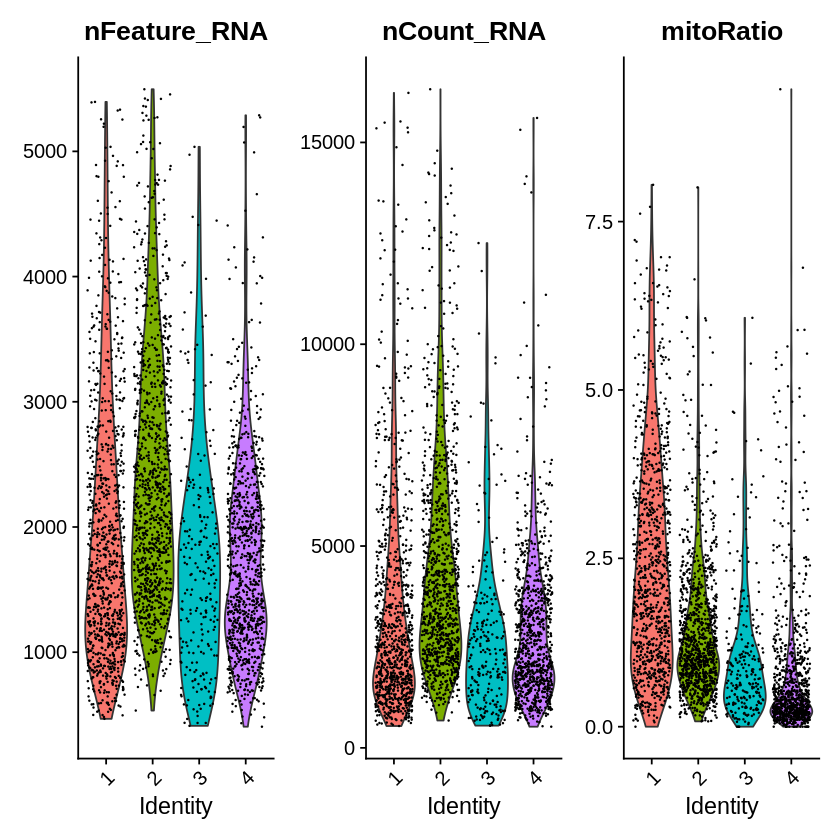

png 
  2

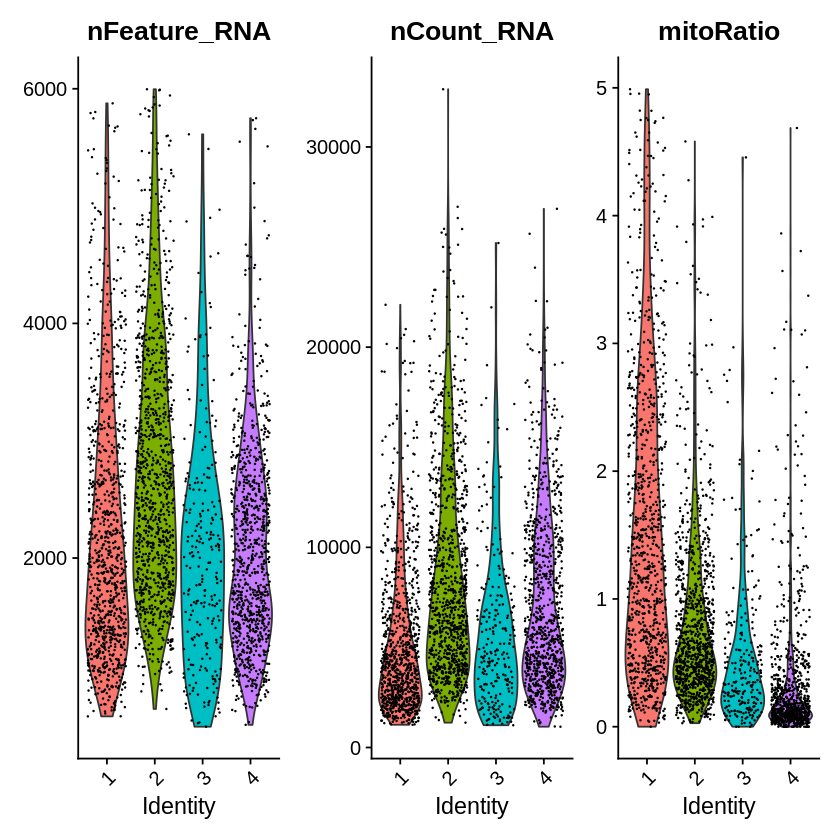

In [51]:
# Visualize QC metrics as a violin plot
p <- VlnPlot(ge_brain.filt, features = c("nFeature_RNA", "nCount_RNA", "mitoRatio"), ncol = 3)
p2 <- VlnPlot(gte_brain.filt, features = c("nFeature_RNA", "nCount_RNA", "mitoRatio"), ncol = 3)
p
p2

# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brainfilt_Gene_Count_MitoRatio.pdf", 
    width = size*2, height = size*2)
grid.arrange(p[[1]], p[[2]],p[[3]],
             p2[[1]], p2[[2]], p2[[3]], nrow=2, 
             top = "Filtered Healthy Brain samples\nhg38", bottom = "Filtered Healthy Brain samples\nhg38+Retrotransposons")
dev.off()

In [52]:
summary(ge_brain.filt$nFeature_RNA)
summary(gte_brain.filt$nFeature_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    405    1270    1846    2023    2544    5496 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    562    1537    2160    2346    2921    5996 

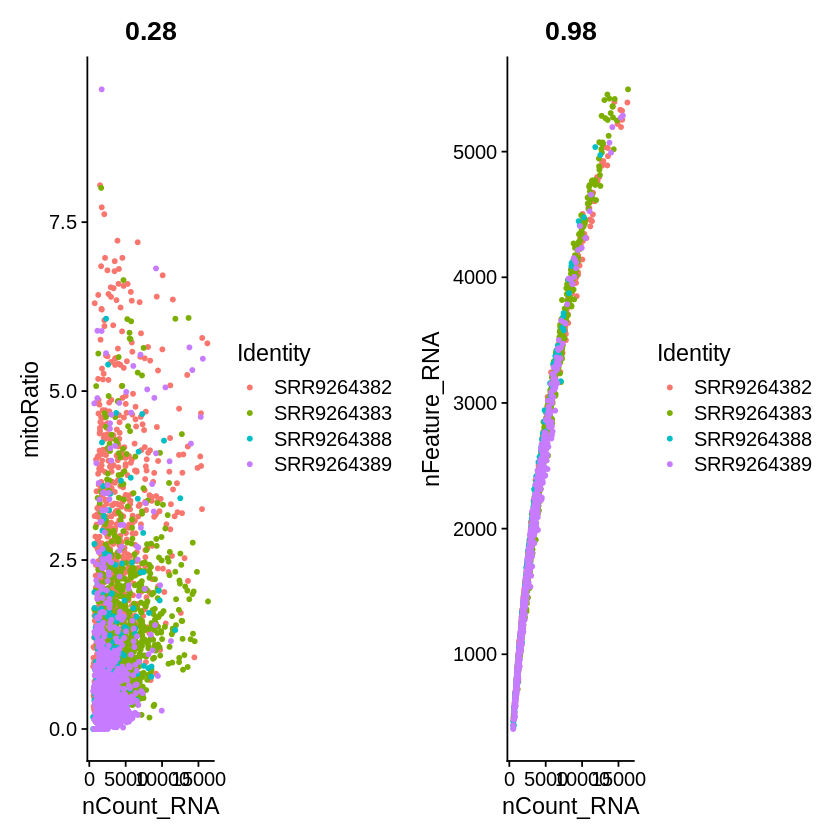

png 
  2

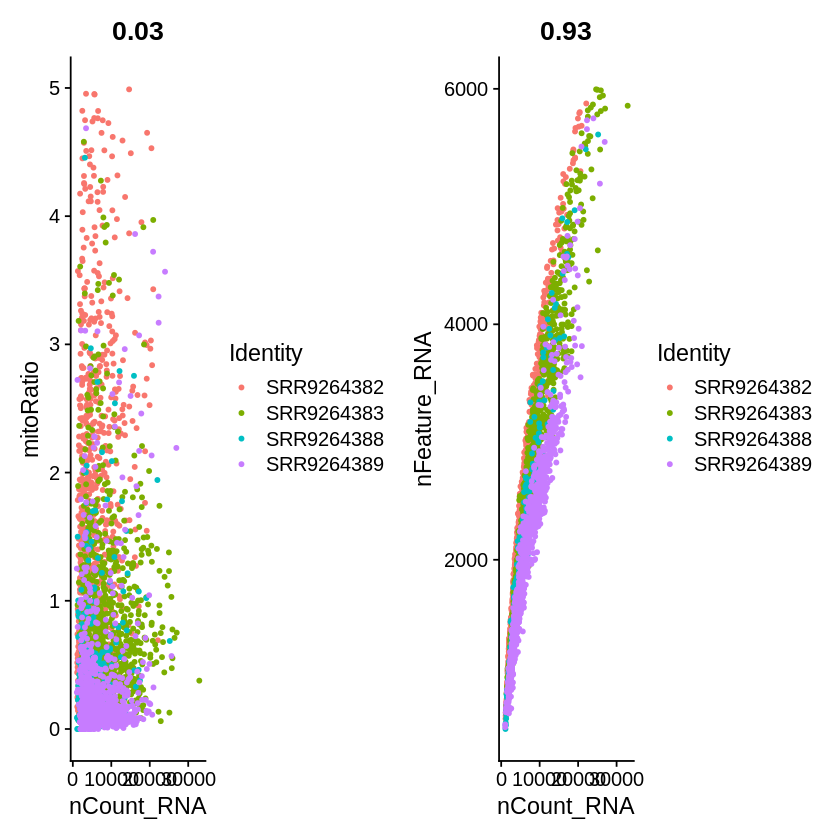

In [53]:
# FeatureScatter is typically used to visualize feature-feature relationships, but can be used
# for anything calculated by the object, i.e. columns in object metadata, PC scores etc.

p <- FeatureScatter(ge_brain.filt, feature1 = "nCount_RNA", feature2 = "mitoRatio", group.by = "sample") 
p2 <- FeatureScatter(ge_brain.filt, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by = "sample")
p + p2
p3 <- FeatureScatter(gte_brain.filt, feature1 = "nCount_RNA", feature2 = "mitoRatio", group.by = "sample") 
p4 <- FeatureScatter(gte_brain.filt, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by = "sample")
p3 + p4

# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brainfilt_FeatureScatter.pdf", 
    width = size*2, height = size*1)
grid.arrange(p,p2, nrow=1, 
             top = "Filtered Healthy Brain samples\nhg38")
grid.arrange(p3,p4, nrow =1,
             top = "Filtered Healthy Brain samples\nhg38+Retrotransposons")
dev.off()

## Normalization & FindVariable

In [56]:
load("~/scratch/gete-gbm/results/2021-07-22/ge_brain.filt.RData")
load("~/scratch/gete-gbm/results/2021-07-22/gte_brain.filt.RData")

In [97]:
source("~/scratch/gete-gbm/bin/util_seurat.R")

In [70]:
# intObjects <- integrateObjects(s_obj = list(ge_brain.filt, gte_brain.filt), meta.group = "sample")
    ## Will sample 3, because there are too few samples and so throws LOESS errors. 

Number of seurat objects:  2 
Splitting seurat objects by sample 


Centering and scaling data matrix



Normalize object:  1 by sample 
Processing sample : 1 
Processing sample : 2 
Processing sample : 3 


Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -2.0917”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.30103”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  1.1756e-16”


Processing sample : 4 


Computing 2000 integration features

Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2599 anchors

Filtering anchors

	Retained 2048 anchors

Running CCA

Merging objects



In [73]:
## Remove Sample 3
ge_brain.filt <- subset(ge_brain.filt, subset = (sample != "SRR9264388"))
unique(ge_brain.filt$sample)
gte_brain.filt <- subset(gte_brain.filt, subset = (sample != "SRR9264388"))
unique(gte_brain.filt$sample)

[1] SRR9264382 SRR9264383 SRR9264389
Levels: SRR9264382 SRR9264383 SRR9264388 SRR9264389

[1] SRR9264382 SRR9264383 SRR9264389
Levels: SRR9264382 SRR9264383 SRR9264388 SRR9264389

In [74]:
mkdirToday()
save(ge_brain.filt, file="~/scratch/gete-gbm/results/2021-07-22/ge_brain.filt-ex3.RData")
save(gte_brain.filt, file="~/scratch/gete-gbm/results/2021-07-22/gte_brain.filt-ex3.RData")

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-07-22"


Warning message in dir.create(file.path(maindir, subdir)):
“'/home/samkyy/scratch/gete-gbm/results/2021-07-22' already exists”


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-07-22"


In [84]:
intObjects <- mostVariableFeatures(s_obj = list(ge_brain.filt, gte_brain.filt), meta.group = "sample")

Number of seurat objects:  2 
Splitting seurat objects by sample 


Centering and scaling data matrix



Normalize object:  1 by sample 
Processing sample : 1 
Processing sample : 2 
Processing sample : 3 


Centering and scaling data matrix



Normalize object:  2 by sample 
Processing sample : 1 
Processing sample : 2 
Processing sample : 3 


Number of seurat objects:  2 


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 4839 rows containing missing values (geom_point).”


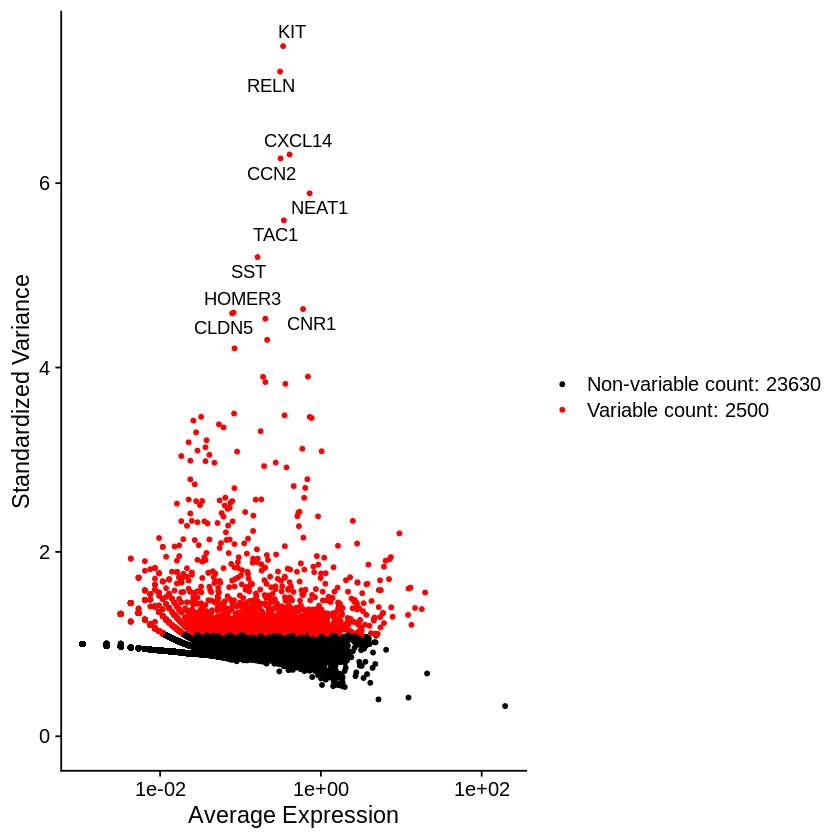

In [101]:
p <- top10VarFeatures(intObjects)
p[[1]][[1]]

In [103]:
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_top10VariableFeaturesbySample.pdf", 
    width = size*3, height = size*1.5)
grid.arrange(p[[1]][[1]], p[[1]][[2]],p[[1]][[3]],
             p[[2]][[1]], p[[2]][[2]],p[[2]][[3]], nrow=2, 
             top = "Healthy Brain samples\nhg38", bottom = "Healthy Brain samples\nhg38+Retrotransposons")
dev.off()

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 4839 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 3082 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 3920 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 4485 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 2706 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 3558 rows containing missing values (geom_point).”


png 
  2

### Filter Cells_v2
2021-07-22:  Filtering a second time, because the first time MT genes were counted amongst the top 10 most variables genes for sample 4. The object used was made in the "Normalize and FindVariable" section

In [115]:
load("~/scratch/gete-gbm/results/2021-07-22/ge_brain.filt-ex3.RData")
load("~/scratch/gete-gbm/results/2021-07-22/gte_brain.filt-ex3.RData")

In [116]:
barcodes_sample4 <- colnames(subset(gte_brain.filt, subset = orig.ident == "4" &
                                                           nFeature_RNA > 500 & 
                                                           nFeature_RNA < 4500 & 
                                                           mitoRatio < 2.5))

In [117]:
barcodes_sample_1_2 <-colnames(subset(gte_brain.filt, subset = orig.ident == "1" | orig.ident == "2"))

In [125]:
summary(barcodes_sample4 %in% barcodes_sample_1_2)
summary(barcodes_sample_1_2 %in% barcodes_sample4)

   Mode   FALSE 
logical     895 

   Mode   FALSE 
logical    1966 

In [127]:
## Match rows of ge_brain to gte_brain
ge_brain.filt <- subset(ge_brain.filt, cells=c(barcodes_sample_1_2, barcodes_sample4))
gte_brain.filt <- subset(gte_brain.filt, cells=c(barcodes_sample_1_2, barcodes_sample4))

dim(gte_brain.filt)# 2861 cells
dim(ge_brain.filt) # 2861 cells

dim(gte_brain)[2] - dim(gte_brain.filt)[2] # filtered out 92-->363 cells
dim(ge_brain)[2] - dim(ge_brain.filt)[2] # filtered out 2289-->2560 cells

[1] 26893  2861

[1] 26130  2861

[1] 363

[1] 2560

In [128]:
mkdirToday()
save(ge_brain.filt, file="~/scratch/gete-gbm/results/2021-07-22/ge_brain.filt-ex3_v2.RData")
save(gte_brain.filt, file="~/scratch/gete-gbm/results/2021-07-22/gte_brain.filt-ex3_v2.RData")

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-07-22"


Warning message in dir.create(file.path(maindir, subdir)):
“'/home/samkyy/scratch/gete-gbm/results/2021-07-22' already exists”


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-07-22"


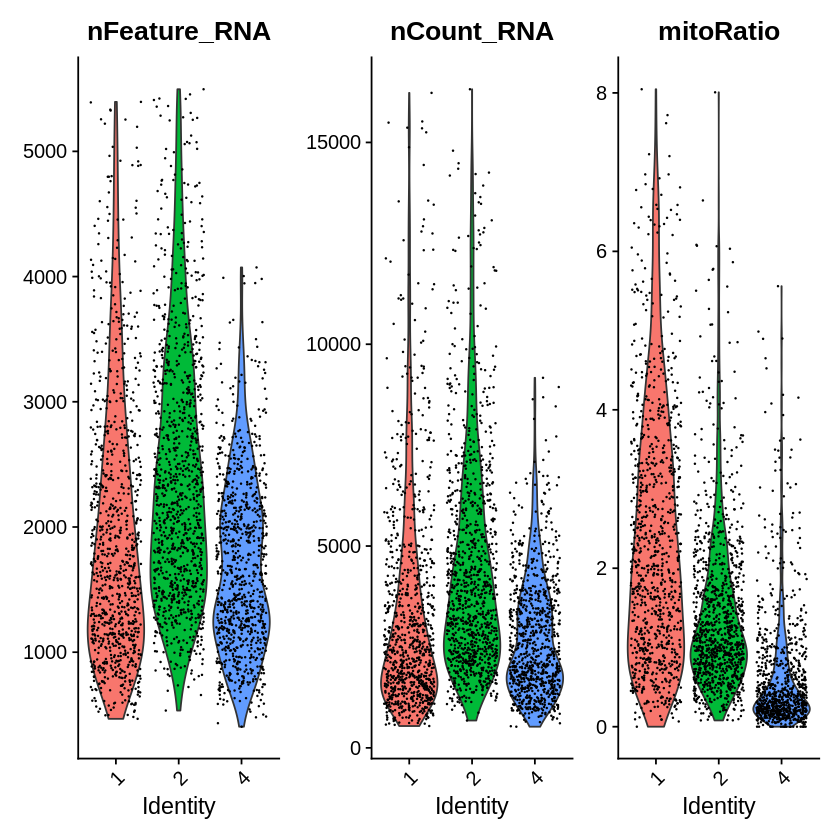

png 
  2

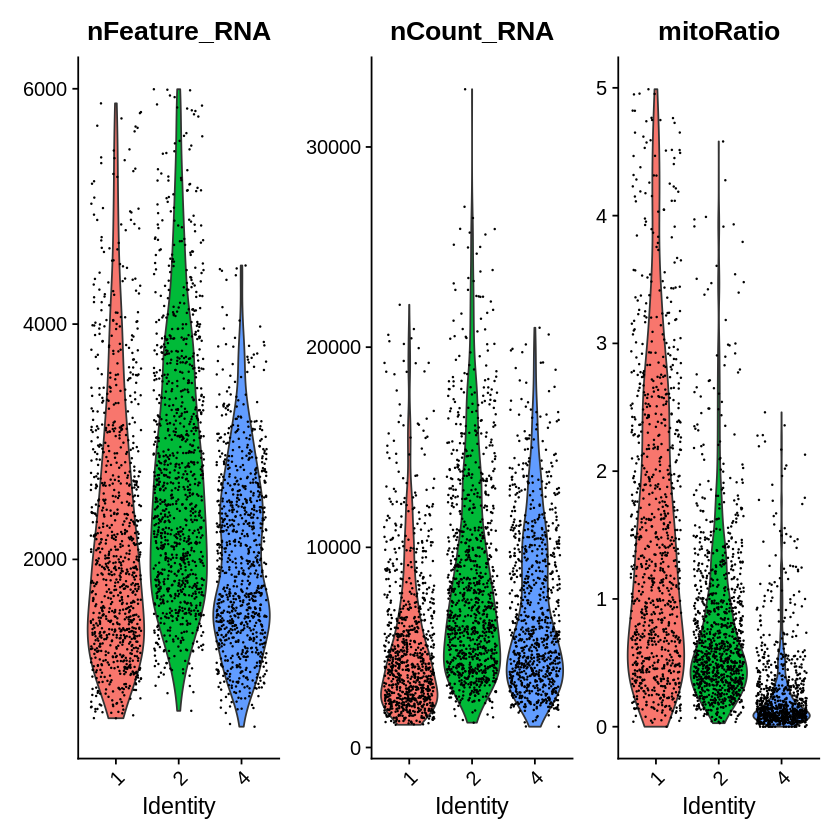

In [129]:
# Visualize QC metrics as a violin plot
p <- VlnPlot(ge_brain.filt, features = c("nFeature_RNA", "nCount_RNA", "mitoRatio"), ncol = 3)
p2 <- VlnPlot(gte_brain.filt, features = c("nFeature_RNA", "nCount_RNA", "mitoRatio"), ncol = 3)
p
p2

# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brainfilt_Gene_Count_MitoRatio_v2.pdf", 
    width = size*2, height = size*2)
grid.arrange(p[[1]], p[[2]],p[[3]],
             p2[[1]], p2[[2]], p2[[3]], nrow=2, 
             top = "Filtered Healthy Brain samples\nhg38", bottom = "Filtered Healthy Brain samples\nhg38+Retrotransposons")
dev.off()

In [130]:
summary(ge_brain.filt$nFeature_RNA)
summary(gte_brain.filt$nFeature_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    405    1280    1862    2034    2565    5496 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    578    1544    2180    2358    2937    5996 

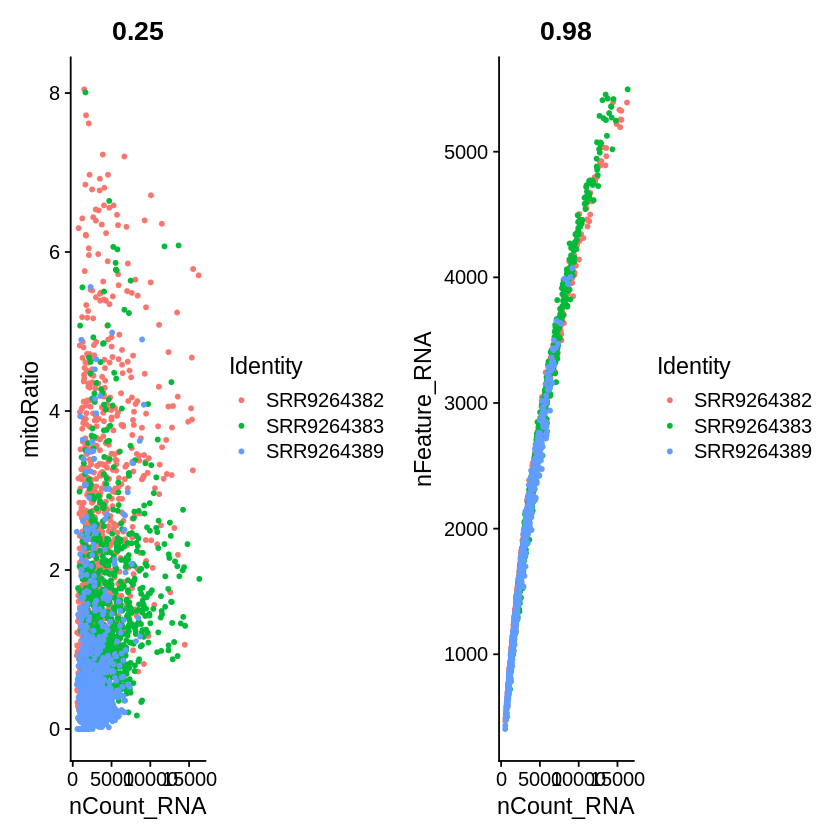

png 
  2

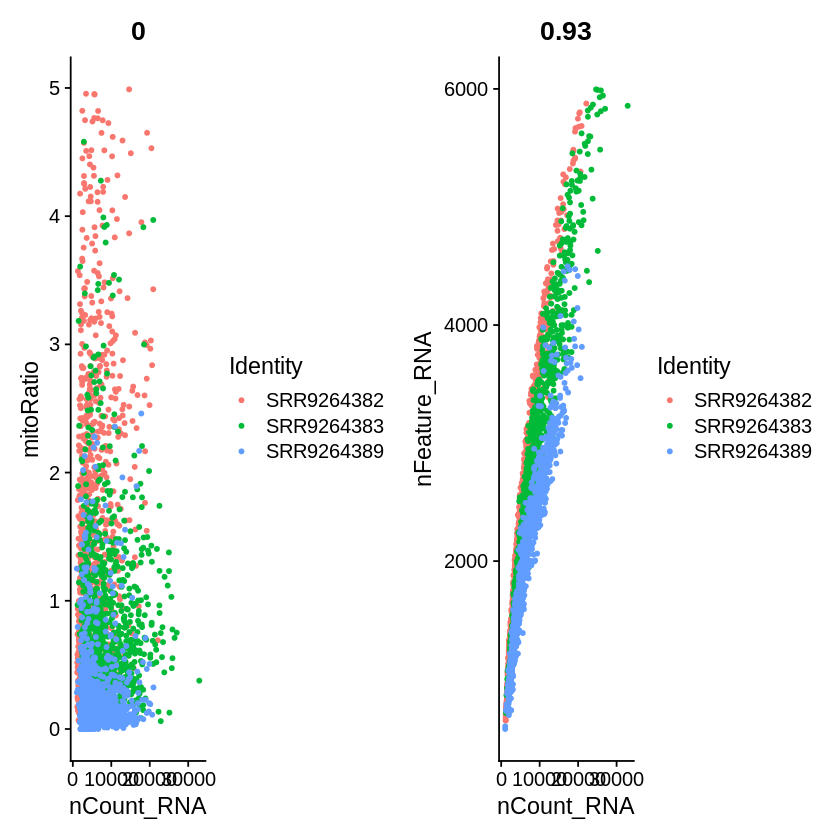

In [131]:
# FeatureScatter is typically used to visualize feature-feature relationships, but can be used
# for anything calculated by the object, i.e. columns in object metadata, PC scores etc.

p <- FeatureScatter(ge_brain.filt, feature1 = "nCount_RNA", feature2 = "mitoRatio", group.by = "sample") 
p2 <- FeatureScatter(ge_brain.filt, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by = "sample")
p + p2
p3 <- FeatureScatter(gte_brain.filt, feature1 = "nCount_RNA", feature2 = "mitoRatio", group.by = "sample") 
p4 <- FeatureScatter(gte_brain.filt, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by = "sample")
p3 + p4

# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brainfilt_FeatureScatter_v2.pdf", 
    width = size*2, height = size*1)
grid.arrange(p,p2, nrow=1, 
             top = "Filtered Healthy Brain samples\nhg38")
grid.arrange(p3,p4, nrow =1,
             top = "Filtered Healthy Brain samples\nhg38+Retrotransposons")
dev.off()

## Normalize, Find Variables v2
2021-07-22

In [138]:
source("~/scratch/gete-gbm/bin/util_seurat.R")

In [132]:
intObjects <- mostVariableFeatures(s_obj = list(ge_brain.filt, gte_brain.filt), meta.group = "sample")

Number of seurat objects:  2 
Splitting seurat objects by sample 


Centering and scaling data matrix



Normalize object:  1 by sample 
Processing sample : 1 
Processing sample : 2 
Processing sample : 3 


Centering and scaling data matrix



Normalize object:  2 by sample 
Processing sample : 1 
Processing sample : 2 
Processing sample : 3 


Number of seurat objects:  2 


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 4839 rows containing missing values (geom_point).”


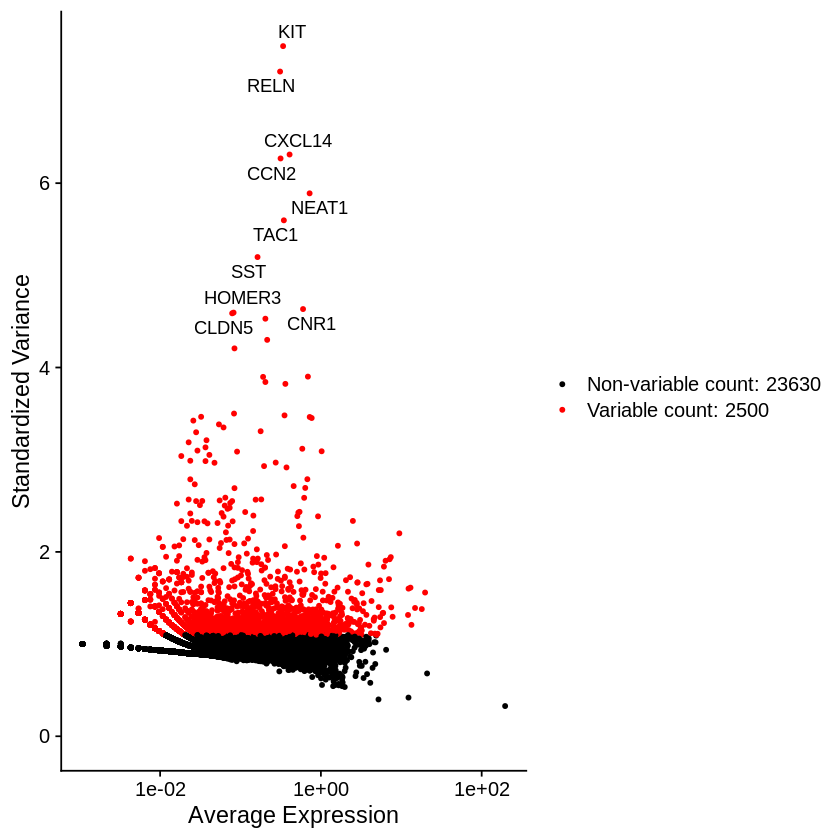

In [133]:
p <- top10VarFeatures(intObjects)
p[[1]][[1]]

In [134]:
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_top10VariableFeaturesbySample_v2.pdf", 
    width = size*3, height = size*1.5)
grid.arrange(p[[1]][[1]], p[[1]][[2]],p[[1]][[3]],
             p[[2]][[1]], p[[2]][[2]],p[[2]][[3]], nrow=2, 
             top = "Healthy Brain samples\nhg38", bottom = "Healthy Brain samples\nhg38+Retrotransposons")
dev.off()

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 4839 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 3082 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 4072 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 4485 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 2706 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 3710 rows containing missing values (geom_point).”


png 
  2

In [139]:
intObjects <- integrateObjects(s_list = intObjects)

Number of seurat objects:  2 
Integrating seurat object:  1 
Number of samples in this seurat object 3 


Computing 2000 integration features

Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2541 anchors

Filtering anchors

	Retained 1998 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2367 anchors

Filtering anchors

	Retained 1647 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2447 anchors

Filtering anchors

	Retained 1802 anchors

Merging dataset 1 into 2

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 3 into 2 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data



Integrating seurat object:  2 
Number of samples in this seurat object 3 


Computing 2000 integration features

Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2564 anchors

Filtering anchors

	Retained 2081 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2377 anchors

Filtering anchors

	Retained 1690 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2413 anchors

Filtering anchors

	Retained 1849 anchors

Merging dataset 1 into 2

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 3 into 2 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data



In [140]:
mkdirToday()
save(intObjects, file="~/scratch/gete-gbm/results/2021-07-22/ge_gte_brain_int.RData")

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-07-22"


Warning message in dir.create(file.path(maindir, subdir)):
“'/home/samkyy/scratch/gete-gbm/results/2021-07-22' already exists”


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-07-22"


In [141]:
# specify that we will perform downstream analysis on the corrected data note that the original
# unmodified data still resides in the 'RNA' assay
DefaultAssay(object = intObjects[[1]]) <- "integrated"
DefaultAssay(object = intObjects[[2]]) <- "integrated"

## PCA
2021-07-22:

In [ ]:
load("~/scratch/gete-gbm/results/2021-07-22/ge_gte_brain_int.RData")

Next, we apply a linear transformation (‘scaling’) that is a standard pre-processing step prior to dimensional reduction techniques like PCA. The ScaleData() function:
- Shifts the expression of each gene, so that the mean expression across cells is 0
- Scales the expression of each gene, so that the variance across cells is 1
- This step gives equal weight in downstream analyses, so that highly-expressed genes do not dominate
- The results of this are stored in pbmc[["RNA"]]@scale.data

In [142]:
# Run the standard workflow for visualization and clustering (ScaleData, RunPCA, RunUMAP, FindNeighbors, FindClusters)
intObjects[[1]] <- ScaleData(object = intObjects[[1]], verbose = FALSE)
intObjects[[2]] <- ScaleData(object = intObjects[[2]], verbose = FALSE)

In [143]:
# Run PCA and UMAP ~10min 
intObjects[[1]] <- RunPCA(object = intObjects[[1]], npcs = 20, verbose = FALSE)

# Run PCA and UMAP ~10min
intObjects[[2]] <- RunPCA(object = intObjects[[2]], npcs = 20, verbose = FALSE)

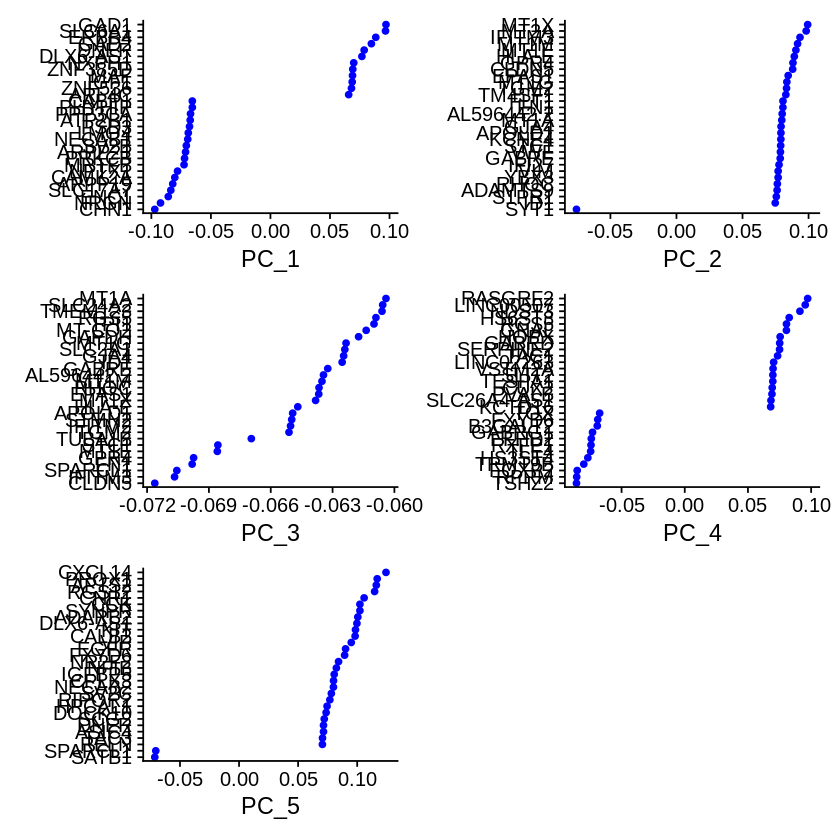

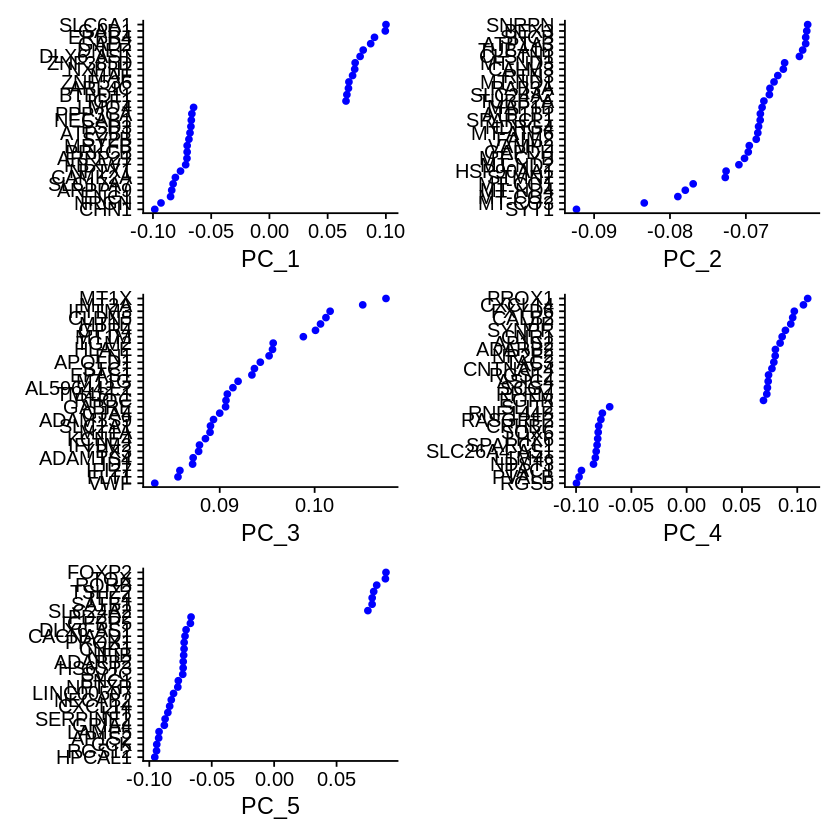

In [145]:
VizDimLoadings(intObjects[[1]], dims = 1:5, reduction = "pca")
VizDimLoadings(intObjects[[2]], dims = 1:5, reduction = "pca")

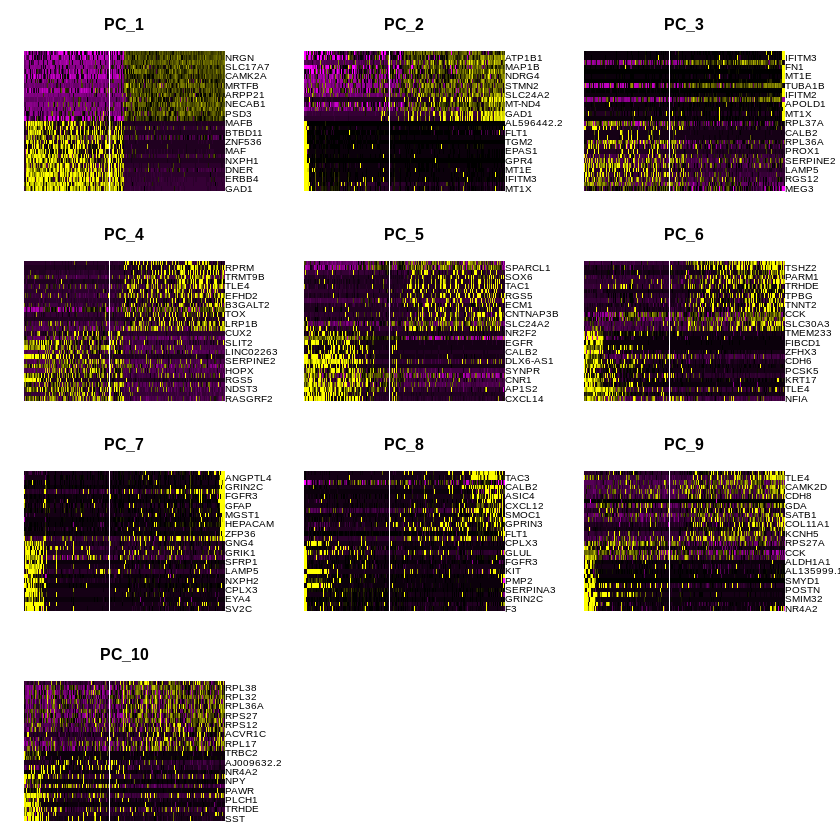

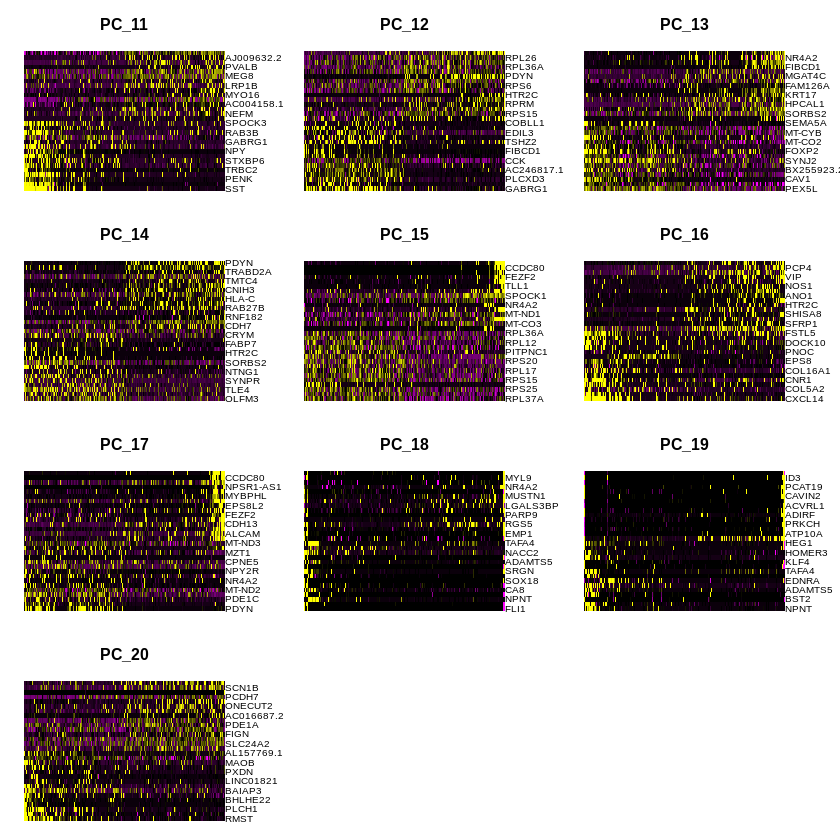

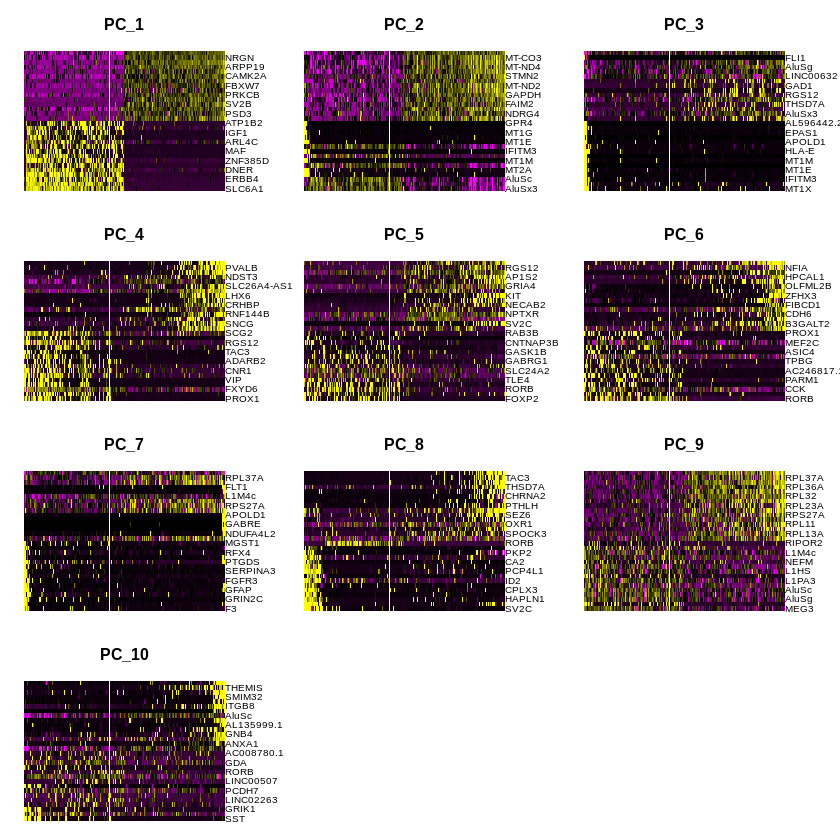

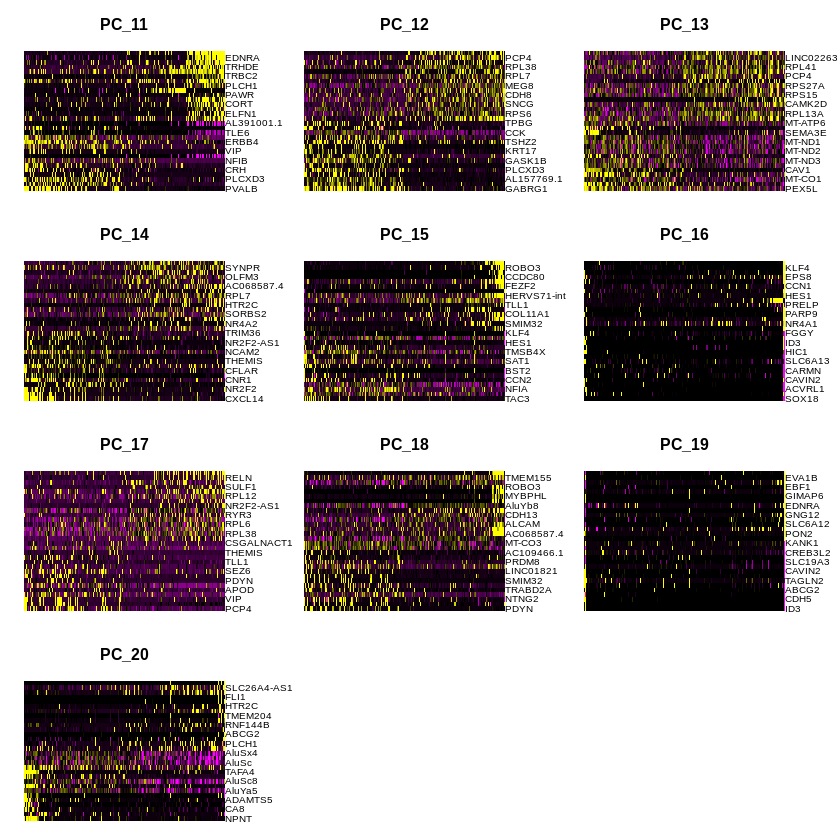

In [146]:
DimHeatmap(intObjects[[1]], dims = 1:10, cells = 1000, balanced = TRUE)
DimHeatmap(intObjects[[1]], dims = 11:20, cells = 500, balanced = TRUE)
DimHeatmap(intObjects[[2]], dims = 1:10, cells = 1000, balanced = TRUE)
DimHeatmap(intObjects[[2]], dims = 11:20, cells = 500, balanced = TRUE)

After 16 the PC components don't help differentiate the features anymore

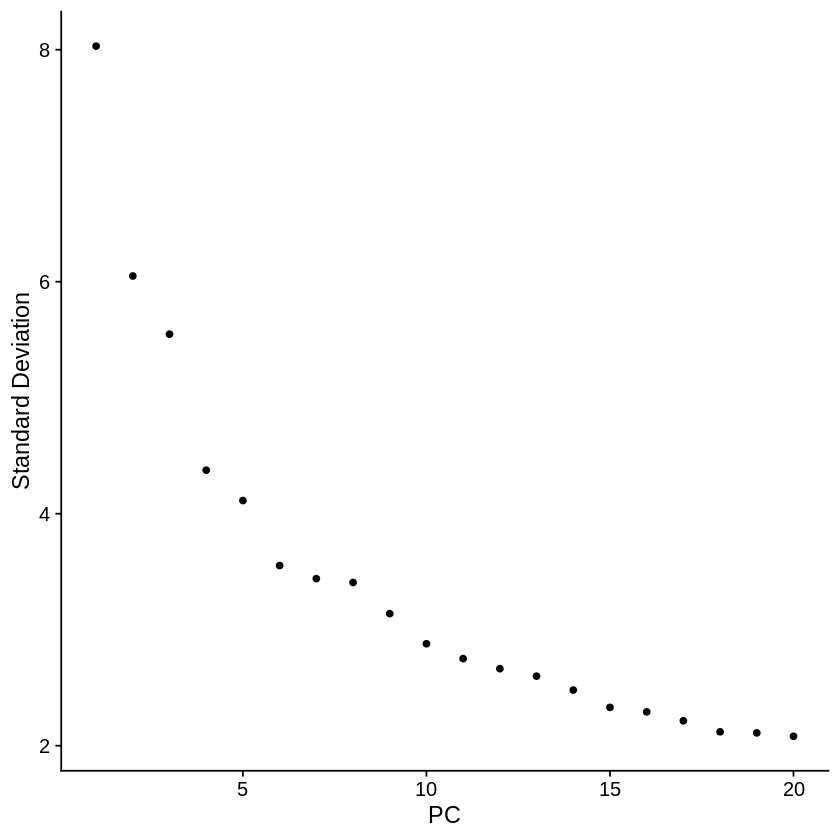

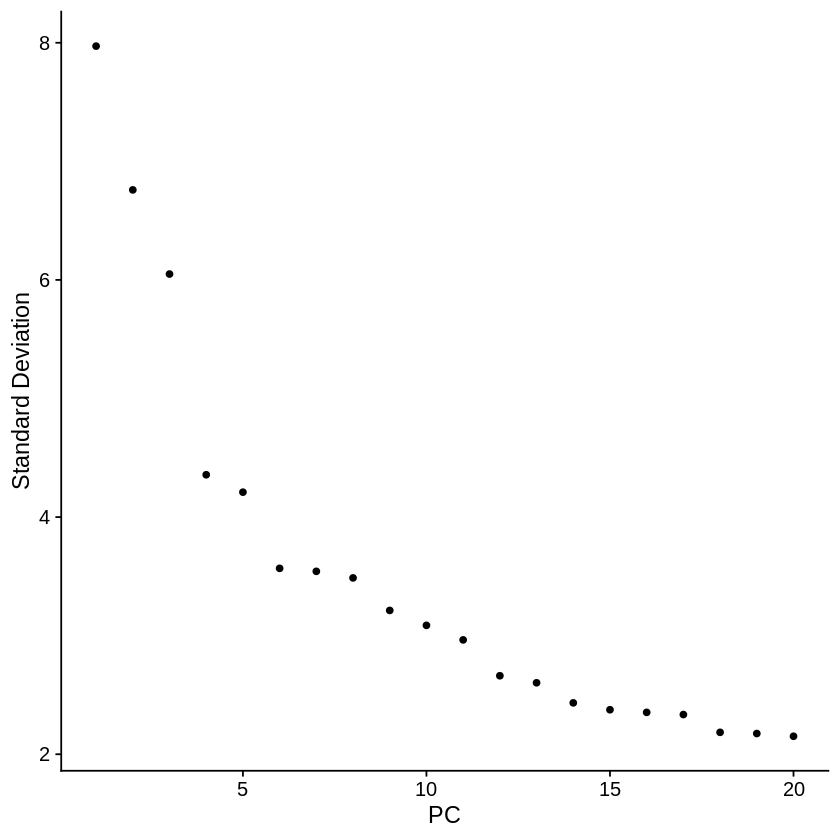

In [147]:
# Which PCAs should we include in our analyses? 
ElbowPlot(object = intObjects[[1]], ndims = 20)
ElbowPlot(object = intObjects[[2]], ndims = 20)

The first elbow would start at PC6 while the second elbow would start at PC 15

Warning message:
“Removed 25256 rows containing missing values (geom_point).”
Warning message:
“Removed 25260 rows containing missing values (geom_point).”


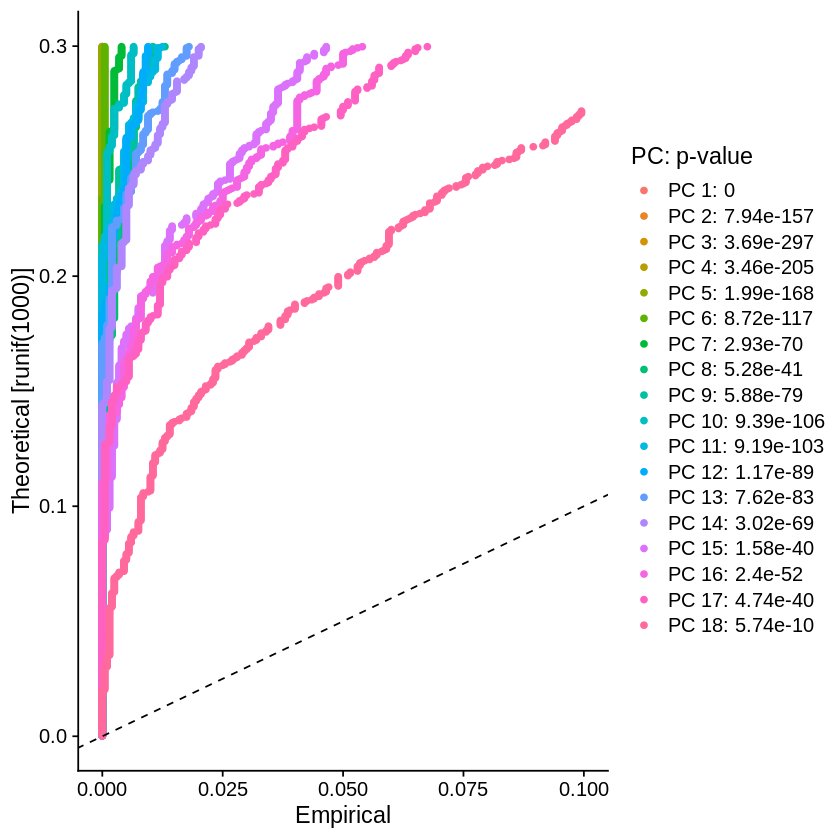

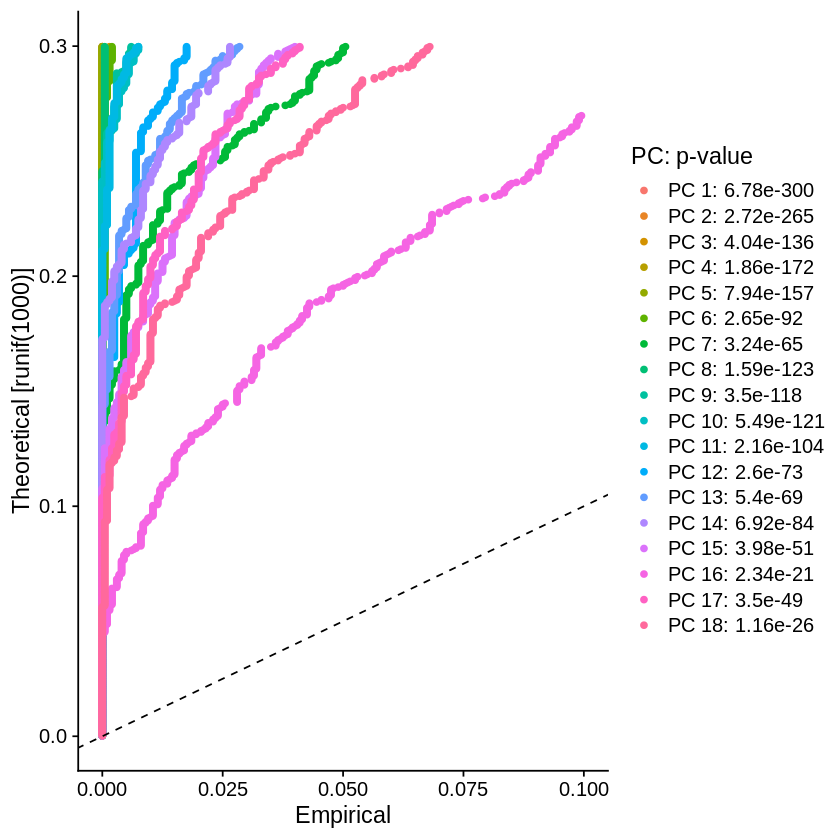

In [156]:
# NOTE: This process can take a long time for big datasets, comment out for expediency. More
# approximate techniques such as those implemented in ElbowPlot() can be used to reduce
# computation time
jackPlots <- vector(mode="list", length=2)
jackPlots[[1]] <- JackStraw(intObjects[[1]], num.replicate = 100, dims = 20)
jackPlots[[1]] <- ScoreJackStraw(jackPlots[[1]], dims = 1:20)
JackStrawPlot(jackPlots[[1]], dims = 1:18)
# NOTE: This process can take a long time for big datasets, comment out for expediency. More
# approximate techniques such as those implemented in ElbowPlot() can be used to reduce
# computation time
jackPlots[[2]] <- JackStraw(intObjects[[2]], num.replicate = 100, dims = 20)
jackPlots[[2]] <- ScoreJackStraw(jackPlots[[2]], dims = 1:20)
JackStrawPlot(jackPlots[[2]], dims = 1:18)

Warning message:
“Removed 16000 rows containing missing values (geom_point).”
Warning message:
“Removed 16000 rows containing missing values (geom_point).”


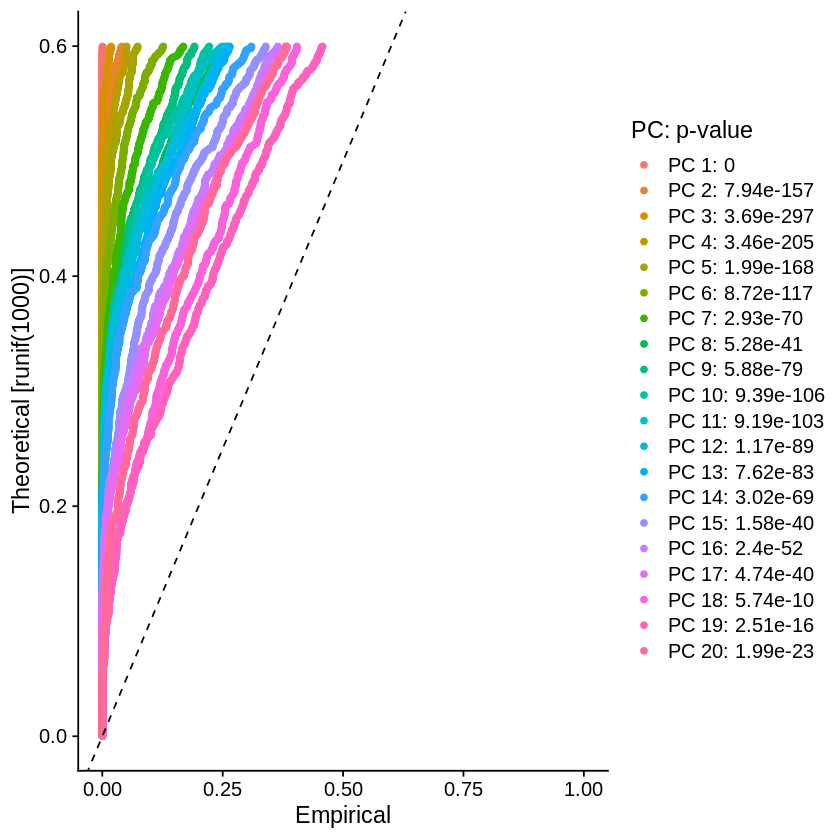

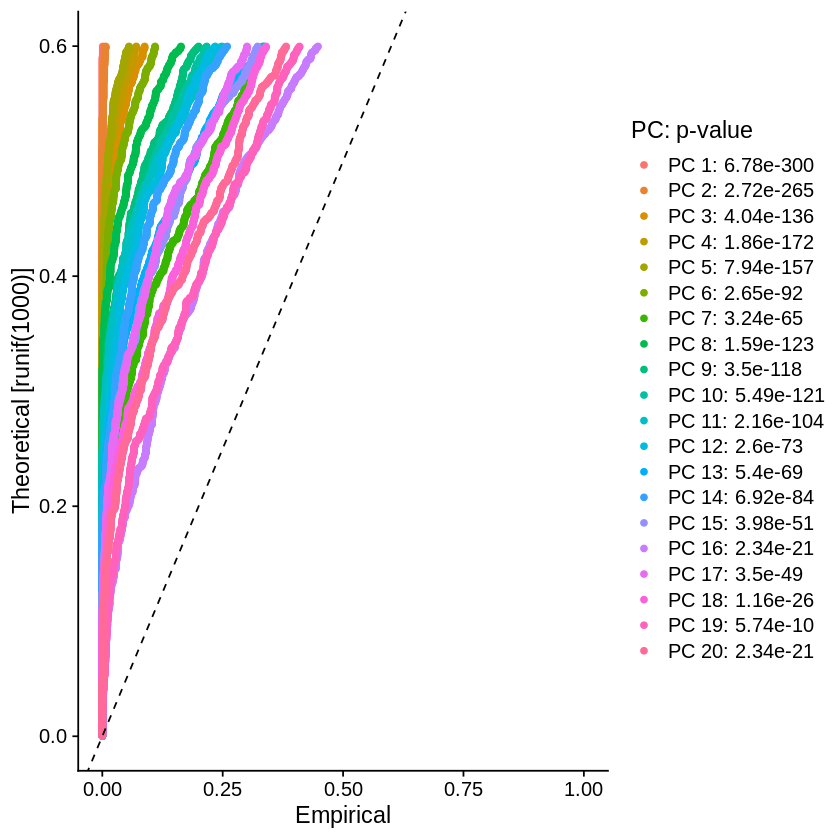

In [157]:
JackStrawPlot(jackPlots[[1]], dims = 1:20, xmax = 1.0,ymax = 0.6)
JackStrawPlot(jackPlots[[2]], dims = 1:20, xmax = 1.0,ymax = 0.6)

The Jackstraw plot shows that in the data set mapped to reference genes only, there is less separation after PC15 and especially PC18. In the dataset mapped to both reference and retrotransposons, there is less separattion after PC16.

These approaches together show that choosing a PC between 15 or 16 would be safe. 

2021-08-05: Reproducing Elbow plots to save as PDF & percent variation calculations

In [8]:
load("~/scratch/gete-gbm/results/2021-07-22/ge_brain.umaps.RData")
load("~/scratch/gete-gbm/results/2021-07-22/gte_brain.umaps.RData")

In [10]:
# Which PCAs should we include in our analyses? 
p <- ElbowPlot(object = ge_umaps[[1]], ndims = 20) + ggtitle("hg38")
p2 <- ElbowPlot(object = gte_umaps[[1]], ndims = 20) + ggtitle("hg38 + Retrotransposons")

# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-05/r_brain_ElbowPlots-v1.pdf", 
    width = size*3, height = size*1.5)
grid.arrange(p, p2, nrow=1, top = "Healthy Brain samples")
dev.off()

png 
  2

In [11]:
# Determine percent of variation associated with each PC
pct <- ge_umaps[[1]][["pca"]]@stdev / sum(ge_umaps[[1]][["pca"]]@stdev) * 100

# Calculate cumulative percents for each PC
cumu <- cumsum(pct)

# Determine which PC exhibits cumulative percent greater than 90% and % variation associated with the PC as less than 5
co1 <- which(cumu > 90 & pct < 5)[1]

co1

# Determine the difference between variation of PC and subsequent PC
co2 <- sort(which((pct[1:length(pct) - 1] - pct[2:length(pct)]) > 0.1), decreasing = T)[1] + 1

# last point where change of % of variation is more than 0.1%.
co2

# Minimum of the two calculation
pcs <- min(co1, co2)

pcs

[1] 17

[1] 18

[1] 17

In [12]:
# Determine percent of variation associated with each PC
pct <- gte_umaps[[1]][["pca"]]@stdev / sum(gte_umaps[[1]][["pca"]]@stdev) * 100

# Calculate cumulative percents for each PC
cumu <- cumsum(pct)

# Determine which PC exhibits cumulative percent greater than 90% and % variation associated with the PC as less than 5
co1 <- which(cumu > 90 & pct < 5)[1]

co1

# Determine the difference between variation of PC and subsequent PC
co2 <- sort(which((pct[1:length(pct) - 1] - pct[2:length(pct)]) > 0.1), decreasing = T)[1] + 1

# last point where change of % of variation is more than 0.1%.
co2

# Minimum of the two calculation
pcs <- min(co1, co2)

pcs

[1] 17

[1] 18

[1] 17

## UMAP
2021-07-22:

In [158]:
pc <- c(5, 10, 15, 16)

In [161]:
## Perform UMAP analysis
ge_umaps <- vector(mode="list", length=length(pc))
gte_umaps <- vector(mode="list", length=length(pc))

names(ge_umaps) <- as.character(pc)
names(gte_umaps) <- as.character(pc)

for (i in 1:length(pc)){
    ge_umaps[[i]] <- RunUMAP(object = intObjects[[1]], 
                                 reduction = "pca", dims = 1:pc[i], umap.method = "uwot", metric = "cosine")
    gte_umaps[[i]] <- RunUMAP(object = intObjects[[2]], 
                                 reduction = "pca", dims = 1:pc[i], umap.method = "uwot", metric = "cosine")
}

# save(ge_umaps,file="~/scratch/gete-gbm/results/2021-07-22/ge_brain.umaps.RData")
# save(gte_umaps,file="~/scratch/gete-gbm/results/2021-07-22/gte_brain.umaps.RData")

13:43:17 UMAP embedding parameters a = 0.9922 b = 1.112

13:43:17 Read 2861 rows and found 5 numeric columns

13:43:17 Using Annoy for neighbor search, n_neighbors = 30

13:43:17 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

13:43:18 Writing NN index file to temp file /tmp/RtmpZBjGH3/file218564dc14e6

13:43:18 Searching Annoy index using 1 thread, search_k = 3000

13:43:19 Annoy recall = 100%

13:43:20 Commencing smooth kNN distance calibration using 1 thread

13:43:22 Initializing from normalized Laplacian + noise

13:43:22 Commencing optimization for 500 epochs, with 106490 positive edges

13:43:27 Optimization finished

13:43:27 UMAP embedding parameters a = 0.9922 b = 1.112

13:43:27 Read 2861 rows and found 5 numeric columns

13:43:27 Using Annoy for neighbor se

In [163]:
## Find Neighbors
for (i in 1:length(pc)) {
    # Determine the K-nearest neighbor graph
    ge_umaps[[i]] <- FindNeighbors(ge_umaps[[i]],dims=1:pc[[i]],reduction="pca")
    gte_umaps[[i]] <- FindNeighbors(gte_umaps[[i]],dims=1:pc[[i]],reduction="pca")
}

# save(ge_umaps,file="~/scratch/gete-gbm/results/2021-07-22/ge_brain.umaps.RData")
# save(gte_umaps,file="~/scratch/gete-gbm/results/2021-07-22/gte_brain.umaps.RData")

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN



In [164]:
res <- c(0.2, 0.4, 0.6, 0.8, 1.0, 1.2)

# Find Clusters with a vector of resolutions
for (i in 1:length(ge_umaps)) { ## Compute clusters for each separate umap 
    for (j in 1:length(res)) { ## Compute for each resolution
        ge_umaps[[i]] <- FindClusters(ge_umaps[[i]], resolution = res[j])
        gte_umaps[[i]] <- FindClusters(gte_umaps[[i]], resolution = res[j])
    }
}

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2861
Number of edges: 85409

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9359
Number of communities: 6
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2861
Number of edges: 84169

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9328
Number of communities: 6
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2861
Number of edges: 85409

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9016
Number of communities: 9
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2861
Number of edges: 84169

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9023
Number of communities: 9
Elapsed time: 0 seconds
Modularity Optimizer ver

In [166]:
# You can view different resolutions using:
# Idents(object = filt_gte_brain.intergrated) <- "integrated_snn_res.0.8"
save(ge_umaps,file="~/scratch/gete-gbm/results/2021-07-22/ge_brain.umaps.RData")
save(gte_umaps,file="~/scratch/gete-gbm/results/2021-07-22/gte_brain.umaps.RData")

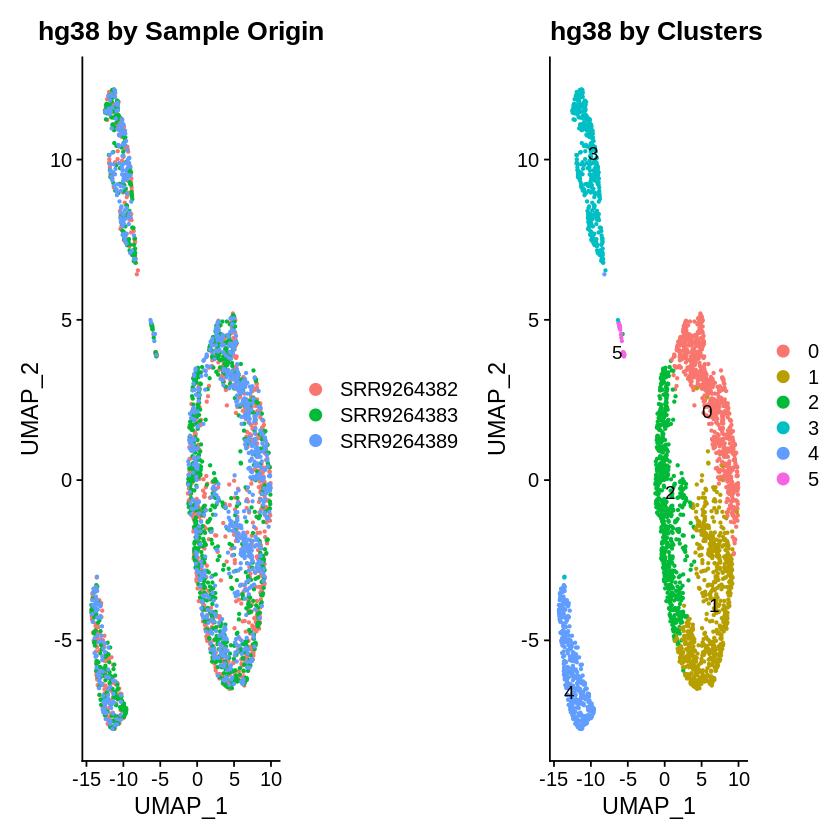

png 
  2

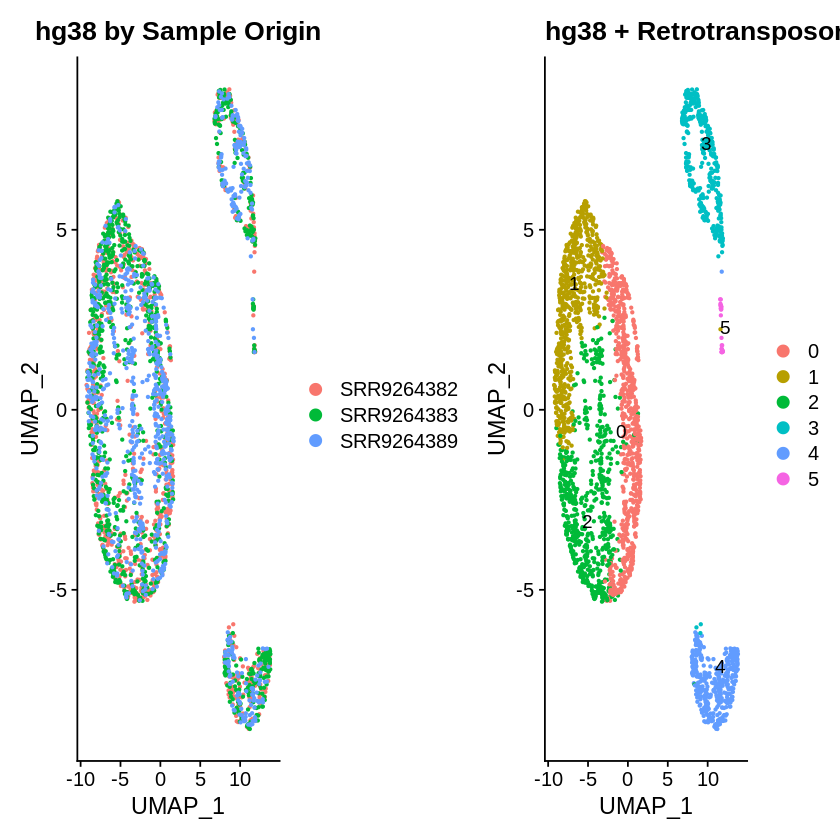

In [181]:
Idents(object = ge_umaps[[1]]) <- "integrated_snn_res.0.2"
Idents(object = gte_umaps[[1]]) <- "integrated_snn_res.0.2"

p1 <- DimPlot(ge_umaps[[1]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p2 <- DimPlot(ge_umaps[[1]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

p3 <- DimPlot(gte_umaps[[1]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p4 <- DimPlot(gte_umaps[[1]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")

p1+p2
p3+p4
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_umap_PC5_r02.pdf", width = size*2, height = size*2)
grid.arrange(p1, p2, p3, p4, nrow=2, 
             top = "UMAP PC5 resolution 0.2")
dev.off()

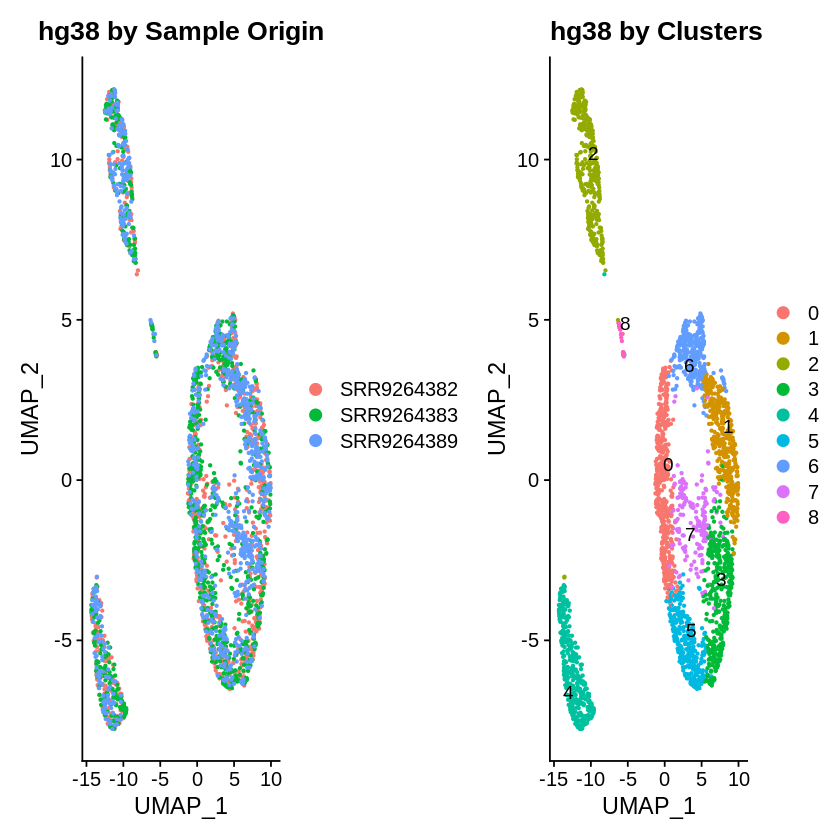

png 
  2

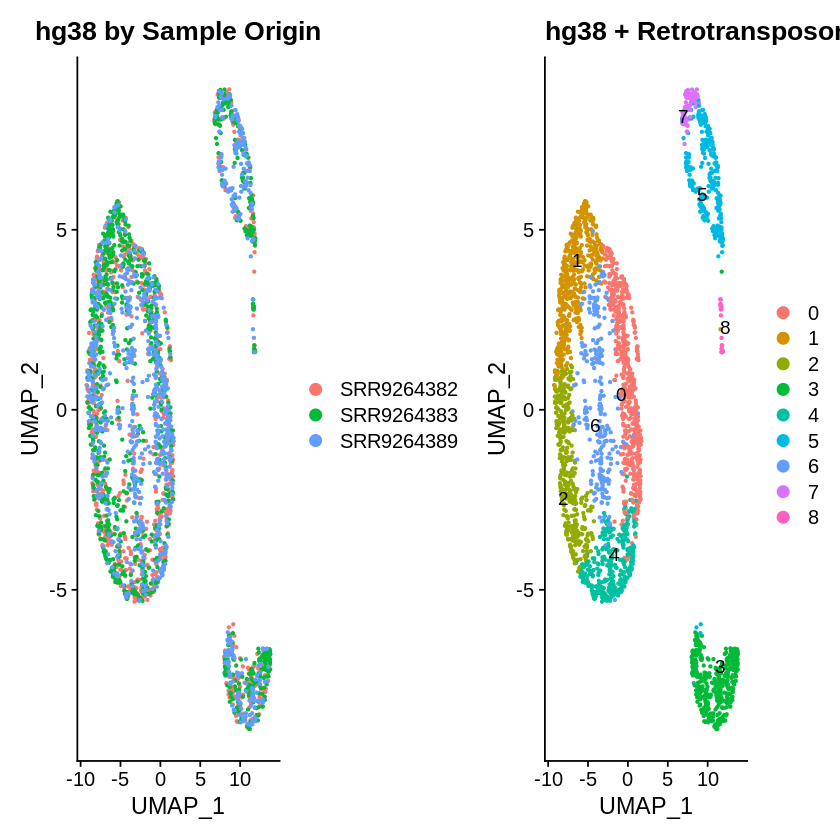

In [182]:
Idents(object = ge_umaps[[1]]) <- "integrated_snn_res.0.4"
Idents(object = gte_umaps[[1]]) <- "integrated_snn_res.0.4"

p1 <- DimPlot(ge_umaps[[1]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p2 <- DimPlot(ge_umaps[[1]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

p3 <- DimPlot(gte_umaps[[1]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p4 <- DimPlot(gte_umaps[[1]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")

p1+p2
p3+p4
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_umap_PC5_r04.pdf", width = size*2, height = size*2)
grid.arrange(p1, p2, p3, p4, nrow=2, 
             top = "UMAP PC5 resolution 0.4")
dev.off()

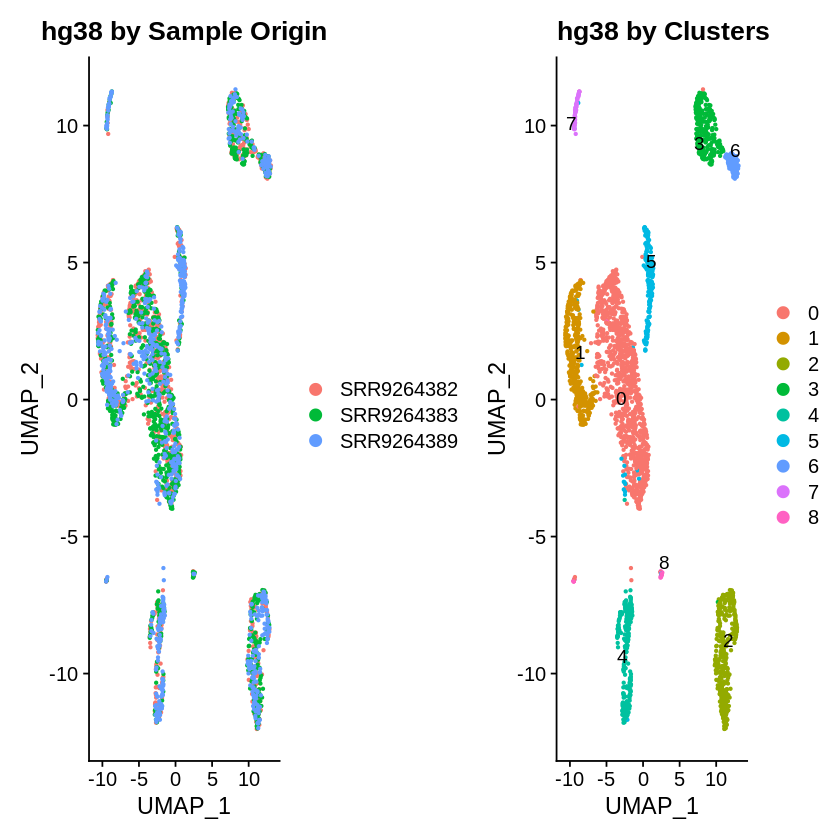

png 
  2

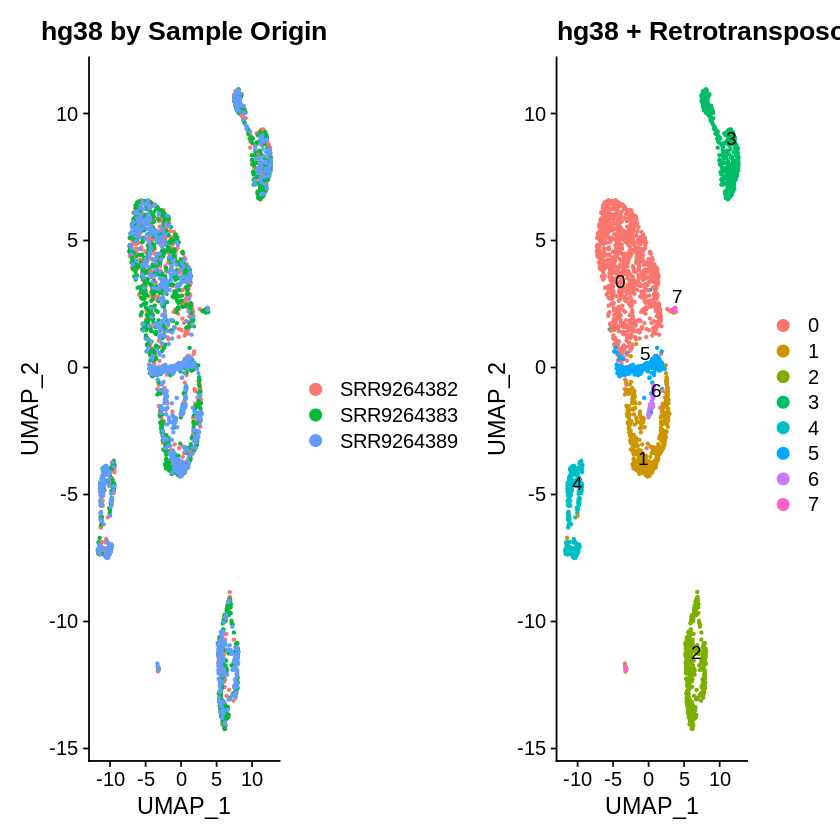

In [184]:
Idents(object = ge_umaps[[2]]) <- "integrated_snn_res.0.2"
Idents(object = gte_umaps[[2]]) <- "integrated_snn_res.0.2"

p1 <- DimPlot(ge_umaps[[2]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p2 <- DimPlot(ge_umaps[[2]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

p3 <- DimPlot(gte_umaps[[2]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p4 <- DimPlot(gte_umaps[[2]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")

p1+p2
p3+p4
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_umap_PC10_r02.pdf", width = size*2, height = size*2)
grid.arrange(p1, p2, p3, p4, nrow=2, 
             top = "UMAP PC10 resolution 0.2")
dev.off()

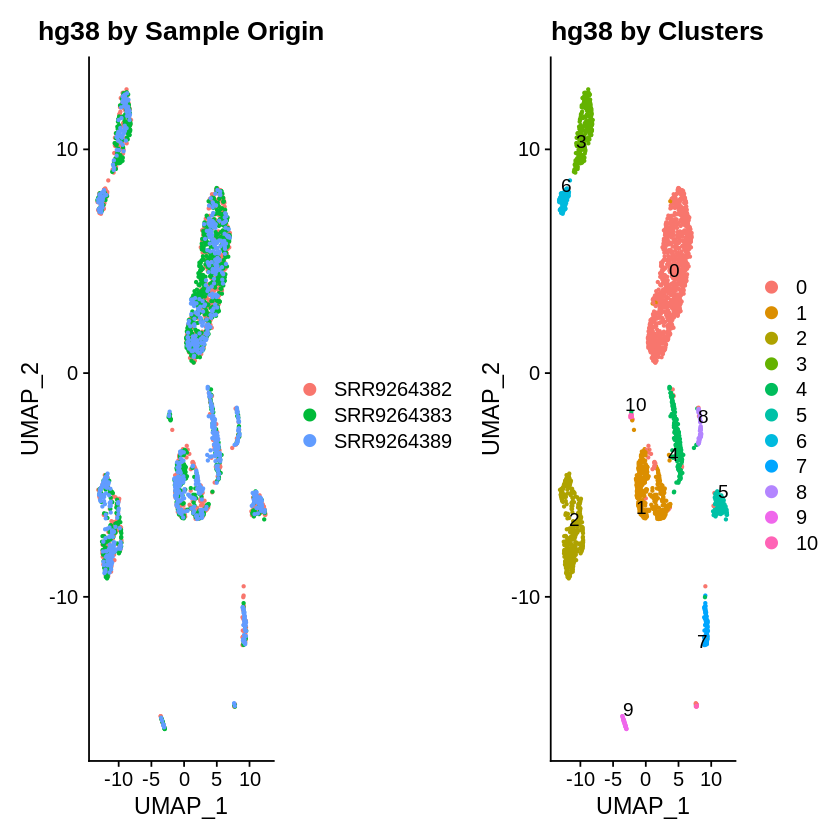

png 
  2

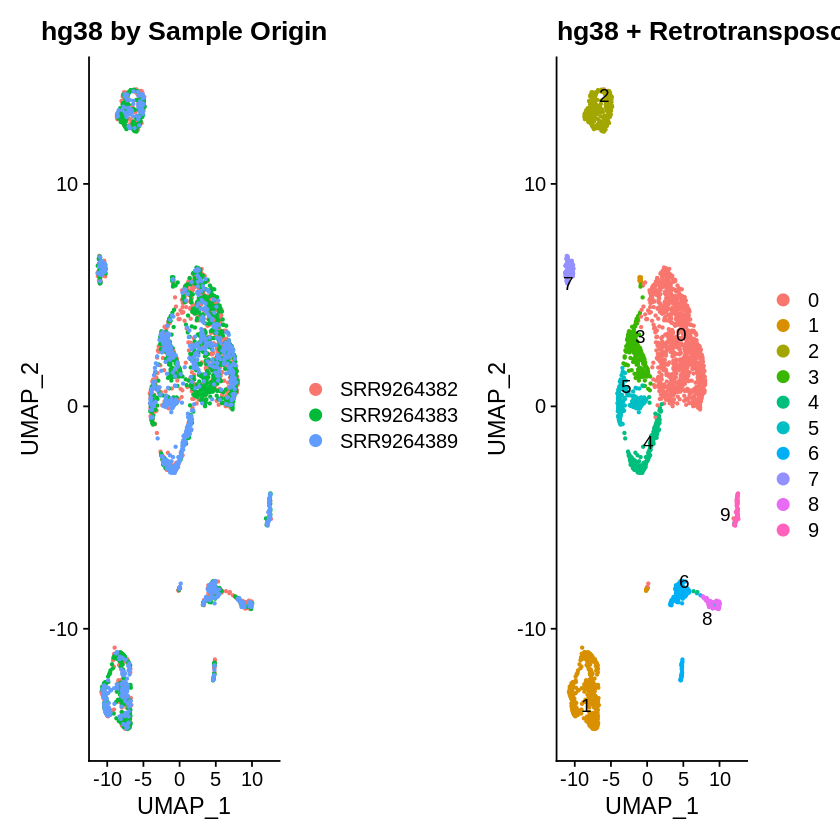

In [185]:
Idents(object = ge_umaps[[3]]) <- "integrated_snn_res.0.2"
Idents(object = gte_umaps[[3]]) <- "integrated_snn_res.0.2"

p1 <- DimPlot(ge_umaps[[3]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p2 <- DimPlot(ge_umaps[[3]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

p3 <- DimPlot(gte_umaps[[3]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p4 <- DimPlot(gte_umaps[[3]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")

p1+p2
p3+p4
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_umap_PC15_r02.pdf", width = size*2, height = size*2)
grid.arrange(p1, p2, p3, p4, nrow=2, 
             top = "UMAP PC15 resolution 0.2")
dev.off()

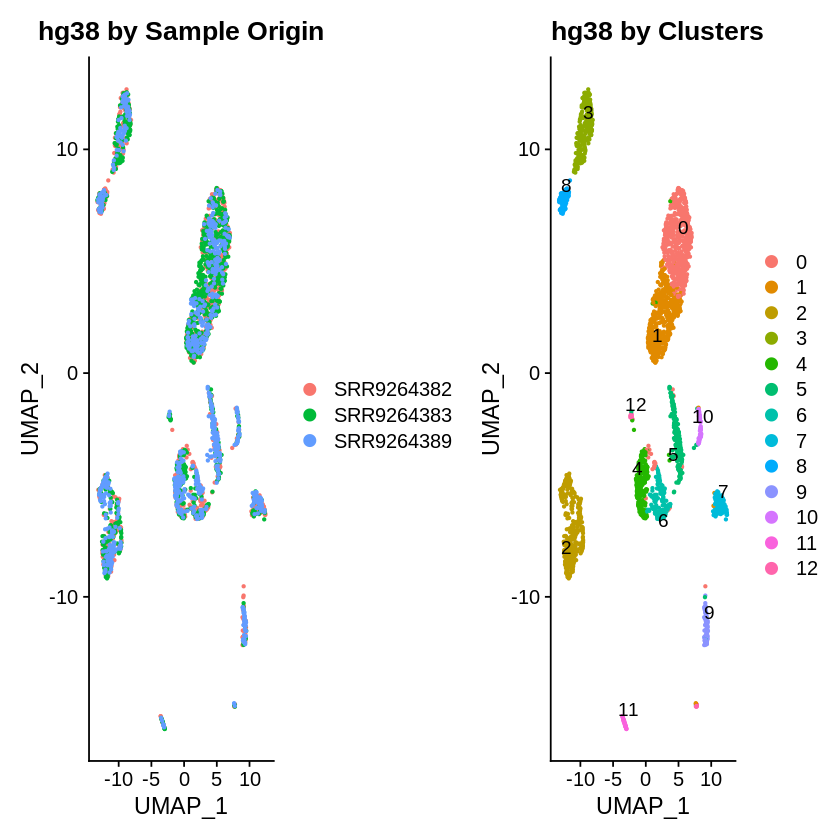

png 
  2

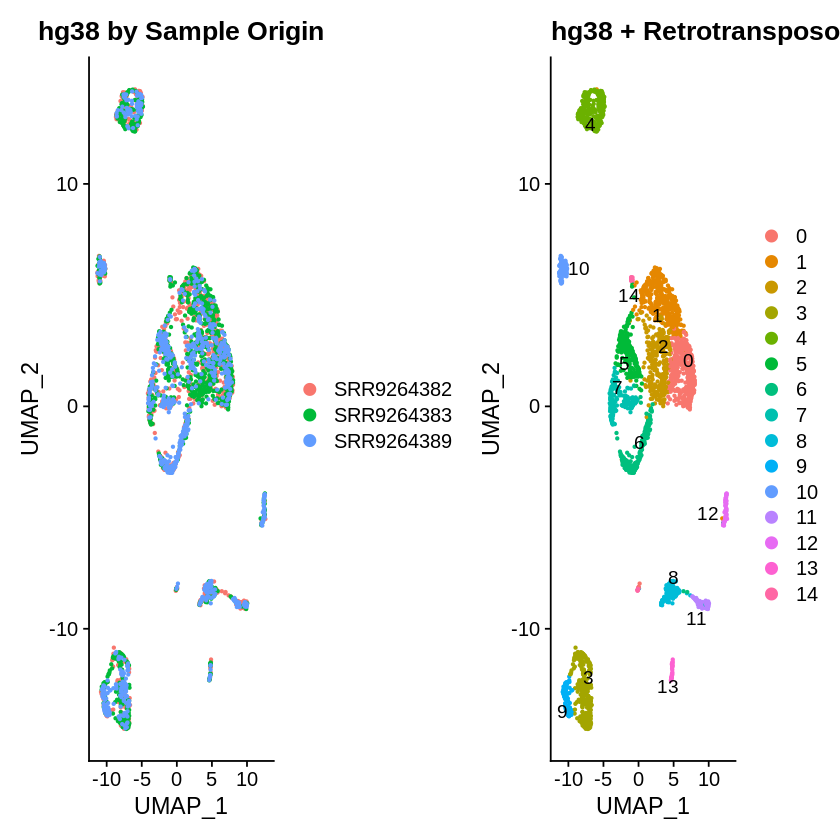

In [186]:
Idents(object = ge_umaps[[3]]) <- "integrated_snn_res.0.4"
Idents(object = gte_umaps[[3]]) <- "integrated_snn_res.0.4"

p1 <- DimPlot(ge_umaps[[3]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p2 <- DimPlot(ge_umaps[[3]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

p3 <- DimPlot(gte_umaps[[3]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p4 <- DimPlot(gte_umaps[[3]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")

p1+p2
p3+p4
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_umap_PC15_r04.pdf", width = size*2, height = size*2)
grid.arrange(p1, p2, p3, p4, nrow=2, 
             top = "UMAP PC15 resolution 0.2")
dev.off()

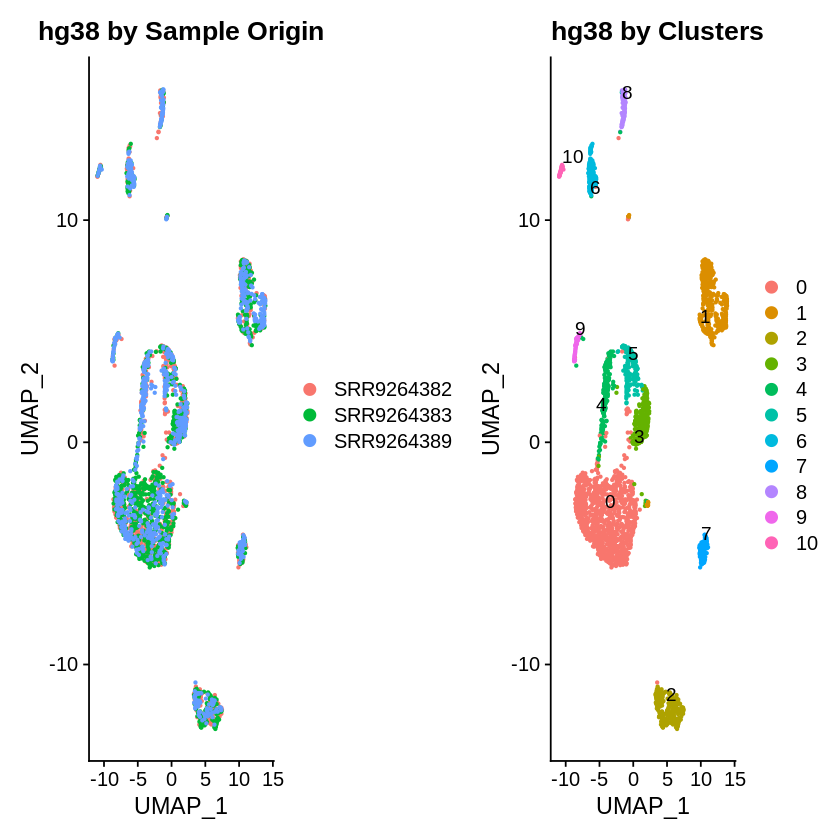

png 
  2

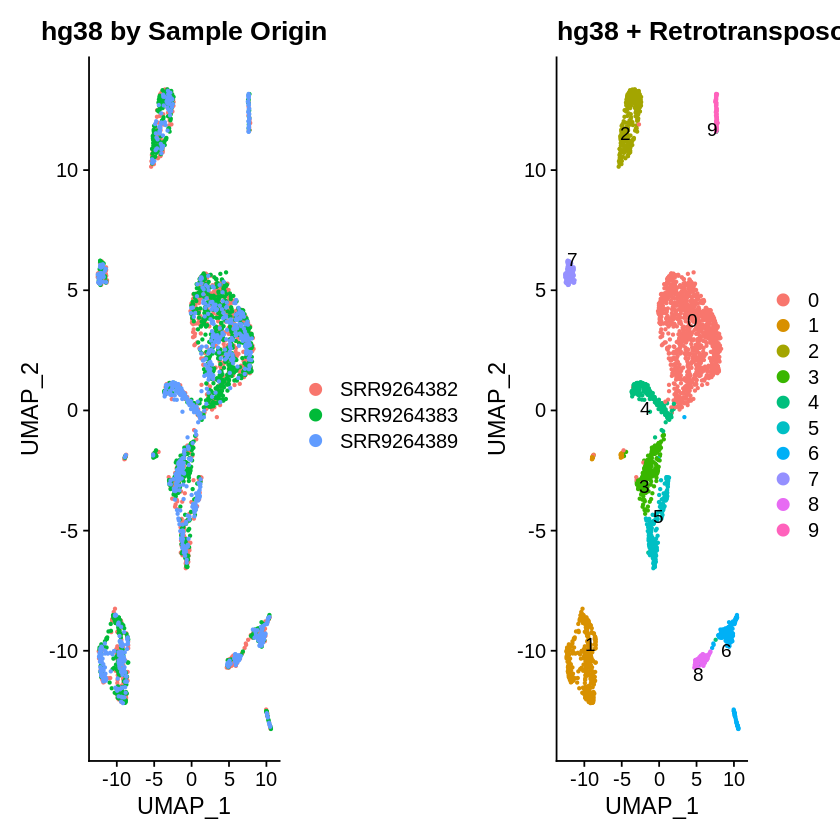

In [187]:
Idents(object = ge_umaps[[4]]) <- "integrated_snn_res.0.2"
Idents(object = gte_umaps[[4]]) <- "integrated_snn_res.0.2"

p1 <- DimPlot(ge_umaps[[4]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p2 <- DimPlot(ge_umaps[[4]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

p3 <- DimPlot(gte_umaps[[4]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p4 <- DimPlot(gte_umaps[[4]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")

p1+p2
p3+p4
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_umap_PC16_r02.pdf", width = size*2, height = size*2)
grid.arrange(p1, p2, p3, p4, nrow=2, 
             top = "UMAP PC16 resolution 0.2")
dev.off()

PC10 is very close, but there are some mislabeled cells mixed into other clusters which isn't ideal. I'll redo the UMAPs a set of PCs between 8 and 9 to see if it's better.

In [188]:
pc <- c(8,9)

In [189]:
## Perform UMAP analysis
ge_umaps <- vector(mode="list", length=length(pc))
gte_umaps <- vector(mode="list", length=length(pc))

names(ge_umaps) <- as.character(pc)
names(gte_umaps) <- as.character(pc)

for (i in 1:length(pc)){
    ge_umaps[[i]] <- RunUMAP(object = intObjects[[1]], 
                                 reduction = "pca", dims = 1:pc[i], umap.method = "uwot", metric = "cosine")
    gte_umaps[[i]] <- RunUMAP(object = intObjects[[2]], 
                                 reduction = "pca", dims = 1:pc[i], umap.method = "uwot", metric = "cosine")
}

save(ge_umaps,file="~/scratch/gete-gbm/results/2021-07-22/ge_brain.umaps_8-9.RData")
save(gte_umaps,file="~/scratch/gete-gbm/results/2021-07-22/gte_brain.umaps_8-9.RData")

14:25:59 UMAP embedding parameters a = 0.9922 b = 1.112

14:25:59 Read 2861 rows and found 8 numeric columns

14:25:59 Using Annoy for neighbor search, n_neighbors = 30

14:25:59 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:26:00 Writing NN index file to temp file /tmp/RtmpZBjGH3/file2185719333d8

14:26:00 Searching Annoy index using 1 thread, search_k = 3000

14:26:01 Annoy recall = 100%

14:26:02 Commencing smooth kNN distance calibration using 1 thread

14:26:03 Initializing from normalized Laplacian + noise

14:26:04 Commencing optimization for 500 epochs, with 111020 positive edges

14:26:09 Optimization finished

14:26:09 UMAP embedding parameters a = 0.9922 b = 1.112

14:26:09 Read 2861 rows and found 8 numeric columns

14:26:09 Using Annoy for neighbor se

In [190]:
## Find Neighbors
for (i in 1:length(pc)) {
    # Determine the K-nearest neighbor graph
    ge_umaps[[i]] <- FindNeighbors(ge_umaps[[i]],dims=1:pc[[i]],reduction="pca")
    gte_umaps[[i]] <- FindNeighbors(gte_umaps[[i]],dims=1:pc[[i]],reduction="pca")
}

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN



In [191]:
res <- c(0.2, 0.4, 0.6, 0.8)

# Find Clusters with a vector of resolutions
for (i in 1:length(ge_umaps)) { ## Compute clusters for each separate umap 
    for (j in 1:length(res)) { ## Compute for each resolution
        ge_umaps[[i]] <- FindClusters(ge_umaps[[i]], resolution = res[j])
        gte_umaps[[i]] <- FindClusters(gte_umaps[[i]], resolution = res[j])
    }
}

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2861
Number of edges: 90418

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9469
Number of communities: 8
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2861
Number of edges: 87948

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9400
Number of communities: 7
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2861
Number of edges: 90418

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9181
Number of communities: 9
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2861
Number of edges: 87948

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9111
Number of communities: 10
Elapsed time: 0 seconds
Modularity Optimizer ve

In [192]:
# You can view different resolutions using:
# Idents(object = filt_gte_brain.intergrated) <- "integrated_snn_res.0.8"
save(ge_umaps,file="~/scratch/gete-gbm/results/2021-07-22/ge_brain.umaps_8-9.RData")
save(gte_umaps,file="~/scratch/gete-gbm/results/2021-07-22/gte_brain.umaps_8-9.RData")

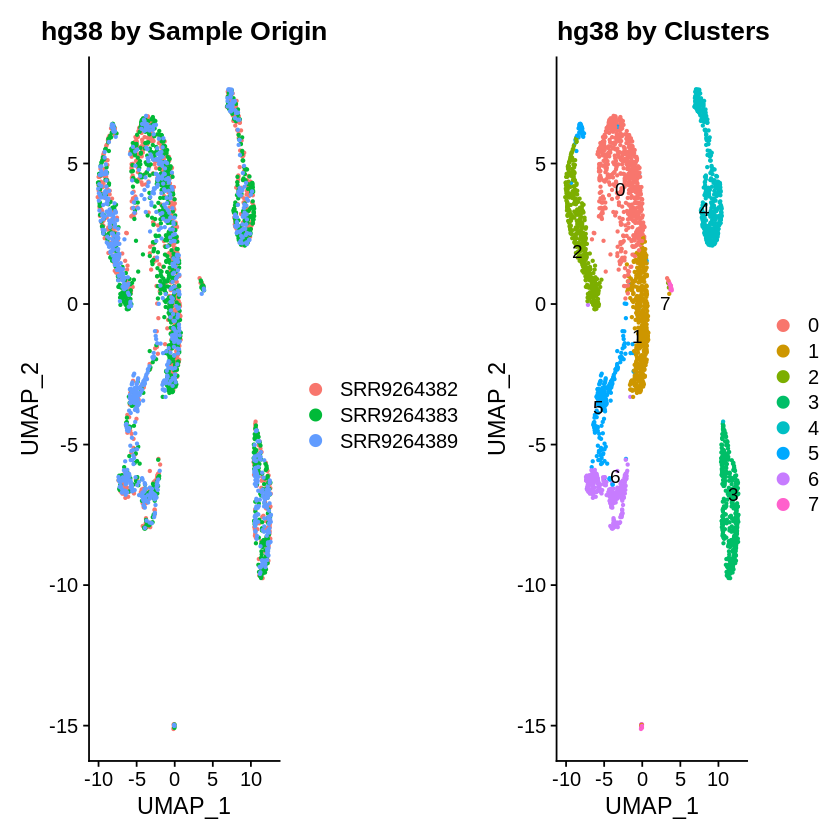

png 
  2

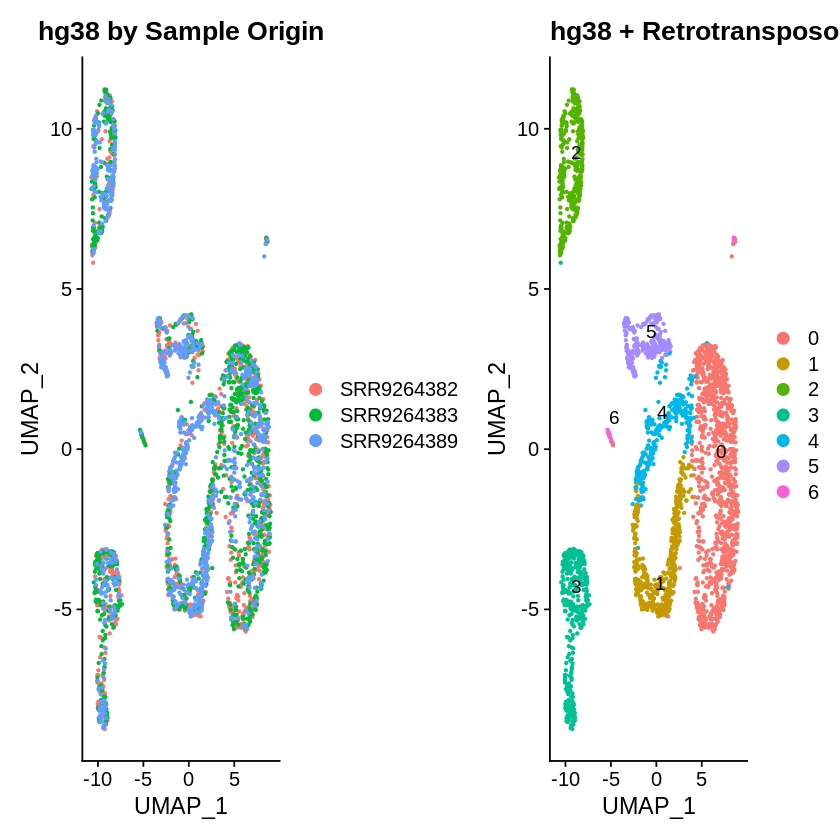

In [194]:
Idents(object = ge_umaps[[1]]) <- "integrated_snn_res.0.2"
Idents(object = gte_umaps[[1]]) <- "integrated_snn_res.0.2"

p1 <- DimPlot(ge_umaps[[1]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p2 <- DimPlot(ge_umaps[[1]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

p3 <- DimPlot(gte_umaps[[1]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p4 <- DimPlot(gte_umaps[[1]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")

p1+p2
p3+p4
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_umap_PC8_r02.pdf", width = size*2, height = size*2)
grid.arrange(p1, p2, p3, p4, nrow=2, 
             top = "UMAP PC8 resolution 0.2")
dev.off()

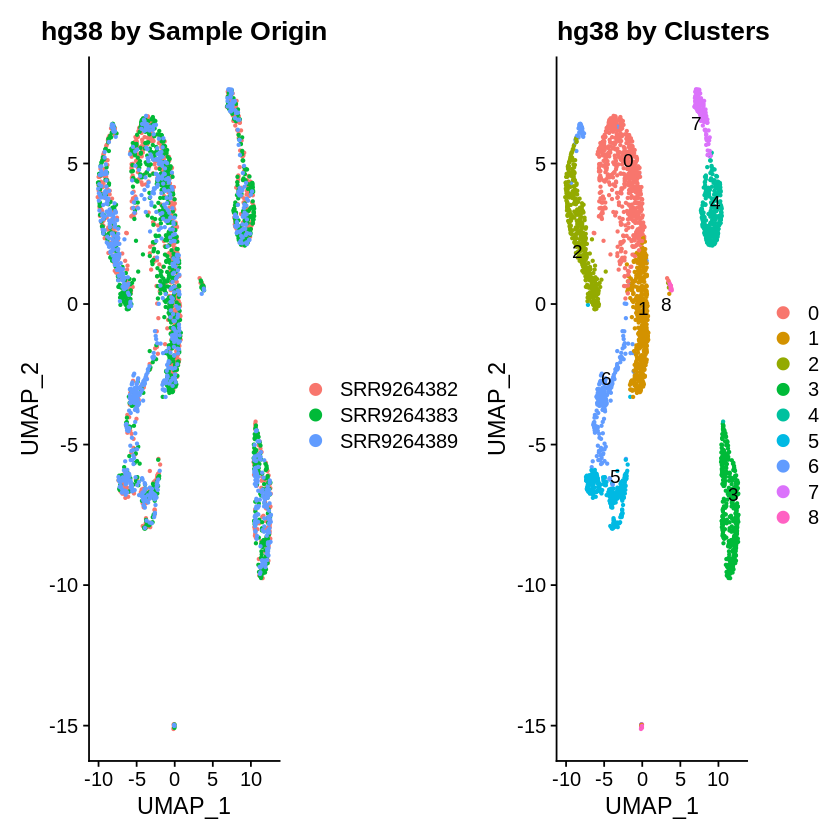

png 
  2

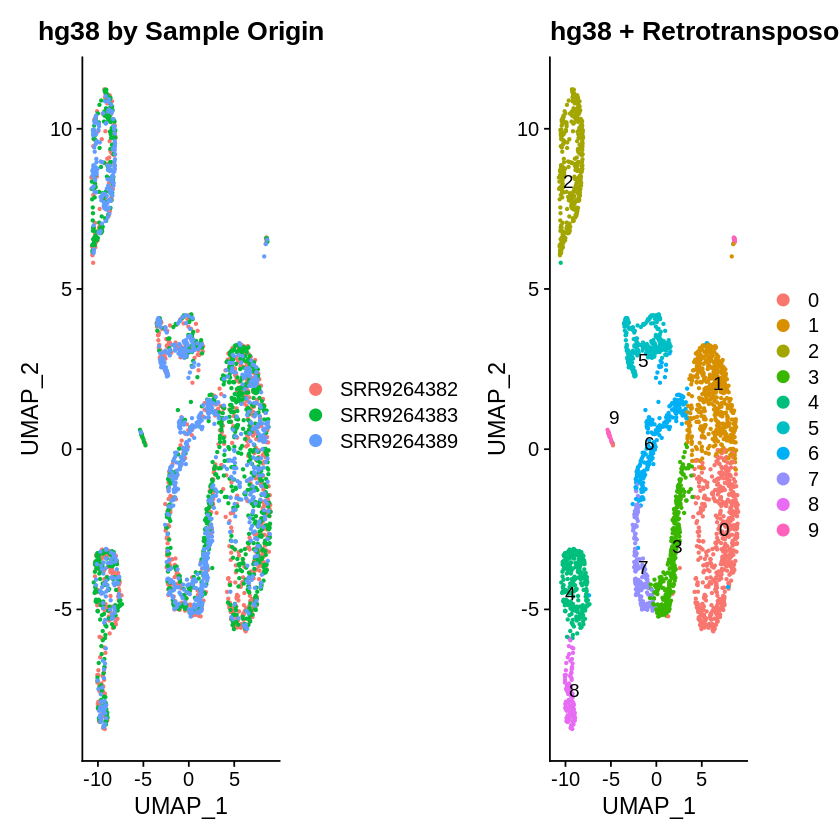

In [197]:
Idents(object = ge_umaps[[1]]) <- "integrated_snn_res.0.4"
Idents(object = gte_umaps[[1]]) <- "integrated_snn_res.0.4"

p1 <- DimPlot(ge_umaps[[1]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p2 <- DimPlot(ge_umaps[[1]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

p3 <- DimPlot(gte_umaps[[1]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p4 <- DimPlot(gte_umaps[[1]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")

p1+p2
p3+p4
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_umap_PC8_r04.pdf", width = size*2, height = size*2)
grid.arrange(p1, p2, p3, p4, nrow=2, 
             top = "UMAP PC8 resolution 0.4")
dev.off()

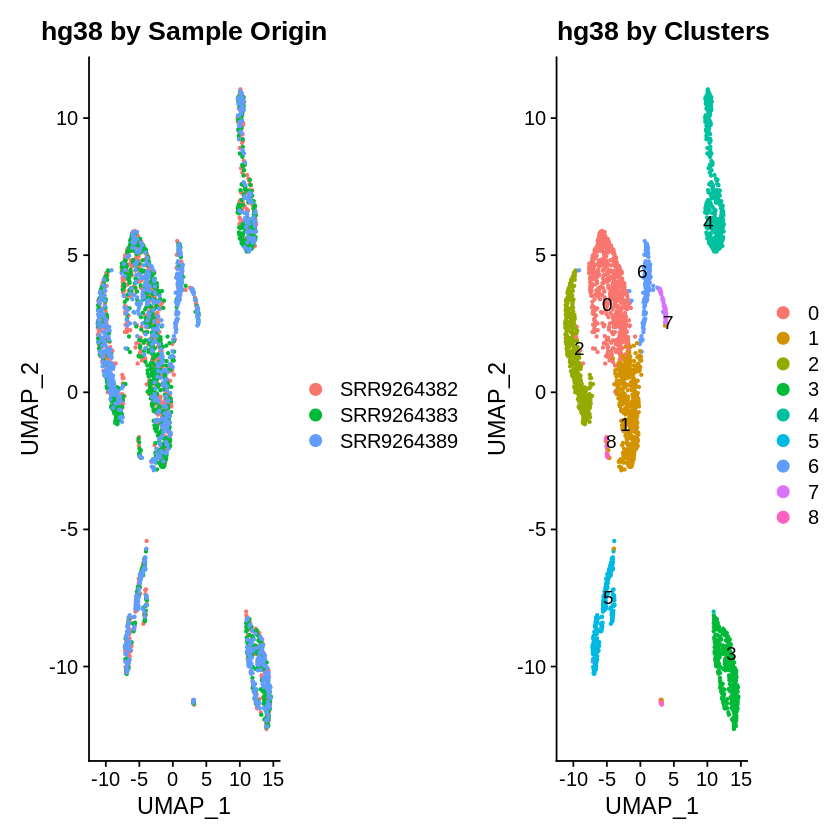

png 
  2

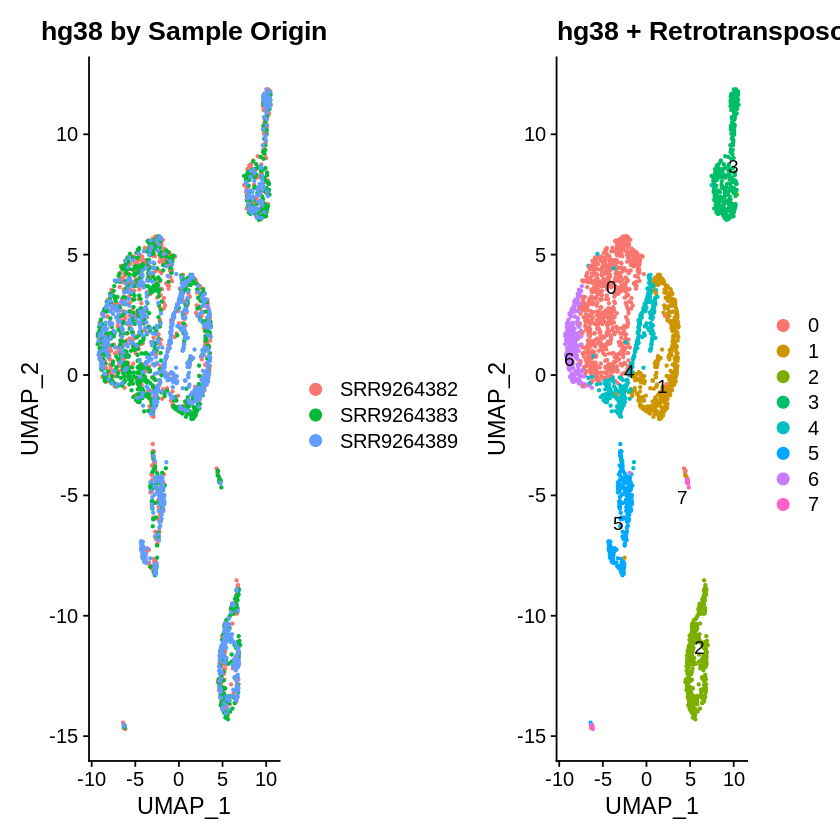

In [198]:
Idents(object = ge_umaps[[2]]) <- "integrated_snn_res.0.2"
Idents(object = gte_umaps[[2]]) <- "integrated_snn_res.0.2"

p1 <- DimPlot(ge_umaps[[2]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p2 <- DimPlot(ge_umaps[[2]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

p3 <- DimPlot(gte_umaps[[2]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p4 <- DimPlot(gte_umaps[[2]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")

p1+p2
p3+p4
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_umap_PC9_r02.pdf", width = size*2, height = size*2)
grid.arrange(p1, p2, p3, p4, nrow=2, 
             top = "UMAP PC9 resolution 0.2")
dev.off()

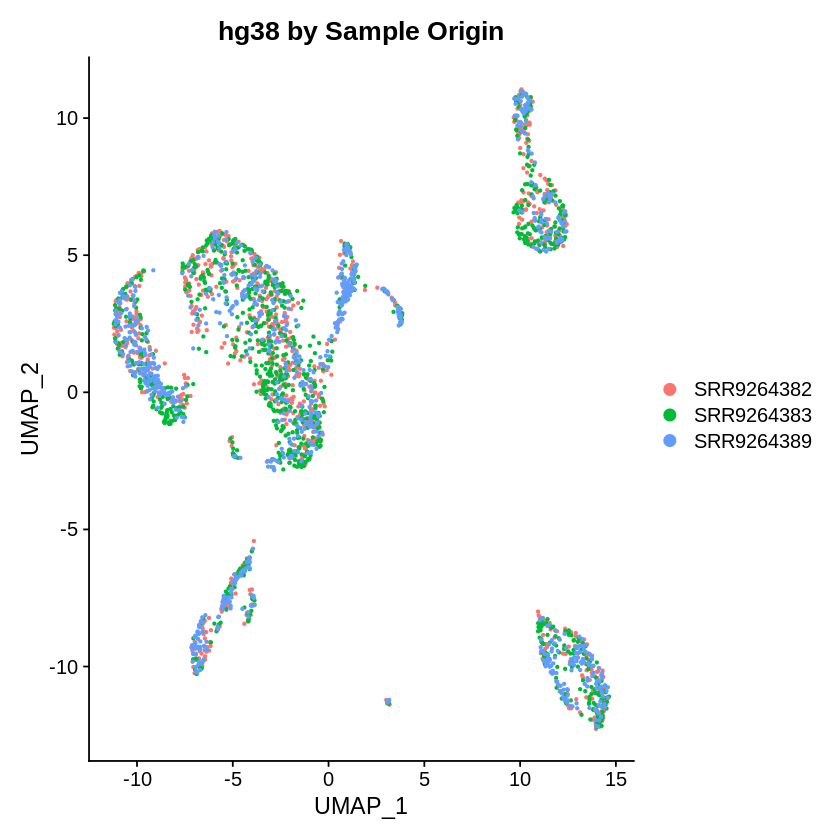

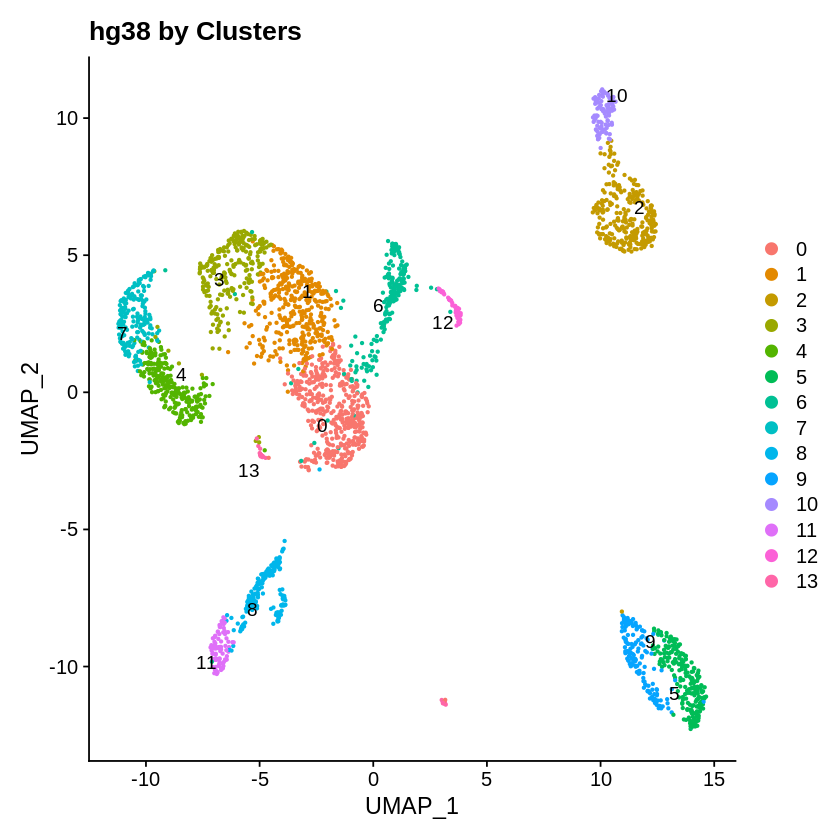

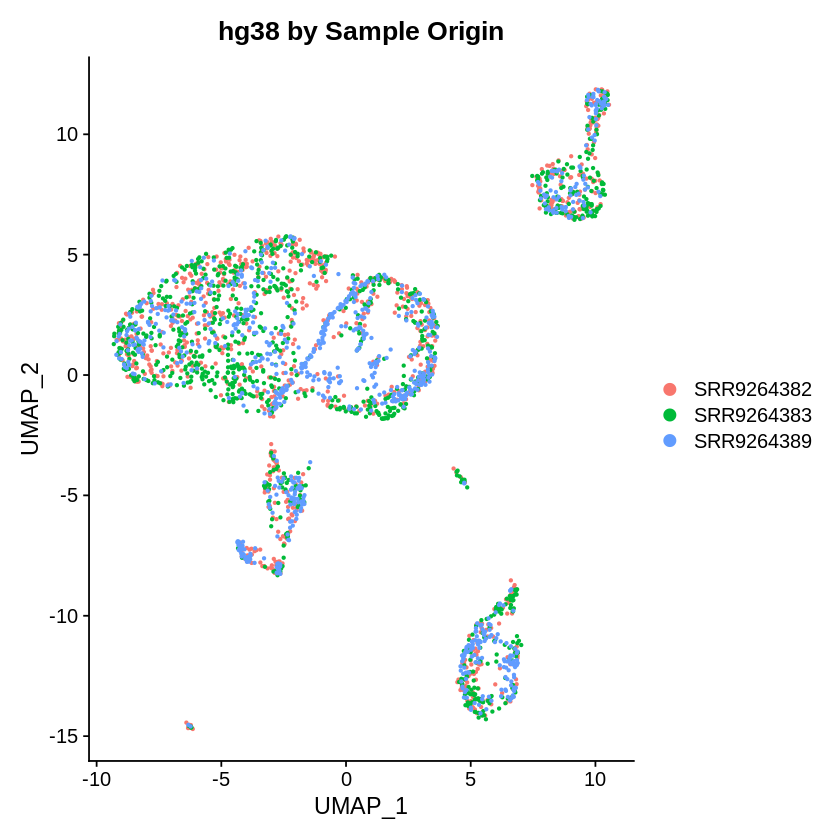

png 
  2

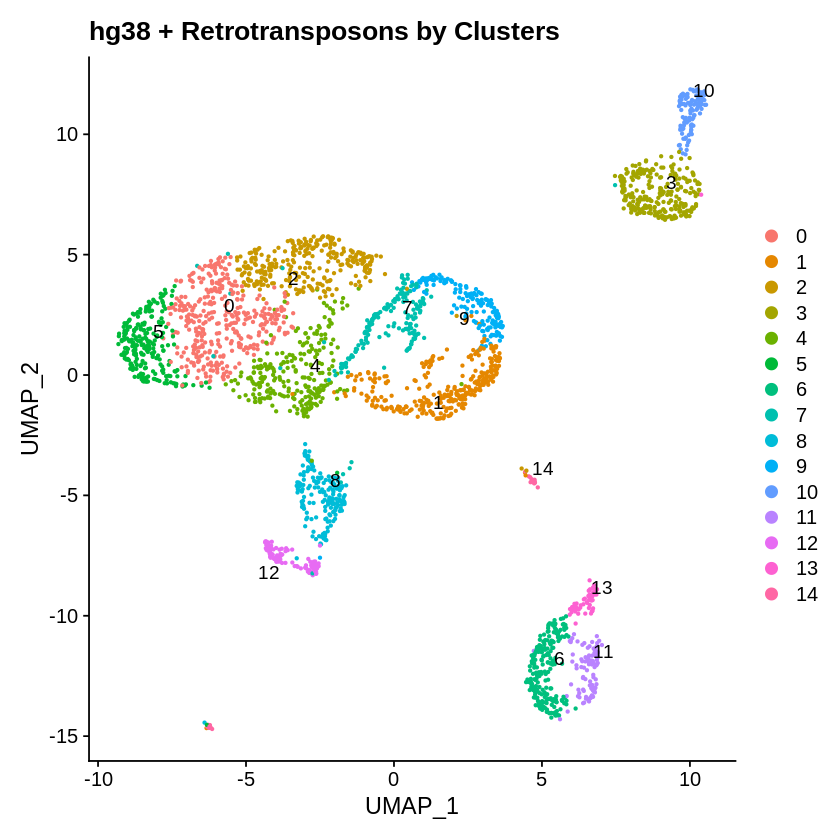

In [200]:
Idents(object = ge_umaps[[2]]) <- "integrated_snn_res.0.8"
Idents(object = gte_umaps[[2]]) <- "integrated_snn_res.0.8"

p1 <- DimPlot(ge_umaps[[2]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p2 <- DimPlot(ge_umaps[[2]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

p3 <- DimPlot(gte_umaps[[2]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p4 <- DimPlot(gte_umaps[[2]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")

p1
p2
p3
p4
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_umap_PC9_r08.pdf", width = size*2, height = size*2)
grid.arrange(p1, p2, p3, p4, nrow=2, 
             top = "UMAP PC9 resolution 0.8")
dev.off()

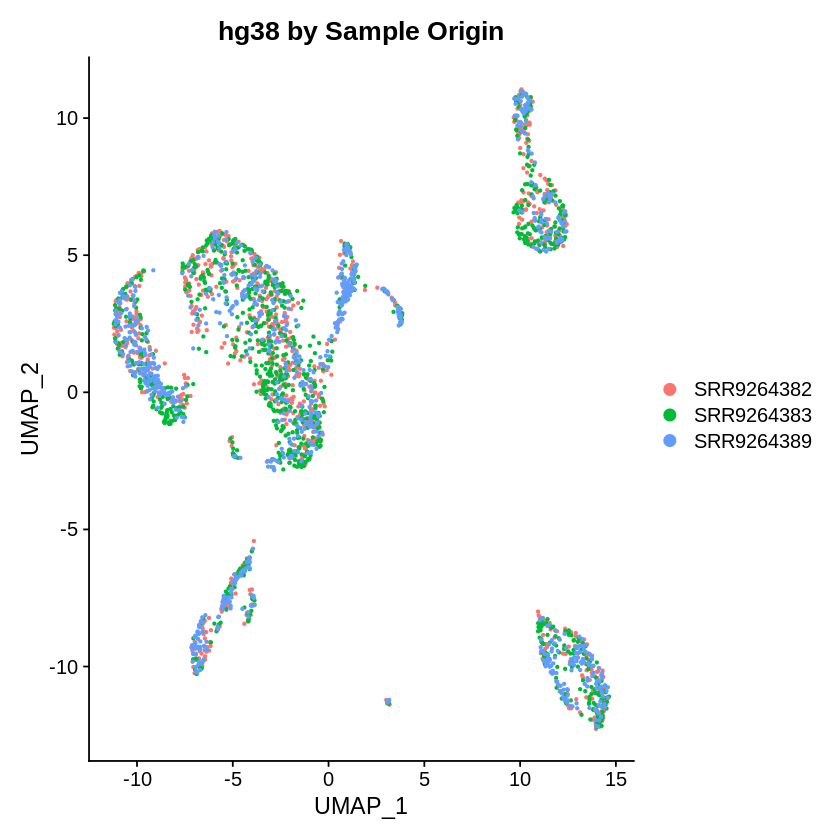

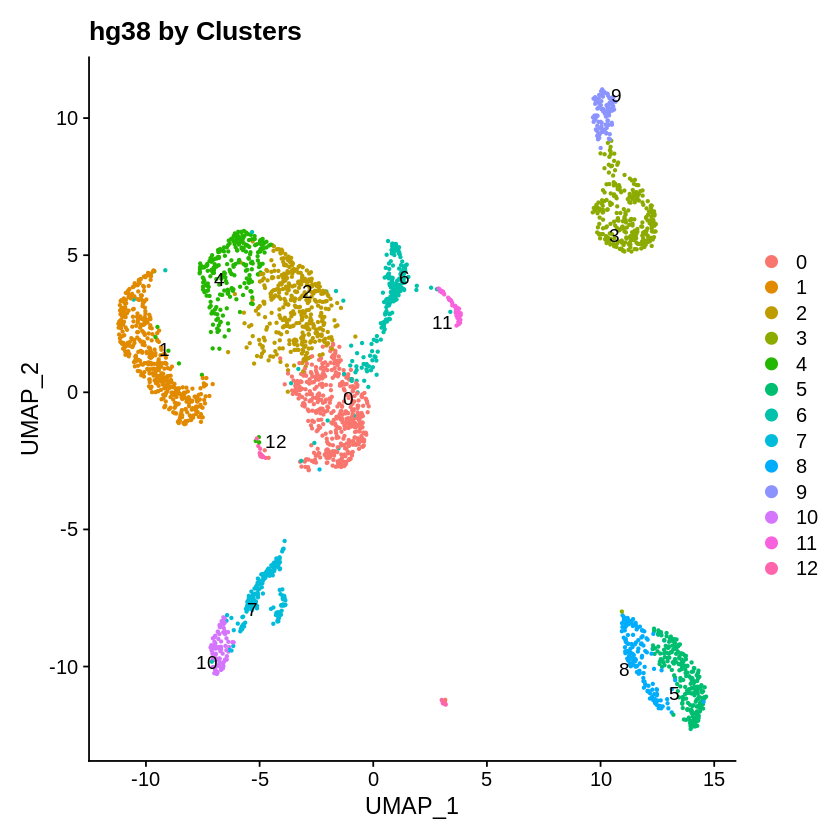

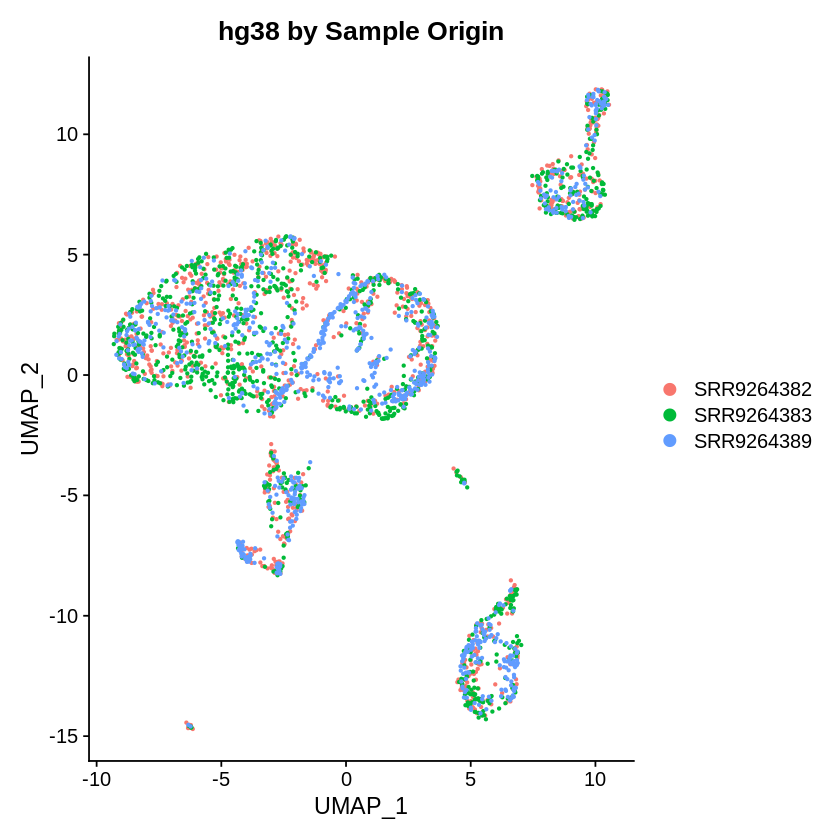

png 
  2

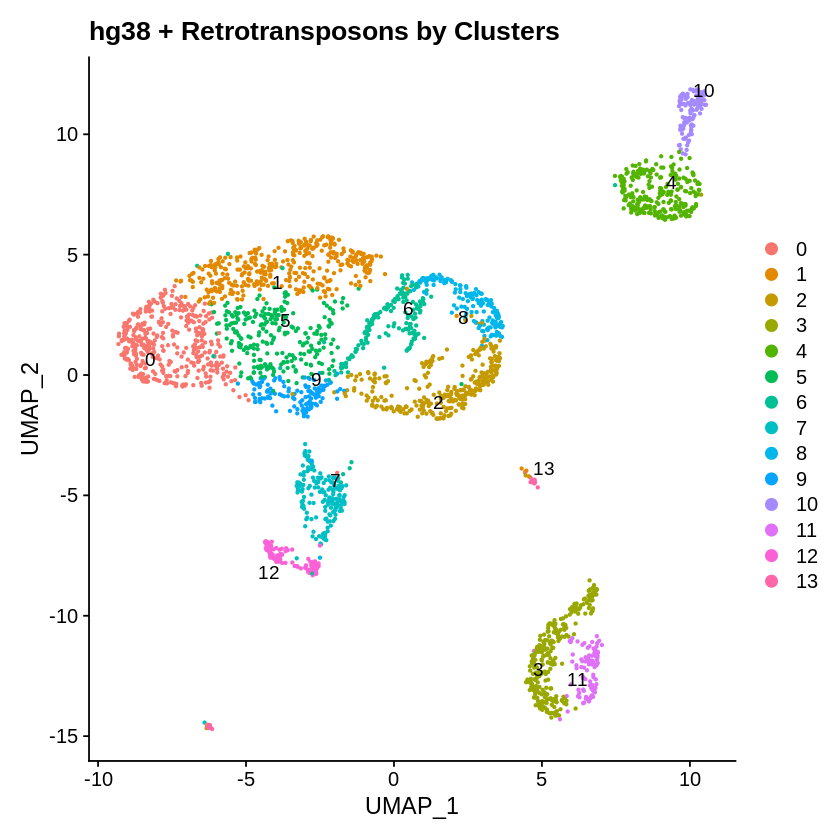

In [201]:
Idents(object = ge_umaps[[2]]) <- "integrated_snn_res.0.6"
Idents(object = gte_umaps[[2]]) <- "integrated_snn_res.0.6"

p1 <- DimPlot(ge_umaps[[2]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p2 <- DimPlot(ge_umaps[[2]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

p3 <- DimPlot(gte_umaps[[2]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
p4 <- DimPlot(gte_umaps[[2]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")

p1
p2
p3
p4
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-07-22/r_brain_umap_PC9_r06.pdf", width = size*2, height = size*2)
grid.arrange(p1, p2, p3, p4, nrow=2, 
             top = "UMAP PC9 resolution 0.6")
dev.off()

There's too few islands if I choose a resolution lower than 10. I'll additionally perform create a few more UMAPs between PC12 and 17 (inclusively) to make my decision. 

In [18]:
load("~/scratch/gete-gbm/results/2021-07-22/ge_brain.umaps.RData")
load("~/scratch/gete-gbm/results/2021-07-22/gte_brain.umaps.RData")

In [19]:
pc <- c(12, 13, 14, 17)

In [20]:
intObjects <- vector(mode="list", length=2)

## doesn't matter which seurat object I take, because the computation is based on PCA results
intObjects[[1]] <- ge_umaps[[1]] 
intObjects[[2]] <- gte_umaps[[1]]

In [21]:
## Perform UMAP analysis
ge_umaps <- vector(mode="list", length=length(pc))
gte_umaps <- vector(mode="list", length=length(pc))

names(ge_umaps) <- as.character(pc)
names(gte_umaps) <- as.character(pc)

for (i in 1:length(pc)){
    ge_umaps[[i]] <- RunUMAP(object = intObjects[[1]], 
                                 reduction = "pca", dims = 1:pc[i], umap.method = "uwot", metric = "cosine")
    gte_umaps[[i]] <- RunUMAP(object = intObjects[[2]], 
                                 reduction = "pca", dims = 1:pc[i], umap.method = "uwot", metric = "cosine")
}

# save(ge_umaps,file="~/scratch/gete-gbm/results/2021-07-22/ge_brain.umaps.RData")
# save(gte_umaps,file="~/scratch/gete-gbm/results/2021-07-22/gte_brain.umaps.RData")

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
13:32:26 UMAP embedding parameters a = 0.9922 b = 1.112

13:32:26 Read 2861 rows and found 12 numeric columns

13:32:26 Using Annoy for neighbor search, n_neighbors = 30

13:32:26 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

13:32:27 Writing NN index file to temp file /tmp/RtmpBqqMAb/file45b070124fe0

13:32:27 Searching Annoy index using 1 thread, search_k = 3000

13:32:28 Annoy recall = 100%

13:32:29 Commencing smooth kNN distance calibration using 1 thread

13:32:31 Initializing fro

In [22]:
## Find Neighbors
for (i in 1:length(pc)) {
    # Determine the K-nearest neighbor graph
    ge_umaps[[i]] <- FindNeighbors(ge_umaps[[i]],dims=1:pc[[i]],reduction="pca")
    gte_umaps[[i]] <- FindNeighbors(gte_umaps[[i]],dims=1:pc[[i]],reduction="pca")
}

# save(ge_umaps,file="~/scratch/gete-gbm/results/2021-07-22/ge_brain.umaps.RData")
# save(gte_umaps,file="~/scratch/gete-gbm/results/2021-07-22/gte_brain.umaps.RData")

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN



In [23]:
res <- c(0.2, 0.4, 0.6)

# Find Clusters with a vector of resolutions
for (i in 1:length(ge_umaps)) { ## Compute clusters for each separate umap 
    for (j in 1:length(res)) { ## Compute for each resolution
        ge_umaps[[i]] <- FindClusters(ge_umaps[[i]], resolution = res[j])
        gte_umaps[[i]] <- FindClusters(gte_umaps[[i]], resolution = res[j])
    }
}

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2861
Number of edges: 92789

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9492
Number of communities: 11
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2861
Number of edges: 91435

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9463
Number of communities: 10
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2861
Number of edges: 92789

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9240
Number of communities: 12
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2861
Number of edges: 91435

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9213
Number of communities: 14
Elapsed time: 0 seconds
Modularity Optimizer

In [24]:
# You can view different resolutions using:
# Idents(object = filt_gte_brain.intergrated) <- "integrated_snn_res.0.8"
save(ge_umaps,file="~/scratch/gete-gbm/results/2021-08-05/ge_brain.umaps_12-13-14-17.RData")
save(gte_umaps,file="~/scratch/gete-gbm/results/2021-08-05/gte_brain.umaps_12-13-14-17.RData")

In [276]:
load("~/scratch/gete-gbm/results/2021-08-05/ge_brain.umaps_12-13-14-17.RData")
load("~/scratch/gete-gbm/results/2021-08-05/gte_brain.umaps_12-13-14-17.RData")

In [25]:
p <- vector(mode="list", length=length(ge_umaps))

for (i in 1:length(ge_umaps)) {
    Idents(object = ge_umaps[[i]]) <- "integrated_snn_res.0.2"
    Idents(object = gte_umaps[[i]]) <- "integrated_snn_res.0.2"

    p[[i]][[1]] <- DimPlot(ge_umaps[[i]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
    p[[i]][[2]] <- DimPlot(ge_umaps[[i]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

    p[[i]][[3]] <- DimPlot(gte_umaps[[i]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
    p[[i]][[4]] <- DimPlot(gte_umaps[[i]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")
}

In [26]:
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-05/r_brain_umaps_PC12_r02.pdf", width = size*2, height = size*2)
grid.arrange(p[[1]][[1]], p[[1]][[2]], 
             p[[1]][[3]], p[[1]][[4]], nrow=2, top = "UMAP PC12 resolution 0.2")
dev.off()
pdf("~/scratch/gete-gbm/results/2021-08-05/r_brain_umaps_PC13_r02.pdf", width = size*2, height = size*2)
grid.arrange(p[[2]][[1]], p[[2]][[2]], 
             p[[2]][[3]], p[[2]][[4]], nrow=2, top = "UMAP PC13 resolution 0.2")
dev.off()
pdf("~/scratch/gete-gbm/results/2021-08-05/r_brain_umaps_PC14_r02.pdf", width = size*2, height = size*2)
grid.arrange(p[[3]][[1]], p[[3]][[2]], 
             p[[3]][[3]], p[[3]][[4]], nrow=2, top = "UMAP PC14 resolution 0.2")
dev.off()
pdf("~/scratch/gete-gbm/results/2021-08-05/r_brain_umaps_PC17_r02.pdf", width = size*2, height = size*2)
grid.arrange(p[[4]][[1]], p[[4]][[2]], 
             p[[4]][[3]], p[[4]][[4]], nrow=2, top = "UMAP PC17 resolution 0.2")
dev.off()

png 
  2

png 
  2

png 
  2

png 
  2

In [27]:
p <- vector(mode="list", length=length(ge_umaps))

for (i in 1:length(ge_umaps)) {
    Idents(object = ge_umaps[[i]]) <- "integrated_snn_res.0.4"
    Idents(object = gte_umaps[[i]]) <- "integrated_snn_res.0.4"

    p[[i]][[1]] <- DimPlot(ge_umaps[[i]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
    p[[i]][[2]] <- DimPlot(ge_umaps[[i]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

    p[[i]][[3]] <- DimPlot(gte_umaps[[i]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
    p[[i]][[4]] <- DimPlot(gte_umaps[[i]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")
}

In [29]:
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-05/r_brain_umaps_PC14_r04.pdf", width = size*2, height = size*2)
grid.arrange(p[[3]][[1]], p[[3]][[2]], 
             p[[3]][[3]], p[[3]][[4]], nrow=2, top = "UMAP PC14 resolution 0.4")
dev.off()


png 
  2

In [30]:
p <- vector(mode="list", length=length(ge_umaps))

for (i in 1:length(ge_umaps)) {
    Idents(object = ge_umaps[[i]]) <- "integrated_snn_res.0.6"
    Idents(object = gte_umaps[[i]]) <- "integrated_snn_res.0.6"

    p[[i]][[1]] <- DimPlot(ge_umaps[[i]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
    p[[i]][[2]] <- DimPlot(ge_umaps[[i]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 by Clusters")

    p[[i]][[3]] <- DimPlot(gte_umaps[[i]], reduction = "umap", group.by = "sample") + ggtitle("hg38 by Sample Origin")
    p[[i]][[4]] <- DimPlot(gte_umaps[[i]], reduction = "umap", label = TRUE, repel = TRUE) + ggtitle("hg38 + Retrotransposons by Clusters")
}

In [31]:
# Save figures
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-05/r_brain_umaps_PC14_r06.pdf", width = size*2, height = size*2)
grid.arrange(p[[3]][[1]], p[[3]][[2]], 
             p[[3]][[3]], p[[3]][[4]], nrow=2, top = "UMAP PC14 resolution 0.6")
dev.off()

png 
  2

In [277]:
ge_umaps[["14"]]$sample <- factor(ge_umaps[["14"]]$sample, levels=unique(ge_umaps[["14"]]$sample))
gte_umaps[["14"]]$sample <- factor(gte_umaps[["14"]]$sample, levels=unique(gte_umaps[["14"]]$sample))

saveRDS(ge_umaps[["14"]], file="~/scratch/gete-gbm/results/2021-08-05/brain_ge-PC14.rds")
saveRDS(gte_umaps[["14"]], file="~/scratch/gete-gbm/results/2021-08-05/brain_gte-PC14.rds")

## DEG
- 2021-08-05: Computed `FindAllMarkers()` and stored dataframes in `ge_brain_markers.RData` and `gte_brain_markers.RData`
- 2021-08-11: Analyzed markers for each cluster

In [278]:
intObjects <- vector(mode="list", length=2)
intObjects[[1]] <- readRDS("~/scratch/gete-gbm/results/2021-08-05/brain_ge-PC14.rds")
intObjects[[2]] <- readRDS("~/scratch/gete-gbm/results/2021-08-05/brain_gte-PC14.rds")

In [76]:
# Default FindAllMarkers() parameters were: 
# test.use = Wlcoxon Rank Sum test min.pct=0.1, min.diff.pct=-Inf, logfc.threshold=0.25

# This step takes around 1h20min for each command. 
ge_markers <- FindAllMarkers(intObjects[[1]], 
                             only.pos = FALSE, min.pct = 0.25, min.diff.pct = 0.25, logfc.threshold = 0.25)
gte_markers <- FindAllMarkers(intObjects[[2]], 
                              only.pos = FALSE, min.pct = 0.25, min.diff.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13



In [77]:
save(ge_markers, file="/home/samkyy/scratch/gete-gbm/results/2021-08-05/ge_brain_markers.RData")
save(gte_markers, file="/home/samkyy/scratch/gete-gbm/results/2021-08-05/gte_brain_markers.RData")

In [78]:
load("/home/samkyy/scratch/gete-gbm/results/2021-08-05/ge_brain_markers.RData")
load("/home/samkyy/scratch/gete-gbm/results/2021-08-05/gte_brain_markers.RData")

Results of FindAllMarkers()
- p_val: p-value not adjusted for multiple test correction for condition
- avg_logFC: average log2 fold change for condition. Positive values indicate that the gene is more highly expressed in the cluster.
- pct.1: percentage of cells where the gene is detected in the cluster for condition
- pct.2: percentage of cells where the gene is detected on average in the other clusters for condition
- p_val_adj: adjusted p-value for condition, based on bonferroni correction using all genes in the dataset, used to determine significance

In [79]:
# Show table with the highest expressed gene from each cluster
ge_markers %>% group_by(cluster) %>% top_n(n = 2, wt = avg_log2FC)
gte_markers %>% group_by(cluster) %>% top_n(n = 5, wt = avg_log2FC)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
1.911425e-68,0.7375090,0.780,0.504,3.822849e-65,0,PCP4
1.419013e-05,-0.2521473,0.072,0.350,2.838026e-02,0,SLC32A1
2.400298e-45,0.6158699,0.970,0.678,4.800596e-42,1,LMO4
1.455726e-37,0.6927814,0.741,0.489,2.911453e-34,1,ANO3
2.389765e-32,-0.2643734,0.185,0.520,4.779529e-29,2,AC092376.2
4.469143e-21,-0.3524711,0.172,0.464,8.938285e-18,2,KLHL5
3.947987e-102,2.1195404,0.925,0.621,7.895974e-99,3,ERBB4
7.682865e-99,2.0797692,0.943,0.614,1.536573e-95,3,GAD1
2.530268e-103,3.5606187,0.875,0.549,5.060537e-100,4,CXCL14


p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
1.911425e-68,0.7375090,0.780,0.504,3.822849e-65,0,PCP4
8.910027e-39,-0.2623170,0.161,0.502,1.782005e-35,0,SLC24A3
5.891497e-35,-0.2635143,0.054,0.431,1.178299e-31,0,GPRIN3
2.047761e-26,-0.2641329,0.327,0.602,4.095523e-23,0,MCTP1
1.419013e-05,-0.2521473,0.072,0.350,2.838026e-02,0,SLC32A1
3.841690e-57,0.5370295,0.802,0.446,7.683380e-54,1,LINC00507
2.715750e-47,0.5966628,0.857,0.605,5.431500e-44,1,SERPINE2
7.438289e-46,0.5912552,0.957,0.701,1.487658e-42,1,MRTFB
2.400298e-45,0.6158699,0.970,0.678,4.800596e-42,1,LMO4


2021-08-11:
- Analyze Markers for each cluster

In [6]:
load("/home/samkyy/scratch/gete-gbm/results/2021-08-05/ge_brain_markers.RData")
load("/home/samkyy/scratch/gete-gbm/results/2021-08-05/gte_brain_markers.RData")

In [8]:
dim(ge_markers)
dim(gte_markers)

[1] 1629    7

[1] 1629    7

In [28]:
# Show table with the highest expressed gene from each cluster
top10ge <- ge_markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)
top10gte <- gte_markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)

In [29]:
head(top10ge)
head(top10gte)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
1.911425e-68,0.7375090,0.780,0.504,3.822849e-65,0,PCP4
2.994641e-39,-0.2948307,0.304,0.594,5.989282e-36,0,VEGFA
8.910027e-39,-0.2623170,0.161,0.502,1.782005e-35,0,SLC24A3
1.211304e-38,-0.2766626,0.178,0.496,2.422609e-35,0,FGFR1
5.891497e-35,-0.2635143,0.054,0.431,1.178299e-31,0,GPRIN3
1.852830e-34,-0.2670718,0.050,0.353,3.705659e-31,0,ARX


p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
1.911425e-68,0.7375090,0.780,0.504,3.822849e-65,0,PCP4
2.994641e-39,-0.2948307,0.304,0.594,5.989282e-36,0,VEGFA
8.910027e-39,-0.2623170,0.161,0.502,1.782005e-35,0,SLC24A3
1.211304e-38,-0.2766626,0.178,0.496,2.422609e-35,0,FGFR1
5.891497e-35,-0.2635143,0.054,0.431,1.178299e-31,0,GPRIN3
1.852830e-34,-0.2670718,0.050,0.353,3.705659e-31,0,ARX


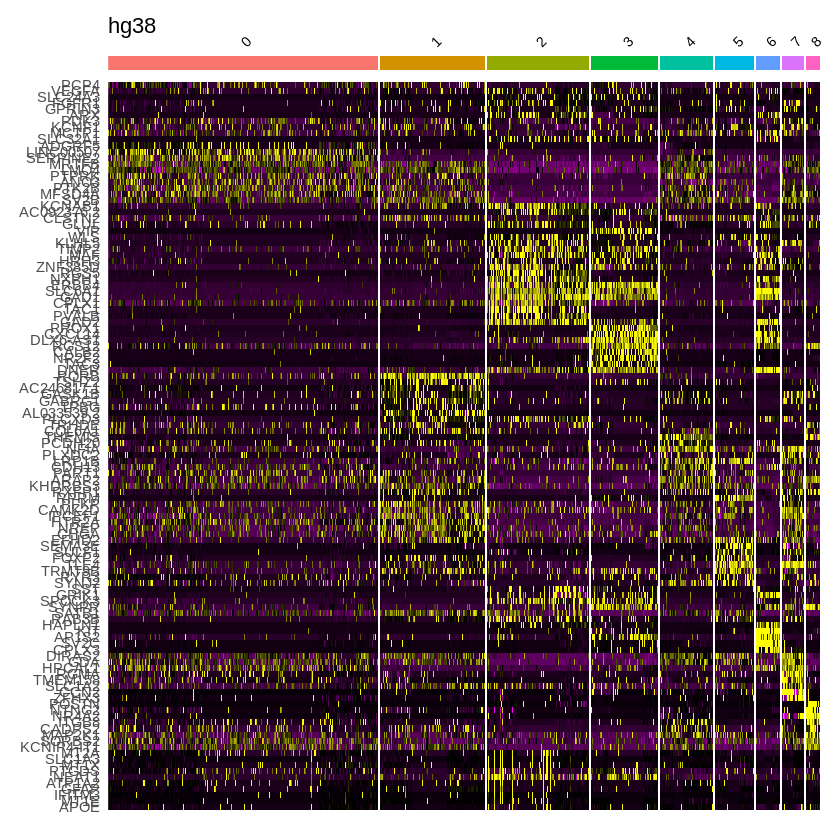

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-08-11"


Warning message in dir.create(file.path(maindir, subdir)):
"'/home/samkyy/scratch/gete-gbm/results/2021-08-11' already exists"


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-08-11"


png 
  2

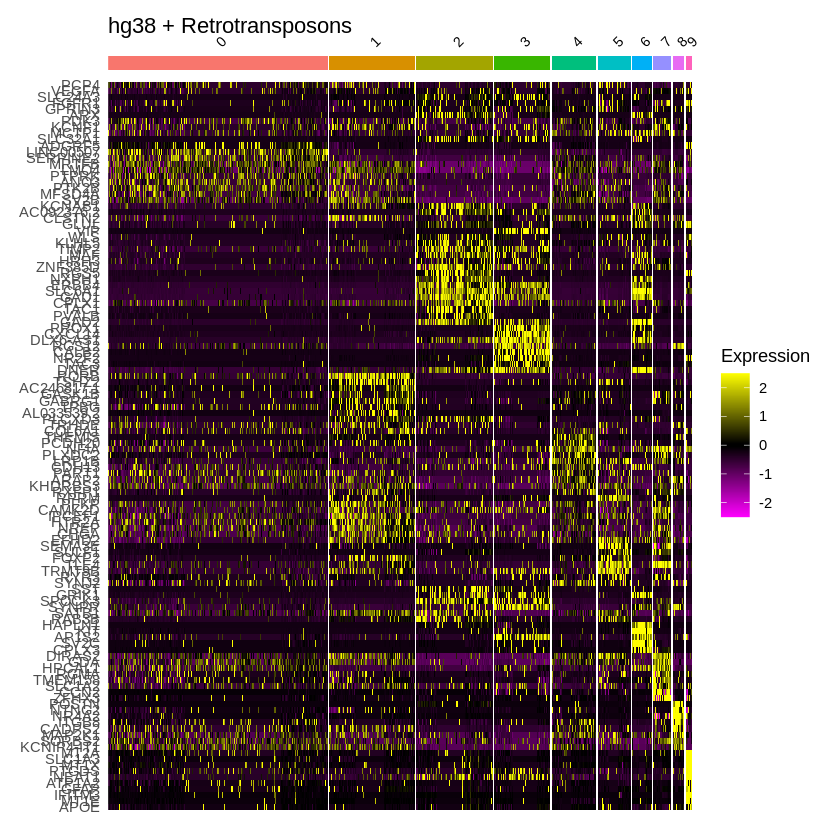

In [44]:
DefaultAssay(intObjects[[1]]) <- "integrated"
DefaultAssay(intObjects[[2]]) <- "integrated"

Idents(intObjects[[1]]) <- "integrated_snn_res.0.2"
Idents(intObjects[[2]]) <- "integrated_snn_res.0.2"

p <- DoHeatmap(intObjects[[1]], features=top10ge$gene, size=3) +
        ggtitle("hg38") + NoLegend()
p2 <- DoHeatmap(intObjects[[2]], features=top10gte$gene, size=3) + 
        ggtitle("hg38 + Retrotransposons") + guides(color = "none") 
p
p2
# Save figures
mkdirToday()
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-11/r_brain_PC14r02_DEGHeatmaps.pdf", width = size*2.5, height = size*2)
grid.arrange(p, p2, nrow = 1, top="Healthy Brain Samples: Heatmap of Differentially Expressed Genes by Cluster")
dev.off()

In [45]:
# Ridge plots - from ggridges. Visualize single cell expression distributions in each cluster
p <- RidgePlot(intObjects[[1]], features = top10ge$gene, ncol = 7)
p2 <- RidgePlot(intObjects[[2]], features = top10gte$gene, ncol = 7)


# Save figures
mkdirToday()
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-11/r_brain_PC14r02_DEGRidgePlot.pdf", width = size*3, height = size*10)
p
p2
dev.off()

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-08-11"


Warning message in dir.create(file.path(maindir, subdir)):
"'/home/samkyy/scratch/gete-gbm/results/2021-08-11' already exists"


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-08-11"


Picking joint bandwidth of 0.1

Picking joint bandwidth of 0.0444

Picking joint bandwidth of 0.0166

Picking joint bandwidth of 0.0479

Picking joint bandwidth of 0.0345

Picking joint bandwidth of 0.0452

Picking joint bandwidth of 0.111

Picking joint bandwidth of 0.125

Picking joint bandwidth of 0.186

Picking joint bandwidth of 0.0379

Picking joint bandwidth of 0.00711

Picking joint bandwidth of 0.0381

Picking joint bandwidth of 0.101

Picking joint bandwidth of 0.18

Picking joint bandwidth of 0.205

Picking joint bandwidth of 0.108

Picking joint bandwidth of 0.127

Picking joint bandwidth of 0.165

Picking joint bandwidth of 0.143

Picking joint bandwidth of 0.187

Picking joint bandwidth of 0.0892

Picking joint bandwidth of 0.0339

Picking joint bandwidth of 0.19

Picking joint bandwidth of 0.084

Picking joint bandwidth of 0.0526

Picking joint bandwidth of 0.0734

Picking joint bandwidth of 0.0785

Picking joint bandwidth of 0.127

Picking joint bandwidth of 0.0916

Pic

Picking joint bandwidth of 0.0359

Picking joint bandwidth of 0.0625

Picking joint bandwidth of 0.029

Picking joint bandwidth of 0.0412

Picking joint bandwidth of 0.0991

Picking joint bandwidth of 0.11

Picking joint bandwidth of 0.0711

Picking joint bandwidth of 0.0845

Picking joint bandwidth of 0.0613

Picking joint bandwidth of 0.0299

Picking joint bandwidth of 0.0763

Picking joint bandwidth of 0.0342

Picking joint bandwidth of 0.119

Picking joint bandwidth of 0.168

Picking joint bandwidth of 0.144

Picking joint bandwidth of 0.0974

Picking joint bandwidth of 0.0897

Picking joint bandwidth of 0.0425

Picking joint bandwidth of 0.0286

Picking joint bandwidth of 0.169

Picking joint bandwidth of 0.042

Picking joint bandwidth of 0.032

Picking joint bandwidth of 0.025

Picking joint bandwidth of 0.0385

Picking joint bandwidth of 0.0487

Picking joint bandwidth of 0.0401

Picking joint bandwidth of 0.114

Picking joint bandwidth of 0.136

Picking joint bandwidth of 0.069

png 
  2

## Cell-Type Determination
2021-08-06:

In [9]:
intObjects <- vector(mode="list", length=2)
intObjects[[1]] <- readRDS("~/scratch/gete-gbm/results/2021-08-05/brain_ge-PC14.rds")
intObjects[[2]] <- readRDS("~/scratch/gete-gbm/results/2021-08-05/brain_gte-PC14.rds")

Known Brain Cell Markers:
- STMN2, TBR1 (neuron)
- SLC17A, SLC17A6 (excitatory neruon)
- SLC32A1 GAD1 GAD (inhibitory neuron)
- MBP MOG (oligodendrocyte)
- OLIG1, OLIG2 (OPC)
- SLC1A2, GFAP, AQP4 (astrocyte)
- FLT1, VWF (endothelial cells)
- PDGFRB (pericyte)
- TREM2, GPR34, CSF1R (microglia)
- C1QC (microglia)
- CD3E, CD8A (T cell)

In [80]:
brain_markers <- c('STMN2', 'TBR1', 'SLC17A', 'SLC17A6', 'SLC32A1', 'GAD1', 'GAD', 'MBP', 'MOG', 'OLIG1', 'OLIG2',
                   'SLC1A2', 'GFAP', 'AQP4', 'FLT1', 'VWF', 'PDGFRB', 'TREM2', 'GPR34', 'CSF1R', 'C1QC', 'CD3E', 'CD8A' ) 

In [81]:
DefaultAssay(intObjects[[1]]) <- "integrated"
DefaultAssay(intObjects[[2]]) <- "integrated"
print(brain_markers)
print(match(brain_markers, rownames(intObjects[[1]])))
print(match(brain_markers, rownames(intObjects[[2]])))

 [1] "STMN2"   "TBR1"    "SLC17A"  "SLC17A6" "SLC32A1" "GAD1"    "GAD"    
 [8] "MBP"     "MOG"     "OLIG1"   "OLIG2"   "SLC1A2"  "GFAP"    "AQP4"   
[15] "FLT1"    "VWF"     "PDGFRB"  "TREM2"   "GPR34"   "CSF1R"   "C1QC"   
[22] "CD3E"    "CD8A"   
 [1]  149  454   NA 1210  278   13   NA   NA   NA  867   NA   86   56 1833   33
[16]   78  438   NA   NA   NA   NA   NA   NA
 [1]  149  454   NA 1210  278   13   NA   NA   NA  867   NA   86   56 1833   33
[16]   78  438   NA   NA   NA   NA   NA   NA


In [82]:
DefaultAssay(intObjects[[1]]) <- "RNA"
DefaultAssay(intObjects[[2]]) <- "RNA"
print(brain_markers)
print(match(brain_markers, rownames(intObjects[[1]])))
print(match(brain_markers, rownames(intObjects[[2]])))

## Missing Genes: SLC17A, GAD, GPR34, CD3E

 [1] "STMN2"   "TBR1"    "SLC17A"  "SLC17A6" "SLC32A1" "GAD1"    "GAD"    
 [8] "MBP"     "MOG"     "OLIG1"   "OLIG2"   "SLC1A2"  "GFAP"    "AQP4"   
[15] "FLT1"    "VWF"     "PDGFRB"  "TREM2"   "GPR34"   "CSF1R"   "C1QC"   
[22] "CD3E"    "CD8A"   
 [1] 10885  3585    NA 13662 23670  3646    NA 21622  8171 24094 24093 13732
[13] 20528 21351 16246 14835  7621  8418    NA  7620   351    NA  3146
 [1] 10885  3585    NA 13662 23670  3646    NA 21622  8171 24094 24093 13732
[13] 20528 21351 16246 14835  7621  8418    NA  7620   351    NA  3146


In [83]:
match("SLC17A5", rownames(intObjects[[1]]))
match("SLC17A6", rownames(intObjects[[1]]))

[1] 8620

[1] 13662

In [84]:
match("GPR34", rownames(intObjects[[1]]))
match("GPR34", rownames(intObjects[[1]]))
match("Gpr34", rownames(intObjects[[1]]))
match("Gpr34", rownames(intObjects[[1]]))
    ## This gene will be removed since it's not in the count matrix

[1] NA

[1] NA

[1] NA

[1] NA

In [85]:
cat(match("CD3E", rownames(intObjects[[1]]))," ", match("CD3E", rownames(intObjects[[1]])), "\n" )
cat(match("CD3e", rownames(intObjects[[1]]))," ", match("CD3e", rownames(intObjects[[1]])), "\n" )
cat(match("T3E", rownames(intObjects[[1]]))," ", match("T3E", rownames(intObjects[[1]])), "\n" )
cat(match("IMD18", rownames(intObjects[[1]]))," ", match("IMD18", rownames(intObjects[[1]])), "\n" )
    ## none of these genes were found in the RNA count matrix, 
    ## so it will be removed from the list of markers to be tested. 

NA   NA 
NA   NA 
NA   NA 
NA   NA 


In [86]:
## Final list of markers genes
brain_markers <- c('STMN2', 'TBR1', 'SLC17A5', 'SLC17A6', 'SLC32A1', 'GAD1', 'GAD2', 'MBP', 'MOG', 'OLIG1', 'OLIG2',
                   'SLC1A2', 'GFAP', 'AQP4', 'FLT1', 'VWF', 'PDGFRB', 'TREM2', 'CSF1R', 'C1QC', 'CD8A' ) 
DefaultAssay(intObjects[[1]]) <- "integrated"
DefaultAssay(intObjects[[2]]) <- "integrated"
print(brain_markers)
print(match(brain_markers, rownames(intObjects[[1]])))
print(match(brain_markers, rownames(intObjects[[2]])))

DefaultAssay(intObjects[[1]]) <- "RNA"
DefaultAssay(intObjects[[2]]) <- "RNA"
print(brain_markers)
print(match(brain_markers, rownames(intObjects[[1]])))
print(match(brain_markers, rownames(intObjects[[2]])))

 [1] "STMN2"   "TBR1"    "SLC17A5" "SLC17A6" "SLC32A1" "GAD1"    "GAD2"   
 [8] "MBP"     "MOG"     "OLIG1"   "OLIG2"   "SLC1A2"  "GFAP"    "AQP4"   
[15] "FLT1"    "VWF"     "PDGFRB"  "TREM2"   "CSF1R"   "C1QC"    "CD8A"   
 [1]  149  454   NA 1210  278   13   14   NA   NA  867   NA   86   56 1833   33
[16]   78  438   NA   NA   NA   NA
 [1]  149  454   NA 1210  278   13   14   NA   NA  867   NA   86   56 1833   33
[16]   78  438   NA   NA   NA   NA
 [1] "STMN2"   "TBR1"    "SLC17A5" "SLC17A6" "SLC32A1" "GAD1"    "GAD2"   
 [8] "MBP"     "MOG"     "OLIG1"   "OLIG2"   "SLC1A2"  "GFAP"    "AQP4"   
[15] "FLT1"    "VWF"     "PDGFRB"  "TREM2"   "CSF1R"   "C1QC"    "CD8A"   
 [1] 10885  3585  8620 13662 23670  3646 12538 21622  8171 24094 24093 13732
[13] 20528 21351 16246 14835  7621  8418  7620   351  3146
 [1] 10885  3585  8620 13662 23670  3646 12538 21622  8171 24094 24093 13732
[13] 20528 21351 16246 14835  7621  8418  7620   351  3146


In [87]:
print(brain_markers)
print(match(brain_markers, rownames(ge_markers)))
print(match(brain_markers, rownames(gte_markers)))
dim(ge_markers)
dim(gte_markers)

 [1] "STMN2"   "TBR1"    "SLC17A5" "SLC17A6" "SLC32A1" "GAD1"    "GAD2"   
 [8] "MBP"     "MOG"     "OLIG1"   "OLIG2"   "SLC1A2"  "GFAP"    "AQP4"   
[15] "FLT1"    "VWF"     "PDGFRB"  "TREM2"   "CSF1R"   "C1QC"    "CD8A"   
 [1] 1436  192   NA   NA   56    1   59   NA   NA 1492   NA  512 1304 1368   NA
[16]   NA 1453   NA   NA   NA   NA
 [1] 1436  192   NA   NA   56    1   59   NA   NA 1492   NA  512 1304 1368   NA
[16]   NA 1453   NA   NA   NA   NA


[1] 1629    7

[1] 1629    7

In [88]:
Idents(intObjects[[1]]) <- "integrated_snn_res.0.2"
Idents(intObjects[[2]]) <- "integrated_snn_res.0.2"

In [125]:
DefaultAssay(intObjects[[1]]) <- "RNA"
DefaultAssay(intObjects[[2]]) <- "RNA"

brain_markers.table_ge <- data.frame(matrix(NA, 
                                            nrow = dim(intObjects[[1]]@meta.data)[1], 
                                            ncol = length(brain_markers)))
colnames(brain_markers.table_ge) <- brain_markers

brain_markers.table_gte <- data.frame(matrix(NA, 
                                             nrow = dim(intObjects[[2]]@meta.data)[1], 
                                             ncol = length(brain_markers)))
colnames(brain_markers.table_gte) <- brain_markers



for (i in 1:length(brain_markers)) {
    brain_markers.table_ge[[brain_markers[i]]] <- PercentageFeatureSet(intObjects[[1]], brain_markers[i])[,1]
    brain_markers.table_gte[[brain_markers[i]]] <- PercentageFeatureSet(intObjects[[2]], brain_markers[i])[,1]
}

brain_markers.table_ge$cluster <- intObjects[[1]]$integrated_snn_res.0.2
brain_markers.table_gte$cluster <- intObjects[[2]]$integrated_snn_res.0.2

# rownames(brain_markers.table_ge) <- rownames(intObjects[[1]]@meta.data)
# rownames(brain_markers.table_gte) <- rownames(intObjects[[2]]@meta.data)

In [126]:
head(brain_markers.table_ge)
tail(brain_markers.table_ge)

head(brain_markers.table_gte)
tail(brain_markers.table_ge)

,STMN2,TBR1,SLC17A5,SLC17A6,SLC32A1,GAD1,GAD2,MBP,MOG,OLIG1,⋯,GFAP,AQP4,FLT1,VWF,PDGFRB,TREM2,CSF1R,C1QC,CD8A,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,0.01634254,0.03268508,0.01634254,0.00000000,0,0.0000000,0.00000000,0.01634254,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,4
2,0.00000000,0.00000000,0.00000000,0.00000000,0,0.0000000,0.00000000,0.03146633,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,0
3,0.00000000,0.00000000,0.00000000,0.00000000,0,0.1001669,0.08347245,0.01669449,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,2
4,0.01790190,0.05370569,0.00000000,0.00000000,0,0.0000000,0.00000000,0.00000000,0,0.00000000,⋯,0.0179019,0,0,0,0,0,0,0,0,1
5,0.01363327,0.05453306,0.00000000,0.00000000,0,0.0000000,0.00000000,0.02726653,0,0.01363327,⋯,0.0000000,0,0,0,0,0,0,0,0,7
6,0.00000000,0.00000000,0.00000000,0.02798769,0,0.0000000,0.00000000,0.02798769,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,0


,STMN2,TBR1,SLC17A5,SLC17A6,SLC32A1,GAD1,GAD2,MBP,MOG,OLIG1,⋯,GFAP,AQP4,FLT1,VWF,PDGFRB,TREM2,CSF1R,C1QC,CD8A,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
2856,0.01044823,0.03134469,0.01044823,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,7
2857,0.00000000,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.009563887,0,0,0,0,4
2858,0.00000000,0.02266032,0.00000000,0,0,0,0.02266032,0.04532064,0.02266032,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,1
2859,0.01081666,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.01081666,0,0,0,0.000000000,0,0,0,0,4
2860,0.02120441,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,0
2861,0.01863238,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,1


,STMN2,TBR1,SLC17A5,SLC17A6,SLC32A1,GAD1,GAD2,MBP,MOG,OLIG1,⋯,GFAP,AQP4,FLT1,VWF,PDGFRB,TREM2,CSF1R,C1QC,CD8A,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,0.01634254,0.03268508,0.01634254,0.00000000,0,0.0000000,0.00000000,0.01634254,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,4
2,0.00000000,0.00000000,0.00000000,0.00000000,0,0.0000000,0.00000000,0.03146633,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,0
3,0.00000000,0.00000000,0.00000000,0.00000000,0,0.1001669,0.08347245,0.01669449,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,2
4,0.01790190,0.05370569,0.00000000,0.00000000,0,0.0000000,0.00000000,0.00000000,0,0.00000000,⋯,0.0179019,0,0,0,0,0,0,0,0,1
5,0.01363327,0.05453306,0.00000000,0.00000000,0,0.0000000,0.00000000,0.02726653,0,0.01363327,⋯,0.0000000,0,0,0,0,0,0,0,0,7
6,0.00000000,0.00000000,0.00000000,0.02798769,0,0.0000000,0.00000000,0.02798769,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,0


,STMN2,TBR1,SLC17A5,SLC17A6,SLC32A1,GAD1,GAD2,MBP,MOG,OLIG1,⋯,GFAP,AQP4,FLT1,VWF,PDGFRB,TREM2,CSF1R,C1QC,CD8A,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
2856,0.01044823,0.03134469,0.01044823,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,7
2857,0.00000000,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.009563887,0,0,0,0,4
2858,0.00000000,0.02266032,0.00000000,0,0,0,0.02266032,0.04532064,0.02266032,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,1
2859,0.01081666,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.01081666,0,0,0,0.000000000,0,0,0,0,4
2860,0.02120441,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,0
2861,0.01863238,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,1


In [158]:
## Calculate the average expression in each cluster and the standard deviation
df_ge <- brain_markers.table_ge %>%
            gather(Gene, ExprLevel, STMN2:CD8A) %>%
            group_by(Gene,cluster) %>%
            dplyr::summarize(Mean = mean(ExprLevel, na.rm=TRUE), Stdev = sd(ExprLevel) )

df_gte <- brain_markers.table_gte %>%
            gather(Gene, ExprLevel, STMN2:CD8A) %>%
            group_by(Gene,cluster) %>%
            dplyr::summarize(Mean = mean(ExprLevel, na.rm=TRUE), Stdev = sd(ExprLevel) )

df_ge$Gene <- factor(df_ge$Gene, levels=brain_markers)
df_gte$Gene <- factor(df_gte$Gene, levels=brain_markers)

head(df_ge)
head(df_gte)

`summarise()` has grouped output by 'Gene'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'Gene'. You can override using the `.groups` argument.



Gene,cluster,Mean,Stdev
<fct>,<fct>,<dbl>,<dbl>
AQP4,0,0.0023208480,0.006549630
AQP4,1,0.0009500068,0.003913897
AQP4,2,0.0003176351,0.002503436
AQP4,3,0.0001578183,0.002640806
AQP4,4,0.0024200195,0.005895814
AQP4,5,0.0018169481,0.008372640


Gene,cluster,Mean,Stdev
<fct>,<fct>,<dbl>,<dbl>
AQP4,0,0.0023208480,0.006549630
AQP4,1,0.0009500068,0.003913897
AQP4,2,0.0003176351,0.002503436
AQP4,3,0.0001578183,0.002640806
AQP4,4,0.0024200195,0.005895814
AQP4,5,0.0018169481,0.008372640


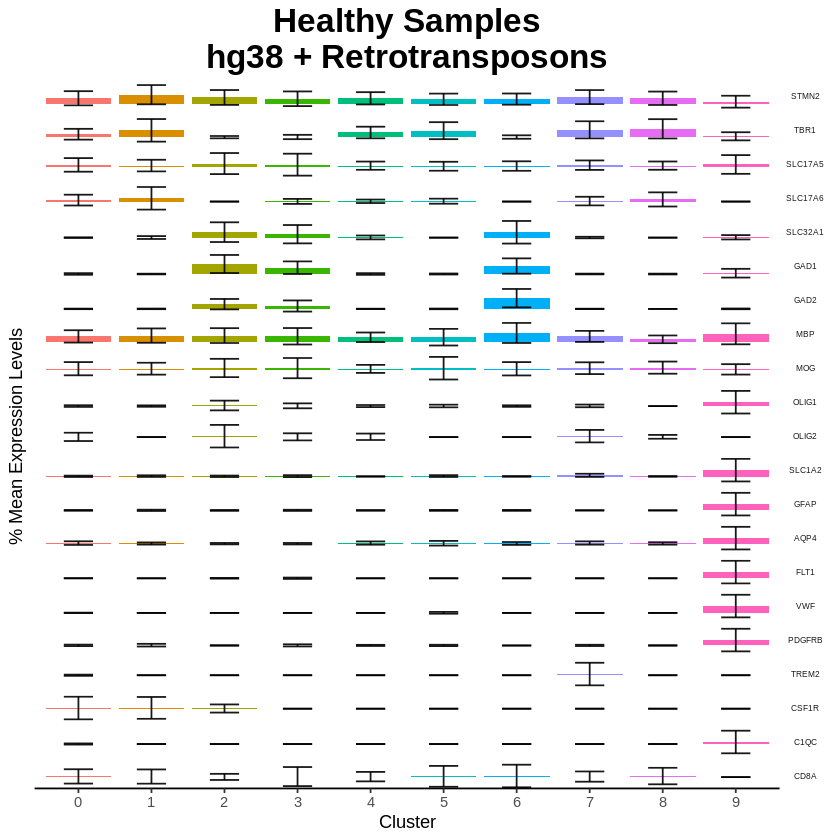

In [214]:
p <- df_ge %>% 
    ggplot(aes(x=cluster, y=Mean, fill=cluster)) + geom_bar( stat="identity", width = 0.9) +
        geom_errorbar( aes(x=cluster, ymin=Mean-Stdev, ymax=Mean+Stdev), width=0.4, colour="black", alpha=0.9, size=0.5) + 
        theme_classic() + 
        ggtitle("Healthy Samples\nhg83") + labs(y = "% Mean Expression Levels", x = "Cluster") +
        theme(legend.position="none", plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
             axis.text.y = element_blank(), axis.ticks.y = element_blank(), axis.line.y = element_blank()) +
        facet_grid(Gene ~ ., scales = "free") + 
        theme(strip.background = element_blank(), strip.text.y = element_text(size = 5, angle = 0))

p2 <- df_gte %>% 
    ggplot(aes(x=cluster, y=Mean, fill=cluster)) + geom_bar( stat="identity", width = 0.9) +
        geom_errorbar( aes(x=cluster, ymin=Mean-Stdev, ymax=Mean+Stdev), width=0.4, colour="black", alpha=0.9, size=0.5) + 
        theme_classic() + 
        ggtitle("Healthy Samples\nhg38 + Retrotransposons") + labs(y = "% Mean Expression Levels", x = "Cluster") +
        theme(legend.position="none", plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
             axis.text.y = element_blank(), axis.ticks.y = element_blank(), axis.line.y = element_blank()) +
        facet_grid(Gene ~ ., scales = "free") + 
        theme(strip.background = element_blank(), strip.text.y = element_text(size = 5, angle= 0))

pg_1 <- ggplotGrob(p)

for(i in which(grepl("strip-r", pg_1$layout$name))){
  pg_1$grobs[[i]]$layout$clip <- "off"
}

pg_2 <- ggplotGrob(p2)

for(i in which(grepl("strip-r", pg_2$layout$name))){
  pg_2$grobs[[i]]$layout$clip <- "off"
}


grid::grid.draw(pg_1)
grid::grid.draw(pg_2)

In [216]:
# Save figures
mkdirToday()
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-06/r_brain_PC14r02_celltypeBAR.pdf", width = size*1.5, height = size*1)
grid.arrange(pg_1, pg_2, nrow=1)
dev.off()

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-08-06"


Warning message in dir.create(file.path(maindir, subdir)):
"'/home/samkyy/scratch/gete-gbm/results/2021-08-06' already exists"


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-08-06"


png 
  2

Repeat with resolution 0.4

In [227]:
Idents(intObjects[[1]]) <- "integrated_snn_res.0.4"
Idents(intObjects[[2]]) <- "integrated_snn_res.0.4"

In [228]:
DefaultAssay(intObjects[[1]]) <- "RNA"
DefaultAssay(intObjects[[2]]) <- "RNA"

brain_markers.table_ge <- data.frame(matrix(NA, 
                                            nrow = dim(intObjects[[1]]@meta.data)[1], 
                                            ncol = length(brain_markers)))
colnames(brain_markers.table_ge) <- brain_markers

brain_markers.table_gte <- data.frame(matrix(NA, 
                                             nrow = dim(intObjects[[2]]@meta.data)[1], 
                                             ncol = length(brain_markers)))
colnames(brain_markers.table_gte) <- brain_markers



for (i in 1:length(brain_markers)) {
    brain_markers.table_ge[[brain_markers[i]]] <- PercentageFeatureSet(intObjects[[1]], brain_markers[i])[,1]
    brain_markers.table_gte[[brain_markers[i]]] <- PercentageFeatureSet(intObjects[[2]], brain_markers[i])[,1]
}

brain_markers.table_ge$cluster <- intObjects[[1]]$integrated_snn_res.0.4
brain_markers.table_gte$cluster <- intObjects[[2]]$integrated_snn_res.0.4

# rownames(brain_markers.table_ge) <- rownames(intObjects[[1]]@meta.data)
# rownames(brain_markers.table_gte) <- rownames(intObjects[[2]]@meta.data)

In [229]:
head(brain_markers.table_ge)
tail(brain_markers.table_ge)

head(brain_markers.table_gte)
tail(brain_markers.table_ge)

,STMN2,TBR1,SLC17A5,SLC17A6,SLC32A1,GAD1,GAD2,MBP,MOG,OLIG1,⋯,GFAP,AQP4,FLT1,VWF,PDGFRB,TREM2,CSF1R,C1QC,CD8A,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,0.01634254,0.03268508,0.01634254,0.00000000,0,0.0000000,0.00000000,0.01634254,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,6
2,0.00000000,0.00000000,0.00000000,0.00000000,0,0.0000000,0.00000000,0.03146633,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,1
3,0.00000000,0.00000000,0.00000000,0.00000000,0,0.1001669,0.08347245,0.01669449,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,3
4,0.01790190,0.05370569,0.00000000,0.00000000,0,0.0000000,0.00000000,0.00000000,0,0.00000000,⋯,0.0179019,0,0,0,0,0,0,0,0,7
5,0.01363327,0.05453306,0.00000000,0.00000000,0,0.0000000,0.00000000,0.02726653,0,0.01363327,⋯,0.0000000,0,0,0,0,0,0,0,0,11
6,0.00000000,0.00000000,0.00000000,0.02798769,0,0.0000000,0.00000000,0.02798769,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,1


,STMN2,TBR1,SLC17A5,SLC17A6,SLC32A1,GAD1,GAD2,MBP,MOG,OLIG1,⋯,GFAP,AQP4,FLT1,VWF,PDGFRB,TREM2,CSF1R,C1QC,CD8A,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
2856,0.01044823,0.03134469,0.01044823,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,11
2857,0.00000000,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.009563887,0,0,0,0,6
2858,0.00000000,0.02266032,0.00000000,0,0,0,0.02266032,0.04532064,0.02266032,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,7
2859,0.01081666,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.01081666,0,0,0,0.000000000,0,0,0,0,6
2860,0.02120441,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,1
2861,0.01863238,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,5


,STMN2,TBR1,SLC17A5,SLC17A6,SLC32A1,GAD1,GAD2,MBP,MOG,OLIG1,⋯,GFAP,AQP4,FLT1,VWF,PDGFRB,TREM2,CSF1R,C1QC,CD8A,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,0.01634254,0.03268508,0.01634254,0.00000000,0,0.0000000,0.00000000,0.01634254,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,6
2,0.00000000,0.00000000,0.00000000,0.00000000,0,0.0000000,0.00000000,0.03146633,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,1
3,0.00000000,0.00000000,0.00000000,0.00000000,0,0.1001669,0.08347245,0.01669449,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,3
4,0.01790190,0.05370569,0.00000000,0.00000000,0,0.0000000,0.00000000,0.00000000,0,0.00000000,⋯,0.0179019,0,0,0,0,0,0,0,0,7
5,0.01363327,0.05453306,0.00000000,0.00000000,0,0.0000000,0.00000000,0.02726653,0,0.01363327,⋯,0.0000000,0,0,0,0,0,0,0,0,11
6,0.00000000,0.00000000,0.00000000,0.02798769,0,0.0000000,0.00000000,0.02798769,0,0.00000000,⋯,0.0000000,0,0,0,0,0,0,0,0,1


,STMN2,TBR1,SLC17A5,SLC17A6,SLC32A1,GAD1,GAD2,MBP,MOG,OLIG1,⋯,GFAP,AQP4,FLT1,VWF,PDGFRB,TREM2,CSF1R,C1QC,CD8A,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
2856,0.01044823,0.03134469,0.01044823,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,11
2857,0.00000000,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.009563887,0,0,0,0,6
2858,0.00000000,0.02266032,0.00000000,0,0,0,0.02266032,0.04532064,0.02266032,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,7
2859,0.01081666,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.01081666,0,0,0,0.000000000,0,0,0,0,6
2860,0.02120441,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,1
2861,0.01863238,0.00000000,0.00000000,0,0,0,0.00000000,0.00000000,0.00000000,0,⋯,0.00000000,0,0,0,0.000000000,0,0,0,0,5


In [230]:
## Calculate the average expression in each cluster and the standard deviation
df_ge <- brain_markers.table_ge %>%
            gather(Gene, ExprLevel, STMN2:CD8A) %>%
            group_by(Gene,cluster) %>%
            dplyr::summarize(Mean = mean(ExprLevel, na.rm=TRUE), Stdev = sd(ExprLevel) )

df_gte <- brain_markers.table_gte %>%
            gather(Gene, ExprLevel, STMN2:CD8A) %>%
            group_by(Gene,cluster) %>%
            dplyr::summarize(Mean = mean(ExprLevel, na.rm=TRUE), Stdev = sd(ExprLevel) )

df_ge$Gene <- factor(df_ge$Gene, levels=brain_markers)
df_gte$Gene <- factor(df_gte$Gene, levels=brain_markers)

head(df_ge)
head(df_gte)

`summarise()` has grouped output by 'Gene'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'Gene'. You can override using the `.groups` argument.



Gene,cluster,Mean,Stdev
<fct>,<fct>,<dbl>,<dbl>
AQP4,0,0.0025247943,0.005393705
AQP4,1,0.0020677727,0.007777071
AQP4,2,0.0023726762,0.006188232
AQP4,3,0.0003791273,0.002780077
AQP4,4,0.0001578183,0.002640806
AQP4,5,0.0007856075,0.003770167


Gene,cluster,Mean,Stdev
<fct>,<fct>,<dbl>,<dbl>
AQP4,0,0.0025247943,0.005393705
AQP4,1,0.0020677727,0.007777071
AQP4,2,0.0023726762,0.006188232
AQP4,3,0.0003791273,0.002780077
AQP4,4,0.0001578183,0.002640806
AQP4,5,0.0007856075,0.003770167


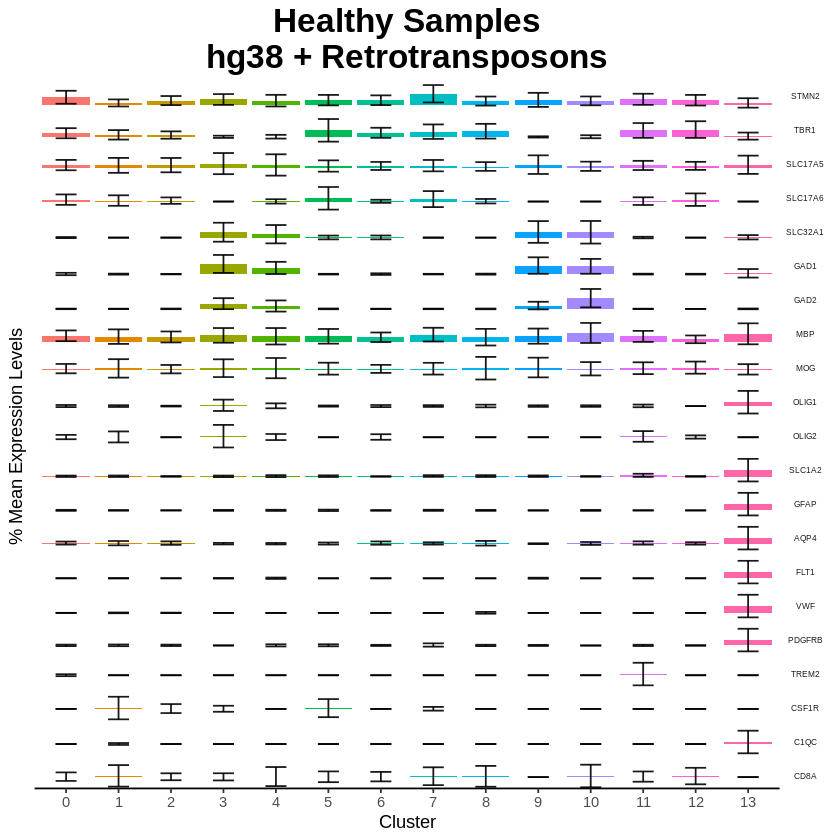

In [231]:
p <- df_ge %>% 
    ggplot(aes(x=cluster, y=Mean, fill=cluster)) + geom_bar( stat="identity", width = 0.9) +
        geom_errorbar( aes(x=cluster, ymin=Mean-Stdev, ymax=Mean+Stdev), width=0.4, colour="black", alpha=0.9, size=0.5) + 
        theme_classic() + 
        ggtitle("Healthy Samples\nhg83") + labs(y = "% Mean Expression Levels", x = "Cluster") +
        theme(legend.position="none", plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
             axis.text.y = element_blank(), axis.ticks.y = element_blank(), axis.line.y = element_blank()) +
        facet_grid(Gene ~ ., scales = "free") + 
        theme(strip.background = element_blank(), strip.text.y = element_text(size = 5, angle = 0))

p2 <- df_gte %>% 
    ggplot(aes(x=cluster, y=Mean, fill=cluster)) + geom_bar( stat="identity", width = 0.9) +
        geom_errorbar( aes(x=cluster, ymin=Mean-Stdev, ymax=Mean+Stdev), width=0.4, colour="black", alpha=0.9, size=0.5) + 
        theme_classic() + 
        ggtitle("Healthy Samples\nhg38 + Retrotransposons") + labs(y = "% Mean Expression Levels", x = "Cluster") +
        theme(legend.position="none", plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
             axis.text.y = element_blank(), axis.ticks.y = element_blank(), axis.line.y = element_blank()) +
        facet_grid(Gene ~ ., scales = "free") + 
        theme(strip.background = element_blank(), strip.text.y = element_text(size = 5, angle= 0))

pg_1 <- ggplotGrob(p)

for(i in which(grepl("strip-r", pg_1$layout$name))){
  pg_1$grobs[[i]]$layout$clip <- "off"
}

pg_2 <- ggplotGrob(p2)

for(i in which(grepl("strip-r", pg_2$layout$name))){
  pg_2$grobs[[i]]$layout$clip <- "off"
}


grid::grid.draw(pg_1)
grid::grid.draw(pg_2)

In [232]:
# Save figures
mkdirToday()
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-06/r_brain_PC14r04_celltypeBAR.pdf", width = size*1.5, height = size*1)
grid.arrange(pg_1, pg_2, nrow=1)
dev.off()

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-08-06"


Warning message in dir.create(file.path(maindir, subdir)):
"'/home/samkyy/scratch/gete-gbm/results/2021-08-06' already exists"


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-08-06"


png 
  2

Create similar bar plot for number of cells from each sample per cluster

In [233]:
Idents(intObjects[[1]]) <- "integrated_snn_res.0.2"
Idents(intObjects[[2]]) <- "integrated_snn_res.0.2"

In [260]:
DefaultAssay(intObjects[[1]]) <- "RNA"
DefaultAssay(intObjects[[2]]) <- "RNA"

sampleNames <- unique(intObjects[[1]]$sample)

df_ge <- intObjects[[1]]@meta.data %>% group_by(sample) %>% count(integrated_snn_res.0.2)
df_ge <- df_ge %>% group_by(integrated_snn_res.0.2) %>% mutate(freq = (n / sum(n))*100)
df_ge$sample <- factor(df_ge$sample, levels = sampleNames)
df_ge

df_gte <- intObjects[[2]]@meta.data %>%
                group_by(sample) %>%
                count(integrated_snn_res.0.2)
df_gte$sample <- factor(df_gte$sample, levels = sampleNames)
df_gte <- df_ge %>% group_by(integrated_snn_res.0.2) %>% mutate(freq = (n / sum(n))*100)
df_gte

sample,integrated_snn_res.0.2,n,freq
<fct>,<fct>,<int>,<dbl>
SRR9264382,0,387,35.054348
SRR9264382,1,134,31.308411
SRR9264382,2,106,27.604167
SRR9264382,3,93,33.214286
SRR9264382,4,54,24.107143
SRR9264382,5,56,33.734940
SRR9264382,6,35,36.082474
SRR9264382,7,34,37.777778
SRR9264382,8,13,22.807018


sample,integrated_snn_res.0.2,n,freq
<fct>,<fct>,<int>,<dbl>
SRR9264382,0,387,35.054348
SRR9264382,1,134,31.308411
SRR9264382,2,106,27.604167
SRR9264382,3,93,33.214286
SRR9264382,4,54,24.107143
SRR9264382,5,56,33.734940
SRR9264382,6,35,36.082474
SRR9264382,7,34,37.777778
SRR9264382,8,13,22.807018


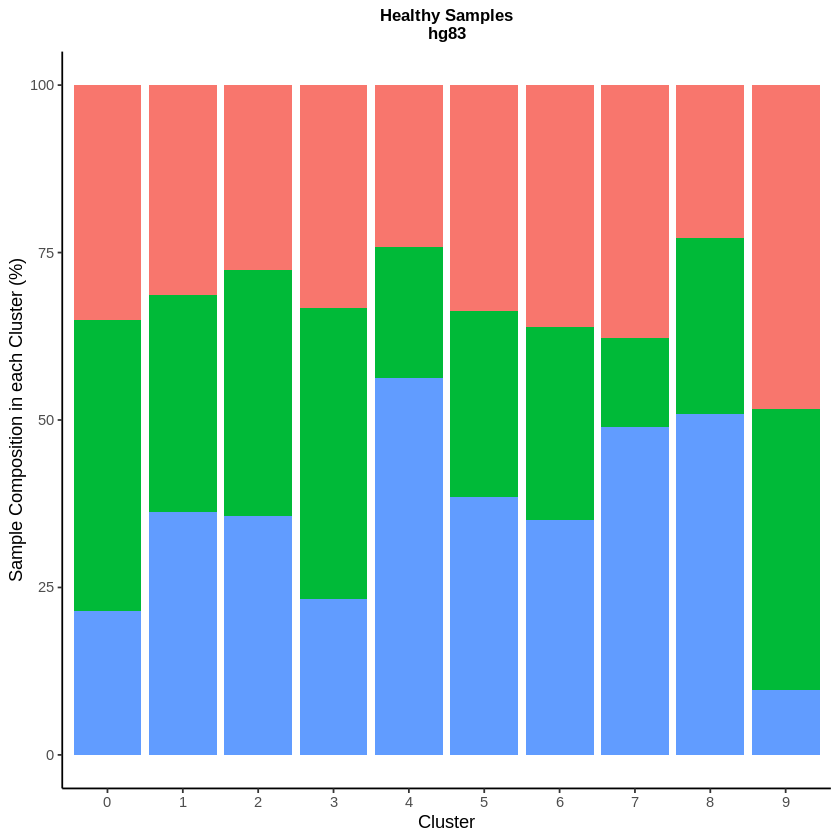

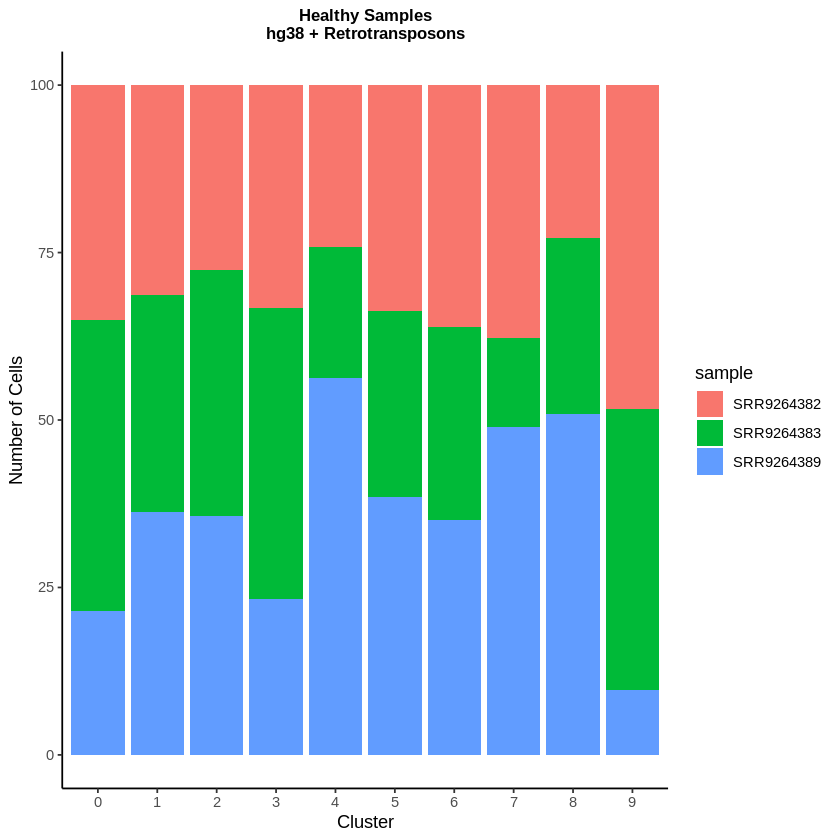

In [261]:
p <- df_ge %>% 
    ggplot(aes(x=integrated_snn_res.0.2, y=freq, fill=sample)) + geom_bar( stat="identity", width = 0.9) + theme_classic() + 
        ggtitle("Healthy Samples\nhg83") + labs(y = "Sample Composition in each Cluster (%)", x = "Cluster") +
        theme(legend.position ="none", plot.title = element_text(hjust = 0.5, size = 10, face = "bold"))

p2 <- df_gte %>% 
    ggplot(aes(x=integrated_snn_res.0.2, y=freq, fill=sample)) + geom_bar( stat="identity", width = 0.9) + theme_classic() + 
        ggtitle("Healthy Samples\nhg38 + Retrotransposons") + labs(y = "Number of Cells", x = "Cluster") +
        theme(plot.title = element_text(hjust = 0.5, size = 10, face = "bold"))

p
p2

In [262]:
# Save figures
mkdirToday()
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-06/r_brain_PC14r02_sampleCompositnBAR.pdf", width = size*1, height = size*0.5)
grid.arrange(p, p2, nrow=1)
dev.off()

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-08-06"


Warning message in dir.create(file.path(maindir, subdir)):
"'/home/samkyy/scratch/gete-gbm/results/2021-08-06' already exists"


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-08-06"


png 
  2

In [263]:
DefaultAssay(intObjects[[1]]) <- "RNA"
DefaultAssay(intObjects[[2]]) <- "RNA"

sampleNames <- unique(intObjects[[1]]$sample)

df_ge <- intObjects[[1]]@meta.data %>% group_by(sample) %>% count(integrated_snn_res.0.4)
df_ge <- df_ge %>% group_by(integrated_snn_res.0.4) %>% mutate(freq = (n / sum(n))*100)
df_ge$sample <- factor(df_ge$sample, levels = sampleNames)
df_ge

df_gte <- intObjects[[2]]@meta.data %>% group_by(sample) %>% count(integrated_snn_res.0.4)
df_gte <- df_ge %>% group_by(integrated_snn_res.0.4) %>% mutate(freq = (n / sum(n))*100)
df_gte$sample <- factor(df_gte$sample, levels = sampleNames)
df_gte

sample,integrated_snn_res.0.4,n,freq
<fct>,<fct>,<int>,<dbl>
SRR9264382,0,181,44.801980
SRR9264382,1,131,32.997481
SRR9264382,2,76,25.000000
SRR9264382,3,85,30.141844
SRR9264382,4,93,33.214286
SRR9264382,5,63,25.819672
SRR9264382,6,53,23.766816
SRR9264382,7,71,38.586957
SRR9264382,8,56,33.734940


sample,integrated_snn_res.0.4,n,freq
<fct>,<fct>,<int>,<dbl>
SRR9264382,0,181,44.801980
SRR9264382,1,131,32.997481
SRR9264382,2,76,25.000000
SRR9264382,3,85,30.141844
SRR9264382,4,93,33.214286
SRR9264382,5,63,25.819672
SRR9264382,6,53,23.766816
SRR9264382,7,71,38.586957
SRR9264382,8,56,33.734940


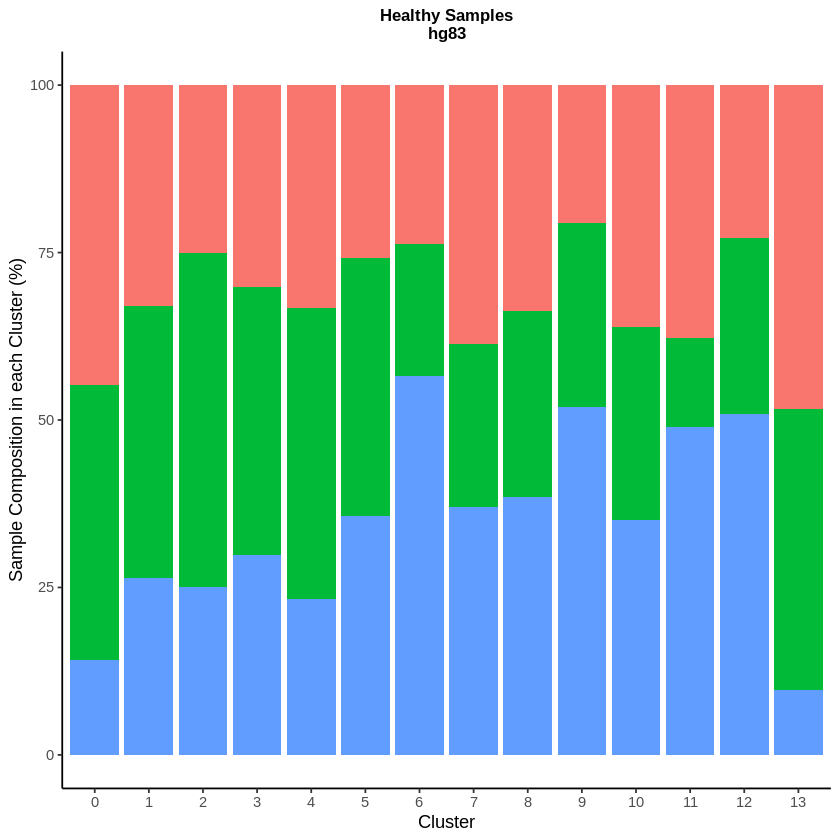

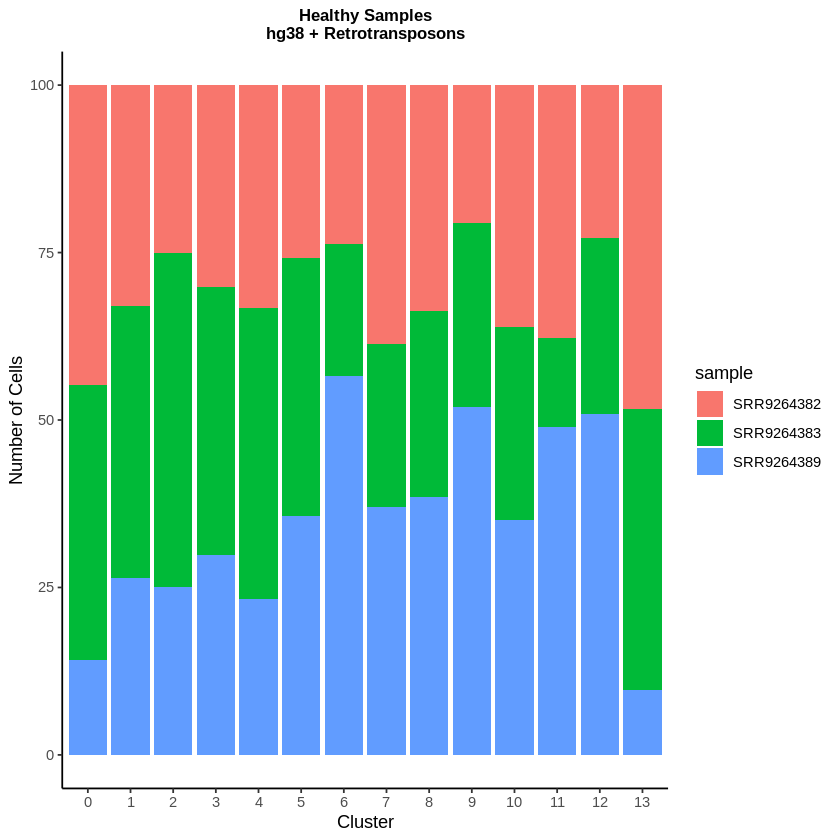

In [264]:
p <- df_ge %>% 
    ggplot(aes(x=integrated_snn_res.0.4, y=freq, fill=sample)) + geom_bar( stat="identity", width = 0.9) + theme_classic() + 
        ggtitle("Healthy Samples\nhg83") + labs(y = "Sample Composition in each Cluster (%)", x = "Cluster") +
        theme(legend.position ="none", plot.title = element_text(hjust = 0.5, size = 10, face = "bold"))

p2 <- df_gte %>% 
    ggplot(aes(x=integrated_snn_res.0.4, y=freq, fill=sample)) + geom_bar( stat="identity", width = 0.9) + theme_classic() + 
        ggtitle("Healthy Samples\nhg38 + Retrotransposons") + labs(y = "Number of Cells", x = "Cluster") +
        theme(plot.title = element_text(hjust = 0.5, size = 10, face = "bold"))

p
p2

In [265]:
# Save figures
mkdirToday()
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-06/r_brain_PC14r04_sampleCompositnBAR.pdf", width = size*1, height = size*0.5)
grid.arrange(p, p2, nrow=1)
dev.off()

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-08-06"


Warning message in dir.create(file.path(maindir, subdir)):
"'/home/samkyy/scratch/gete-gbm/results/2021-08-06' already exists"


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-08-06"


png 
  2

Feature Plots of each brain_marker gene

In [281]:
DefaultAssay(intObjects[[1]]) <- "RNA"
DefaultAssay(intObjects[[2]]) <- "RNA"

Idents(intObjects[[1]]) <- "integrated_snn_res.0.2"
Idents(intObjects[[2]]) <- "integrated_snn_res.0.2"

p <- FeaturePlot(intObjects[[1]], features = brain_markers, reduction = "umap")
p2 <- FeaturePlot(intObjects[[2]], features = brain_markers, reduction = "umap")

# Save figures
mkdirToday()
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-06/r_brain_PC14r02_brainMarkersFeaturePlots.pdf", width = size*2, height = size*3)
p
p2
dev.off()

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-08-06"


Warning message in dir.create(file.path(maindir, subdir)):
"'/home/samkyy/scratch/gete-gbm/results/2021-08-06' already exists"


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-08-06"


png 
  2

In [282]:
DefaultAssay(intObjects[[1]]) <- "RNA"
DefaultAssay(intObjects[[2]]) <- "RNA"

Idents(intObjects[[1]]) <- "integrated_snn_res.0.4"
Idents(intObjects[[2]]) <- "integrated_snn_res.0.4"

p <- FeaturePlot(intObjects[[1]], features = brain_markers, reduction = "umap")
p2 <- FeaturePlot(intObjects[[2]], features = brain_markers, reduction = "umap")

# Save figures
mkdirToday()
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-06/r_brain_PC14r04_brainMarkersFeaturePlots.pdf", width = size*2, height = size*3)
p
p2
dev.off()

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-08-06"


Warning message in dir.create(file.path(maindir, subdir)):
"'/home/samkyy/scratch/gete-gbm/results/2021-08-06' already exists"


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-08-06"


png 
  2

2021-08-11: Create heatmap with brain markers

In [11]:
DefaultAssay(intObjects[[1]]) <- "integrated"
DefaultAssay(intObjects[[2]]) <- "integrated"
brain_markers <- c('STMN2', 'TBR1', 'SLC17A5', 'SLC17A6', 'SLC32A1', 'GAD1', 'GAD2', 'MBP', 'MOG', 'OLIG1', 'OLIG2',
                   'SLC1A2', 'GFAP', 'AQP4', 'FLT1', 'VWF', 'PDGFRB', 'TREM2', 'CSF1R', 'C1QC', 'CD8A' ) 

Warning message in DoHeatmap(intObjects[[1]], features = brain_markers):
"The following features were omitted as they were not found in the scale.data slot for the integrated assay: CD8A, C1QC, CSF1R, TREM2, OLIG2, MOG, MBP, SLC17A5"


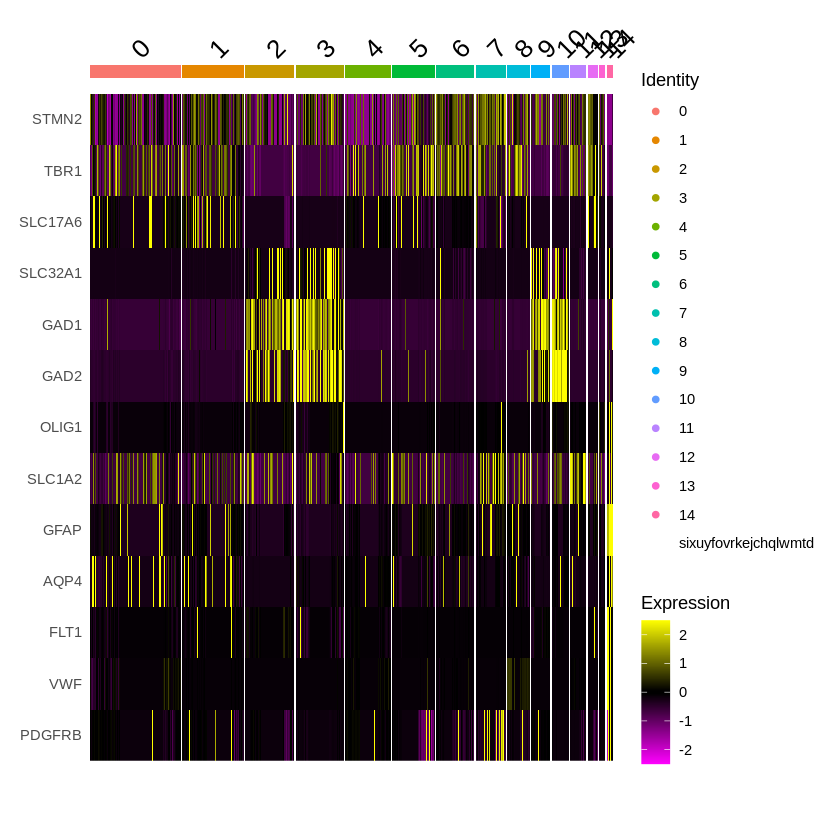

In [12]:
DoHeatmap(intObjects[[1]], features=brain_markers)

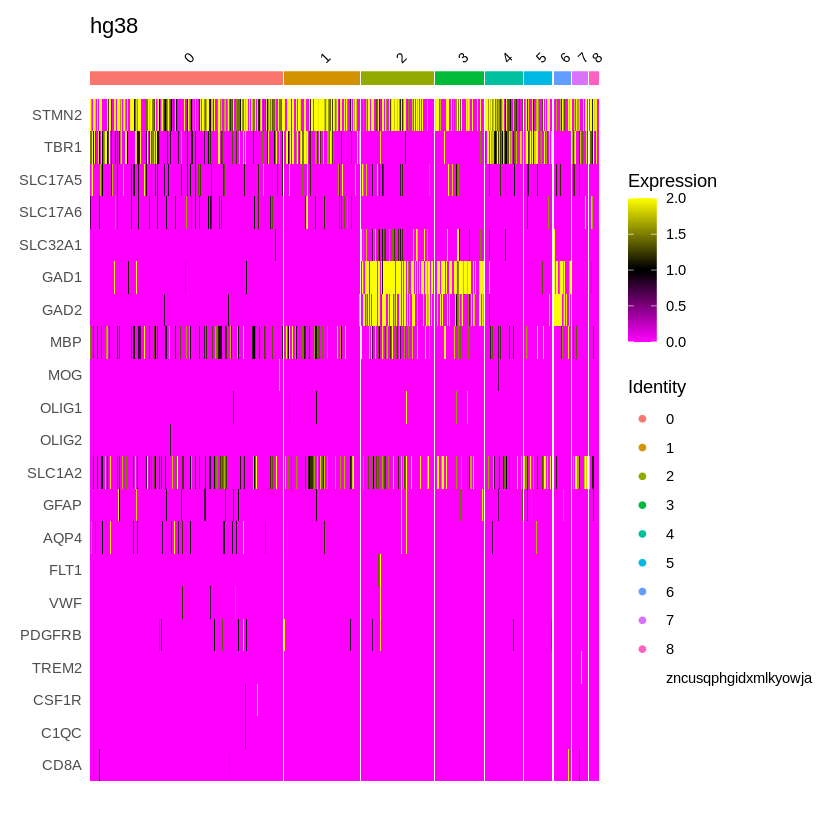

[1] "Current working directory: /scratch/samkyy/gete-gbm/results"
[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-08-11"


png 
  2

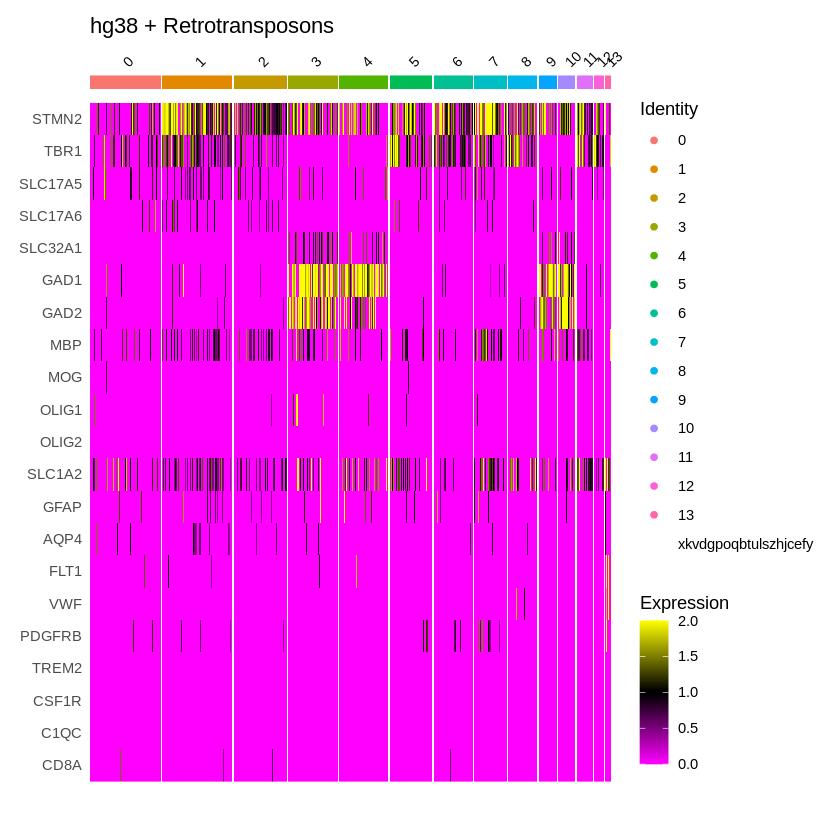

In [25]:
DefaultAssay(intObjects[[1]]) <- "RNA"
DefaultAssay(intObjects[[2]]) <- "RNA"

Idents(intObjects[[1]]) <- "integrated_snn_res.0.2"
Idents(intObjects[[1]]) <- "integrated_snn_res.0.2"

p <- DoHeatmap(intObjects[[1]], features=brain_markers, slot="data", disp.min=0, disp.max=2, size=3) +
        ggtitle("hg38")
p2 <- DoHeatmap(intObjects[[2]], features=brain_markers, slot="data", disp.min=0, disp.max=2, size=3) + 
        ggtitle("hg38 + Retrotransposons")
p
p2
# Save figures
mkdirToday()
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-11/r_brain_PC14r02_brainMarkersHeatmaps.pdf", width = size*2.5, height = size)
grid.arrange(p, p2, nrow = 1, top="Healthy Brain Samples: Heatmap of Known Brain tissue markers")
dev.off()

In [27]:
# Ridge plots - from ggridges. Visualize single cell expression distributions in each cluster
p <- RidgePlot(intObjects[[1]], features = brain_markers, ncol = 3)
p2 <- RidgePlot(intObjects[[2]], features = brain_markers, ncol = 3)


# Save figures
mkdirToday()
size = 7
pdf("~/scratch/gete-gbm/results/2021-08-11/r_brain_PC14r02_brainMarkersRidgePlot.pdf", width = size*2.5, height = size*5)
p
p2
dev.off()

[1] "Current working directory: /scratch/samkyy/gete-gbm/results/2021-08-11"


Warning message in dir.create(file.path(maindir, subdir)):
"'/home/samkyy/scratch/gete-gbm/results/2021-08-11' already exists"


[1] "New working directory: /scratch/samkyy/gete-gbm/results/2021-08-11"


Picking joint bandwidth of 0.308

Picking joint bandwidth of 0.177

Picking joint bandwidth of 4.08e-06

Picking joint bandwidth of 3.3e-06

Picking joint bandwidth of 0.0225

Picking joint bandwidth of 0.105

Picking joint bandwidth of 0.102

Picking joint bandwidth of 0.102

Picking joint bandwidth of 3.12e-06

Picking joint bandwidth of 3.22e-06

Picking joint bandwidth of 3.18e-06

Picking joint bandwidth of 0.139

Picking joint bandwidth of 3.37e-06

Picking joint bandwidth of 3.24e-06

Picking joint bandwidth of 3.24e-06

Picking joint bandwidth of 3.13e-06

Picking joint bandwidth of 3.29e-06

Picking joint bandwidth of 3.1e-06

Picking joint bandwidth of 3.1e-06

Picking joint bandwidth of 3.09e-06

Picking joint bandwidth of 3.27e-06

Picking joint bandwidth of 0.22

Picking joint bandwidth of 0.126

Picking joint bandwidth of 4.11e-06

Picking joint bandwidth of 3.38e-06

Picking joint bandwidth of 0.0271

Picking joint bandwidth of 0.0785

Picking joint bandwidth of 0.0826



png 
  2

## End of the Notebook

In [9]:
ls()

[1] "mkdirToday"  "resultsPath" "setwdToday"

In [223]:
sessionInfo()

R version 4.0.2 (2020-06-22)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /cvmfs/soft.computecanada.ca/easybuild/software/2020/Core/imkl/2020.1.217/compilers_and_libraries_2020.1.217/linux/mkl/lib/intel64_lin/libmkl_gf_lp64.so

locale:
 [1] LC_CTYPE=en_CA.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_CA.UTF-8        LC_COLLATE=en_CA.UTF-8    
 [5] LC_MONETARY=en_CA.UTF-8    LC_MESSAGES=en_CA.UTF-8   
 [7] LC_PAPER=en_CA.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_CA.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
 [1] grid      stats4    parallel  stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] ggforce_0.3.3           RColorBrewer_1.1-2      GO.db_3.12.1           
 [4] org.Hs.eg.db_3.12.0     GOstats_2.56.0          graph_1.68.0           
 [7] Category_2.56.0     